### Load Required Libraries

In [ ]:
# !pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 7.1 MB/s eta 0:00:00


In [ ]:
# !pip install yellowbrick

In [ ]:
# !pip install kmodes

In [ ]:
# !pip install factor_analyzer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 2.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for factor_analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42655 sha256=0c3a8988abb075165f2e093e73c9062bd628b408c8d7da93705ccae15a73e74b
  Stored in directory: /root/.cache/pip/wheels/fa/f7/53/a55a8a56668a6fe0199e0e02b6e0ae3007ec35cdf6e4c25df7
Successfully built factor_analyzer


In [ ]:
# !pip install scikit-learn-extra

  Using cached scikit_learn_extra-0.3.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.6 kB)
Using cached scikit_learn_extra-0.3.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.1 MB)


In [ ]:
# !pip install gower

In [ ]:
# !pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 4.8 MB/s eta 0:00:00


In [ ]:
# !pip uninstall numpy -y
# !pip uninstall scikit-learn-extra -y
# !pip install numpy==1.24.4  # Install a compatible NumPy version
# !pip install scikit-learn-extra

Found existing installation: numpy 1.24.4
Uninstalling numpy-1.24.4:
  Successfully uninstalled numpy-1.24.4
Found existing installation: scikit-learn-extra 0.3.0
Uninstalling scikit-learn-extra-0.3.0:
  Successfully uninstalled scikit-learn-extra-0.3.0
  Using cached numpy-1.24.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.6 kB)
Using cached numpy-1.24.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
blosc2 3.3.4 requires numpy>=1.26, but you have numpy 1.24.4 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.24.4 which is incompatible.
treescope 0.1.9 requires numpy>=1.25.2, but you have numpy 1.24.4 which is incompatible.
xarray-einstats 0.9.0 requ

  Using cached scikit_learn_extra-0.3.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.6 kB)
Using cached scikit_learn_extra-0.3.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.1 MB)
^C


In [ ]:
from google.colab import drive
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder, FunctionTransformer
from kmodes.kprototypes import KPrototypes
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from statsmodels.stats.outliers_influence import variance_inflation_factor
from factor_analyzer import calculate_kmo
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn_extra.cluster import KMedoids
import gower
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score, mean_absolute_error, mean_squared_error, r2_score, accuracy_score, roc_curve, auc
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
import lightgbm as lgb
import joblib
import scipy.stats as stats
import pylab
import re
import warnings

warnings.filterwarnings('ignore')

### Load Datasets

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
PATH = '/content/drive/MyDrive/1 Serba Serbi Kuliah/Lomba/Disco/'

In [ ]:
# Membaca file lokal CSV ke dalam dataframe
df = pd.read_csv(r'https://raw.githubusercontent.com/drtaufiqh/csv-coba-coba/refs/heads/main/dataset_disco.csv')
df

,id_umkm,nama_usaha,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan
0,28828567,UD. Alif Pamungkas,Kesehatan,1,56,5497149,3347794,Tokopedia,479,Belum Terdaftar,2015,-2149355,171000000,479
1,28828568,UD. Zidanar Panji,Perdagangan,5,44,7398384,39969661,Bukalapak,464,Terdaftar,2014,32571277,147000000,464
2,28828569,UD. Winda Jayengprana,unknown,74,51,8881762,25253355,Website Sendiri,383,Belum Terdaftar,2000,16371593,375000000,383
3,28828570,UD. Damaris Satria,Jasa,89,5,9576178,20700389,Website Sendiri,986,Belum Terdaftar,2003,11124211,282000000,986
4,28828571,UD. Qasya Wiratama,Jasa,91,59,9456853,4820810,Lazada,314,Belum Terdaftar,2002,-4636043,450000000,314
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,288222126,UD. Syana Ilir Rian,Jasa,62,63,6854562,48239150,Website Sendiri,162,Belum Terdaftar,2003,41384588,375000000,162
13560,288222127,UD. Bela Widhi,Pendidikan,70,50,804787,35210634,Website Sendiri,180,Terdaftar,2012,34405847,360000000,180
13561,288222128,UD. Bayu Alam,Kesehatan,50,37,8211715,8874364,Lazada,802,Terdaftar,2009,662649,261000000,802
13562,288222129,UD. Olla Sudharmo Udin,Pendidikan,11,NaN,6217989,41510653,Website Sendiri,122,Belum Terdaftar,2009,35292664,132000000,122


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13564 entries, 0 to 13563
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   id_umkm                 13467 non-null  object
 1   nama_usaha              13564 non-null  object
 2   jenis_usaha             13467 non-null  object
 3   tenaga_kerja_perempuan  13444 non-null  object
 4   tenaga_kerja_laki_laki  13462 non-null  object
 5   aset                    13453 non-null  object
 6   omset                   13451 non-null  object
 7   marketplace             13447 non-null  object
 8   kapasitas_produksi      13442 non-null  object
 9   status_legalitas        13470 non-null  object
 10  tahun_berdiri           13469 non-null  object
 11  laba                    13452 non-null  object
 12  biaya_karyawan          13469 non-null  object
 13  jumlah_pelanggan        13453 non-null  object
dtypes: object(14)
memory usage: 1.4+ MB


# Data Understanding

Nama Kolom: Deskripsi Kolom
- id_umkm: id_unik yang diberikan kepada setiap UMKM
- nama_usaha: Nama usaha dari masing masing UMKM
- tenaga_kerja_perempuan: Jumlah tenaga_kerja_perempuan yang bekerja di UMKM tersebut
- tenaga_kerja_laki_laki: Jumlah tenaga_kerja_laki-laki yang bekerja di UMKM tersebut
- aset: Nilai total aset yang dimiliki oleh UMKM
- omset: Total pendapatan atau omset yang dihasilkan oleh UMKM (Penghasilan Keseluruhan Bersih+Kotor)
- marketplace: Platform atau saluran penjualan yang digunakan oleh UMKM untuk menjual produk mereka
- kapasitas_produksi: Jumlah produk yang dapat diproduksi oleh UMKM dalam periode tertentu.
- status_legalitas: Status hukum atau legalitas UMKM, apakah sudah terdaftar atau belum.
- laba: Jumlah laba yang dihasilkan oleh UMKM dalam periode tertentu
- tahun_berdiri: Tahun di mana UMKM tersebut mulai berdiri atau didirikan.
- biaya_karyawan: Jumlah biaya yang dikeluarkan untuk membayar tenaga kerja karyawan UMKM
- jumlah_pelanggan: Jumlah pelanggan yang dilayani atau dijangkau oleh UMKM

In [ ]:
df.describe()

,id_umkm,nama_usaha,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan
count,13467,13564,13467,13444,13462,13453,13451,13447,13442,13470,13469,13452,13469,13453
unique,13439,13564,8,101,101,13410,13422,6,991,3,26,13406,200,991
top,unknown,UD. Alif Pamungkas,Jasa,3,47,unknown,unknown,Website Sendiri,unknown,Terdaftar,2024,unknown,312000000,unknown
freq,29,1,3403,158,167,31,28,2758,42,6896,565,45,150,41


In [ ]:
df_new = df.drop(columns=['id_umkm', 'nama_usaha'])

# Menampilkan DataFrame hasil setelah penghapusan kolom
df_new

,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan
0,Kesehatan,1,56,5497149,3347794,Tokopedia,479,Belum Terdaftar,2015,-2149355,171000000,479
1,Perdagangan,5,44,7398384,39969661,Bukalapak,464,Terdaftar,2014,32571277,147000000,464
2,unknown,74,51,8881762,25253355,Website Sendiri,383,Belum Terdaftar,2000,16371593,375000000,383
3,Jasa,89,5,9576178,20700389,Website Sendiri,986,Belum Terdaftar,2003,11124211,282000000,986
4,Jasa,91,59,9456853,4820810,Lazada,314,Belum Terdaftar,2002,-4636043,450000000,314
...,...,...,...,...,...,...,...,...,...,...,...,...
13559,Jasa,62,63,6854562,48239150,Website Sendiri,162,Belum Terdaftar,2003,41384588,375000000,162
13560,Pendidikan,70,50,804787,35210634,Website Sendiri,180,Terdaftar,2012,34405847,360000000,180
13561,Kesehatan,50,37,8211715,8874364,Lazada,802,Terdaftar,2009,662649,261000000,802
13562,Pendidikan,11,NaN,6217989,41510653,Website Sendiri,122,Belum Terdaftar,2009,35292664,132000000,122


# Eksplorasi Data

## Langkah 1: Identifikasi Missing Value

In [ ]:
# ganti semua 'unknown' menhadu na
df_new = df_new.replace('unknown', np.nan)
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13564 entries, 0 to 13563
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   jenis_usaha             13433 non-null  object
 1   tenaga_kerja_perempuan  13408 non-null  object
 2   tenaga_kerja_laki_laki  13429 non-null  object
 3   aset                    13422 non-null  object
 4   omset                   13423 non-null  object
 5   marketplace             13411 non-null  object
 6   kapasitas_produksi      13400 non-null  object
 7   status_legalitas        13434 non-null  object
 8   tahun_berdiri           13436 non-null  object
 9   laba                    13407 non-null  object
 10  biaya_karyawan          13430 non-null  object
 11  jumlah_pelanggan        13412 non-null  object
dtypes: object(12)
memory usage: 1.2+ MB


In [ ]:
# Ubah tipe data
numerical_columns = [
    'tenaga_kerja_perempuan',
    'tenaga_kerja_laki_laki',
    'aset',
    'omset',
    'kapasitas_produksi',
    'tahun_berdiri',
    'laba',
    'biaya_karyawan',
    'jumlah_pelanggan',
    ]

categorical_columns = [
    'jenis_usaha',
    'status_legalitas',
    'marketplace',
    ]

for col in numerical_columns:
  df_new[col] = pd.to_numeric(df_new[col], errors='coerce')

for col in categorical_columns:
  df_new[col] = df_new[col].astype('category')

df_new.info()
print(df_new.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13564 entries, 0 to 13563
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   jenis_usaha             13433 non-null  category
 1   tenaga_kerja_perempuan  13408 non-null  float64 
 2   tenaga_kerja_laki_laki  13429 non-null  float64 
 3   aset                    13422 non-null  float64 
 4   omset                   13423 non-null  float64 
 5   marketplace             13411 non-null  category
 6   kapasitas_produksi      13400 non-null  float64 
 7   status_legalitas        13434 non-null  category
 8   tahun_berdiri           13436 non-null  float64 
 9   laba                    13407 non-null  float64 
 10  biaya_karyawan          13430 non-null  float64 
 11  jumlah_pelanggan        13412 non-null  float64 
dtypes: category(3), float64(9)
memory usage: 994.3 KB
   jenis_usaha  tenaga_kerja_perempuan  tenaga_kerja_laki_laki       aset  \
0  

In [ ]:
df_new.isna().sum()/df_new.count()*100

,0
jenis_usaha,0.975210
tenaga_kerja_perempuan,1.163484
tenaga_kerja_laki_laki,1.005287
aset,1.057965
omset,1.050436
marketplace,1.140855
kapasitas_produksi,1.223881
status_legalitas,0.967694
tahun_berdiri,0.952664
laba,1.171030


## Langkah 2: Identifikasi Distribusi Data

In [ ]:
# Menampilkan nilai unik dan banyaknya nilai unik
for col in categorical_columns:
    unique_values = df_new[col].dropna().unique()  # Menghapus nilai NaN sebelum mencari nilai unik
    print(f"Kolom: {col}")
    print(f"Nilai unik: {unique_values}")
    print(f"Jumlah nilai unik: {len(unique_values)}\n")

Kolom: jenis_usaha
Nilai unik: ['Kesehatan', 'Perdagangan', 'Jasa', 'Pendidikan', 'Fashion', 'Makanan & Minuman', 'Perusahaan']
Categories (7, object): ['Fashion', 'Jasa', 'Kesehatan', 'Makanan & Minuman', 'Pendidikan',
                         'Perdagangan', 'Perusahaan']
Jumlah nilai unik: 7

Kolom: status_legalitas
Nilai unik: ['Belum Terdaftar', 'Terdaftar']
Categories (2, object): ['Belum Terdaftar', 'Terdaftar']
Jumlah nilai unik: 2

Kolom: marketplace
Nilai unik: ['Tokopedia', 'Bukalapak', 'Website Sendiri', 'Lazada', 'Shopee']
Categories (5, object): ['Bukalapak', 'Lazada', 'Shopee', 'Tokopedia', 'Website Sendiri']
Jumlah nilai unik: 5



In [ ]:
df_new[categorical_columns].describe()

,jenis_usaha,status_legalitas,marketplace
count,13433,13434,13411
unique,7,2,5
top,Jasa,Terdaftar,Website Sendiri
freq,3403,6896,2758


In [ ]:
df_new[numerical_columns].describe()

,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,kapasitas_produksi,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan
count,13408.000000,13429.000000,1.342200e+04,1.342300e+04,13400.000000,13436.000000,1.340700e+04,1.343000e+04,13412.000000
mean,49.699359,49.138432,5.223369e+06,2.555608e+07,499.804776,2012.028654,2.033591e+07,2.963712e+08,499.655309
std,29.050398,29.045802,2.736183e+06,1.421404e+07,285.718098,7.263471,1.450188e+07,1.228961e+08,285.428202
min,0.000000,0.000000,5.002330e+05,1.000509e+06,10.000000,2000.000000,-8.838836e+06,0.000000e+00,10.000000
25%,24.000000,24.000000,2.842985e+06,1.324269e+07,250.000000,2006.000000,8.035038e+06,2.070000e+08,250.000000
50%,50.000000,49.000000,5.211246e+06,2.561180e+07,501.000000,2012.000000,2.047409e+07,2.970000e+08,501.000000
75%,75.000000,74.000000,7.573606e+06,3.772234e+07,746.000000,2018.000000,3.265150e+07,3.840000e+08,745.250000
max,99.000000,99.000000,9.999760e+06,4.999970e+07,999.000000,2024.000000,4.919930e+07,5.940000e+08,999.000000


In [ ]:
len(numerical_columns)

9

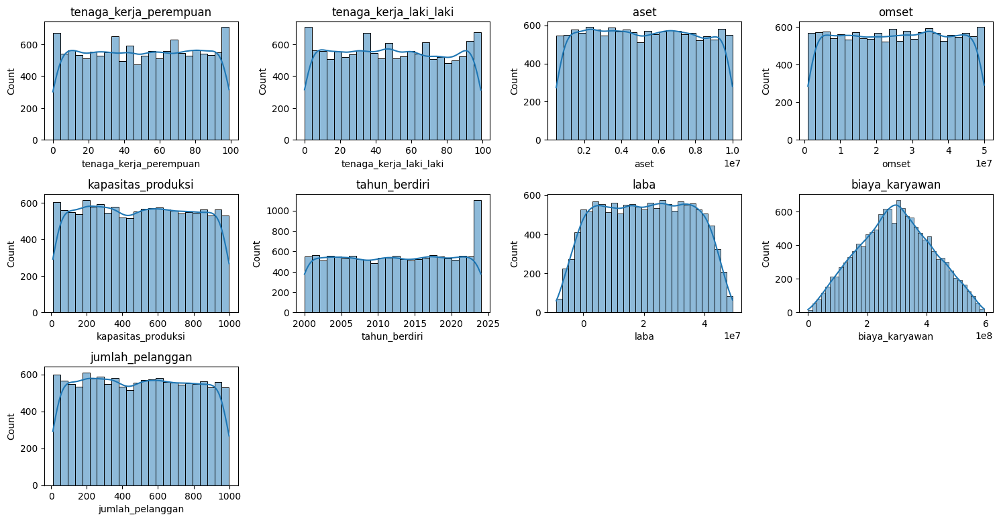

In [ ]:
# Histogram distribusi data numerik dalam 1 gambar
plt.figure(figsize=(15, 10))

# Iterasi melalui setiap kolom numerik dalam DataFrame
for i, col in enumerate(df_new.select_dtypes(include=np.number).columns):
    plt.subplot(4, 4, i + 1)  # Membuat subplot 3x4
    sns.histplot(df_new[col], kde=True)  # Plot histogram dengan KDE
    plt.title(col)  # Judul subplot

plt.tight_layout()
plt.show()

## Langkah 3: Identifikasi Outlier

In [ ]:
def detect_outliers_iqr(data, column):
    """Detects outliers in a given column using the IQR method.

    Args:
        data: pandas DataFrame containing the data.
        column: Name of the column to analyze.

    Returns:
        A pandas Series with boolean values indicating whether each data point is an outlier.
    """

    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = (data[column] < lower_bound) | (data[column] > upper_bound)

    return outliers

outliers_laba = detect_outliers_iqr(df_new, 'laba')

# Print the indices of the outliers
print("Indices of outliers in laba column:", outliers_laba[outliers_laba].index.tolist())


def detect_outliers_zscore(data, column, threshold=3):
    """Detects outliers in a given column using the Z-score method.

    Args:
        data: pandas DataFrame containing the data.
        column: Name of the column to analyze.
        threshold: The Z-score threshold for identifying outliers. Default is 3.

    Returns:
        A pandas Series with boolean values indicating whether each data point is an outlier.
    """

    z_scores = np.abs(stats.zscore(data[column]))
    outliers = z_scores > threshold
    return outliers

for col in numerical_columns:
    outliers_iqr = detect_outliers_iqr(df_new, col)
    outliers_zscore = detect_outliers_zscore(df_new, col)
    print(f"Kolom: {col}")
    print(f"Outliers (IQR): {outliers_iqr.sum()}")
    print(f"Outliers (Z-score): {outliers_zscore.sum()}\n")

Indices of outliers in laba column: []
Kolom: tenaga_kerja_perempuan
Outliers (IQR): 0
Outliers (Z-score): 0

Kolom: tenaga_kerja_laki_laki
Outliers (IQR): 0
Outliers (Z-score): 0

Kolom: aset
Outliers (IQR): 0
Outliers (Z-score): 0

Kolom: omset
Outliers (IQR): 0
Outliers (Z-score): 0

Kolom: kapasitas_produksi
Outliers (IQR): 0
Outliers (Z-score): 0

Kolom: tahun_berdiri
Outliers (IQR): 0
Outliers (Z-score): 0

Kolom: laba
Outliers (IQR): 0
Outliers (Z-score): 0

Kolom: biaya_karyawan
Outliers (IQR): 0
Outliers (Z-score): 0

Kolom: jumlah_pelanggan
Outliers (IQR): 0
Outliers (Z-score): 0



# Manipulasi Data

## Langkah 1: Label Encoding & Imputasi Data

In [ ]:
from sklearn.preprocessing import LabelEncoder

df_LE = df_new.copy()
encoders = {}
label_mappings = {}

for col in categorical_columns:
    le = LabelEncoder()

    # Pastikan tipe kolom adalah object/string, bukan category
    df_LE[col] = df_LE[col].astype(object)

    # Mask untuk data yang tidak missing
    non_nan_mask = df_LE[col].notna()

    # Encode hanya yang tidak NaN
    df_LE.loc[non_nan_mask, col] = le.fit_transform(df_LE.loc[non_nan_mask, col].astype(str))

    # Simpan encoder dan mapping
    encoders[col] = le
    label_mappings[col] = dict(zip(le.classes_, le.transform(le.classes_)))

    # Convert kolom ke float supaya NaN bisa tetap ditampung
    df_LE[col] = pd.to_numeric(df_LE[col], errors='coerce')

    print(f"Label Encoding untuk kolom '{col}': {label_mappings[col]}")

# 4. Imputasi untuk kolom kategorikal & numerical menggunakan KNN
knn_imputer = KNNImputer(n_neighbors=5)
df_LE[numerical_columns + categorical_columns] = knn_imputer.fit_transform(df_LE[numerical_columns + categorical_columns])

# 6. Menampilkan DataFrame setelah imputasi
df_LE

Label Encoding untuk kolom 'jenis_usaha': {'Fashion': 0, 'Jasa': 1, 'Kesehatan': 2, 'Makanan & Minuman': 3, 'Pendidikan': 4, 'Perdagangan': 5, 'Perusahaan': 6}
Label Encoding untuk kolom 'status_legalitas': {'Belum Terdaftar': 0, 'Terdaftar': 1}
Label Encoding untuk kolom 'marketplace': {'Bukalapak': 0, 'Lazada': 1, 'Shopee': 2, 'Tokopedia': 3, 'Website Sendiri': 4}


,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan
0,2.0,1.0,56.0,5497149.0,3347794.0,3.0,479.0,0.0,2015.0,-2149355.0,171000000.0,479.0
1,5.0,5.0,44.0,7398384.0,39969661.0,0.0,464.0,1.0,2014.0,32571277.0,147000000.0,464.0
2,2.4,74.0,51.0,8881762.0,25253355.0,4.0,383.0,0.0,2000.0,16371593.0,375000000.0,383.0
3,1.0,89.0,5.0,9576178.0,20700389.0,4.0,986.0,0.0,2003.0,11124211.0,282000000.0,986.0
4,1.0,91.0,59.0,9456853.0,4820810.0,1.0,314.0,0.0,2002.0,-4636043.0,450000000.0,314.0
...,...,...,...,...,...,...,...,...,...,...,...,...
13559,1.0,62.0,63.0,6854562.0,48239150.0,4.0,162.0,0.0,2003.0,41384588.0,375000000.0,162.0
13560,4.0,70.0,50.0,804787.0,35210634.0,4.0,180.0,1.0,2012.0,34405847.0,360000000.0,180.0
13561,2.0,50.0,37.0,8211715.0,8874364.0,1.0,802.0,1.0,2009.0,662649.0,261000000.0,802.0
13562,4.0,11.0,44.6,6217989.0,41510653.0,4.0,122.0,0.0,2009.0,35292664.0,132000000.0,122.0


In [ ]:
df_sebelum_scaling = df_LE.copy()
df_sebelum_scaling['nama_usaha'] = df['nama_usaha']
# simpan dalam csv
df_sebelum_scaling.to_csv(PATH + 'df_sebelum_scaling.csv', index=False)
df_sebelum_scaling

,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan,nama_usaha
0,2.0,1.0,56.0,5497149.0,3347794.0,3.0,479.0,0.0,2015.0,-2149355.0,171000000.0,479.0,UD. Alif Pamungkas
1,5.0,5.0,44.0,7398384.0,39969661.0,0.0,464.0,1.0,2014.0,32571277.0,147000000.0,464.0,UD. Zidanar Panji
2,2.4,74.0,51.0,8881762.0,25253355.0,4.0,383.0,0.0,2000.0,16371593.0,375000000.0,383.0,UD. Winda Jayengprana
3,1.0,89.0,5.0,9576178.0,20700389.0,4.0,986.0,0.0,2003.0,11124211.0,282000000.0,986.0,UD. Damaris Satria
4,1.0,91.0,59.0,9456853.0,4820810.0,1.0,314.0,0.0,2002.0,-4636043.0,450000000.0,314.0,UD. Qasya Wiratama
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,1.0,62.0,63.0,6854562.0,48239150.0,4.0,162.0,0.0,2003.0,41384588.0,375000000.0,162.0,UD. Syana Ilir Rian
13560,4.0,70.0,50.0,804787.0,35210634.0,4.0,180.0,1.0,2012.0,34405847.0,360000000.0,180.0,UD. Bela Widhi
13561,2.0,50.0,37.0,8211715.0,8874364.0,1.0,802.0,1.0,2009.0,662649.0,261000000.0,802.0,UD. Bayu Alam
13562,4.0,11.0,44.6,6217989.0,41510653.0,4.0,122.0,0.0,2009.0,35292664.0,132000000.0,122.0,UD. Olla Sudharmo Udin


## Langkah 2: Standarisasi Data

In [ ]:
# 1. Pilih kolom yang ingin distandarisasi
columns_to_standardize = [col for col in numerical_columns if col not in ['laba']]

# 2. Membuat objek StandardScaler
scaler = StandardScaler()

# 3. Melakukan standarisasi pada kolom yang dipilih
df_LE[columns_to_standardize] = scaler.fit_transform(df_LE[columns_to_standardize])

# 4. Menampilkan DataFrame setelah standarisasi
df_LE

,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan
0,2.0,-1.684184,0.237175,0.100419,-1.564612,3.0,-0.073147,0.0,0.411112,-2149355.0,-1.024389,-0.073412
1,5.0,-1.545874,-0.177616,0.796430,1.015500,0.0,-0.125908,1.0,0.272922,32571277.0,-1.220465,-0.126204
2,2.4,0.839978,0.064346,1.339470,-0.021305,4.0,-0.410817,0.0,-1.661738,16371593.0,0.642255,-0.411281
3,1.0,1.358641,-1.525687,1.593684,-0.342074,4.0,1.710176,0.0,-1.247168,11124211.0,-0.117539,1.710959
4,1.0,1.427796,0.340873,1.550002,-1.460834,1.0,-0.653518,0.0,-1.385358,-4636043.0,1.254992,-0.654124
...,...,...,...,...,...,...,...,...,...,...,...,...
13559,1.0,0.425047,0.479137,0.597345,1.598108,4.0,-1.188163,0.0,-1.247168,41384588.0,0.642255,-1.189083
13560,4.0,0.701667,0.029780,-1.617378,0.680213,4.0,-1.124850,1.0,-0.003458,34405847.0,0.519707,-1.125733
13561,2.0,0.010116,-0.419577,1.094177,-1.175250,1.0,1.062974,1.0,-0.418028,662649.0,-0.289105,1.063377
13562,4.0,-1.338408,-0.156876,0.364306,1.124067,4.0,-1.328859,0.0,-0.418028,35292664.0,-1.343012,-1.329862


In [ ]:
df_LE.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13564 entries, 0 to 13563
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   jenis_usaha             13564 non-null  float64
 1   tenaga_kerja_perempuan  13564 non-null  float64
 2   tenaga_kerja_laki_laki  13564 non-null  float64
 3   aset                    13564 non-null  float64
 4   omset                   13564 non-null  float64
 5   marketplace             13564 non-null  float64
 6   kapasitas_produksi      13564 non-null  float64
 7   status_legalitas        13564 non-null  float64
 8   tahun_berdiri           13564 non-null  float64
 9   laba                    13564 non-null  float64
 10  biaya_karyawan          13564 non-null  float64
 11  jumlah_pelanggan        13564 non-null  float64
dtypes: float64(12)
memory usage: 1.2 MB


## Langkah 3: Pemisahan Data cat_a dan cat_b

In [ ]:
# Kategori A: Struktur dan Profil Usaha
cat_a = [
    'jenis_usaha',
    'tenaga_kerja_perempuan',
    'tenaga_kerja_laki_laki',
    'tahun_berdiri',
    'status_legalitas',
    'marketplace',
    'kapasitas_produksi',
]

# Kategori B: Kinerja dan Skala Usaha
cat_b = [
    'aset',
    'omset',
    'biaya_karyawan',
    'jumlah_pelanggan',
]

# Kategori umum
umum = [col for col in df_LE.columns if col not in cat_a + cat_b]

In [ ]:
df_umum = df_LE[umum + cat_a + cat_b]
df_cat_a = df_LE[cat_a]
df_cat_b = df_LE[cat_b]

# Soft Clustering

Langkah-langkah:
- Multikolinearitas (VIF): Jika ada variabel dengan VIF > 10, maka terjadi multikolinearitas parah, dan variabel tersebut harus dipertimbangkan untuk dihapus.

- KMO Test: Jika hasil KMO > 0.6 menunjukkan bahwa data cocok untuk PCA.

- PCA: Digunakan untuk mengurangi dimensi data numerik sambil mempertahankan informasi yang signifikan.

- K-Prototypes: Model clustering untuk data campuran numerik dan kategorik.

- Evaluasi: Hasil clustering divisualisasikan dalam PCA-reduced space untuk interpretasi.

## Langkah 1: Cek Multikolinearitas

In [ ]:
# Fungsi untuk menghitung VIF berdasarkan kolom numerik yang ada di dataframe
def calculate_vif(df, global_numerical_columns):
    available_numerical_columns = [col for col in global_numerical_columns if col in df.columns]
    X_numeric = df[available_numerical_columns]
    vif_data = pd.DataFrame()
    vif_data['Feature'] = available_numerical_columns
    vif_data['VIF'] = [variance_inflation_factor(X_numeric.values, i) for i in range(X_numeric.shape[1])]
    return vif_data

# --- Langkah 1: Cek Multikolinearitas untuk df_umum ---
print("VIF untuk df_umum:")
vif_umum = calculate_vif(df_umum, numerical_columns)
print(vif_umum)

# --- Langkah 1: Cek Multikolinearitas untuk df_cat_a ---
print("VIF untuk df_cat_a:")
vif_cat_a = calculate_vif(df_cat_a, numerical_columns)
print(vif_cat_a)

# --- Langkah 1: Cek Multikolinearitas untuk df_cat_b ---
print("VIF untuk df_cat_b:")
vif_cat_b = calculate_vif(df_cat_b, numerical_columns)
print(vif_cat_b)

VIF untuk df_umum:
                  Feature        VIF
0  tenaga_kerja_perempuan  24.263512
1  tenaga_kerja_laki_laki  24.263905
2                    aset   1.018677
3                   omset   1.487821
4      kapasitas_produksi  36.307777
5           tahun_berdiri   1.000901
6                    laba   1.507853
7          biaya_karyawan  47.357672
8        jumlah_pelanggan  36.308088
VIF untuk df_cat_a:
                  Feature       VIF
0  tenaga_kerja_perempuan  1.000035
1  tenaga_kerja_laki_laki  1.000135
2      kapasitas_produksi  1.000159
3           tahun_berdiri  1.000126
VIF untuk df_cat_b:
            Feature       VIF
0              aset  1.000286
1             omset  1.000297
2    biaya_karyawan  1.000047
3  jumlah_pelanggan  1.000143


## Langkah 2: KMO Test

In [ ]:
# Fungsi untuk menjalankan KMO Test
def perform_kmo_test(df, global_numerical_columns):
    # Pilih kolom numerik yang tersedia di dataframe
    available_numerical_columns = [col for col in global_numerical_columns if col in df.columns]
    X_numeric = df[available_numerical_columns]

    # Lakukan KMO Test
    kmo_all, kmo_model = calculate_kmo(X_numeric)
    return kmo_model, available_numerical_columns

# --- Langkah 2: KMO Test untuk df_umum ---
print("KMO Test untuk df_umum:")
kmo_model_umum, cols_umum = perform_kmo_test(df_umum, numerical_columns)
print(f"KMO Test (df_umum): {kmo_model_umum:.3f} untuk kolom {cols_umum}")

# --- Langkah 2: KMO Test untuk df_cat_a ---
print("KMO Test untuk df_cat_a:")
kmo_model_cat_a, cols_cat_a = perform_kmo_test(df_cat_a, numerical_columns)
print(f"KMO Test (df_cat_a): {kmo_model_cat_a:.3f} untuk kolom {cols_cat_a}")

# --- Langkah 2: KMO Test untuk df_cat_b ---
print("KMO Test untuk df_cat_b:")
kmo_model_cat_b, cols_cat_b = perform_kmo_test(df_cat_b, numerical_columns)
print(f"KMO Test (df_cat_b): {kmo_model_cat_b:.3f} untuk kolom {cols_cat_b}")

KMO Test untuk df_umum:
KMO Test (df_umum): 0.304 untuk kolom ['tenaga_kerja_perempuan', 'tenaga_kerja_laki_laki', 'aset', 'omset', 'kapasitas_produksi', 'tahun_berdiri', 'laba', 'biaya_karyawan', 'jumlah_pelanggan']
KMO Test untuk df_cat_a:
KMO Test (df_cat_a): 0.505 untuk kolom ['tenaga_kerja_perempuan', 'tenaga_kerja_laki_laki', 'kapasitas_produksi', 'tahun_berdiri']
KMO Test untuk df_cat_b:
KMO Test (df_cat_b): 0.497 untuk kolom ['aset', 'omset', 'biaya_karyawan', 'jumlah_pelanggan']


Dikarenakan KMO Test menunjukkan hasil < 0.6, tidak perlu dilakukan PCA. Selain itu, tidak ada variabel yang perlu dihilangkan karena tidak terdapat nilai VIF yang lebih dari 10.

## Langkah 3: Pemilihan Banyak Klaster Optimum

Silhouette Method untuk df_cat_a:
Silhouette Score untuk 2 klaster: 0.24231857453175323
Silhouette Score untuk 3 klaster: 0.19799746291329104
Silhouette Score untuk 4 klaster: 0.19340994783578788
Silhouette Score untuk 5 klaster: 0.169963790010751
Silhouette Score untuk 6 klaster: 0.15338031872408286
Silhouette Score untuk 7 klaster: 0.14240194084339913
Silhouette Score untuk 8 klaster: 0.13397497601309002
Silhouette Score untuk 9 klaster: 0.13151012544436344
Silhouette Score untuk 10 klaster: 0.12989771281750997


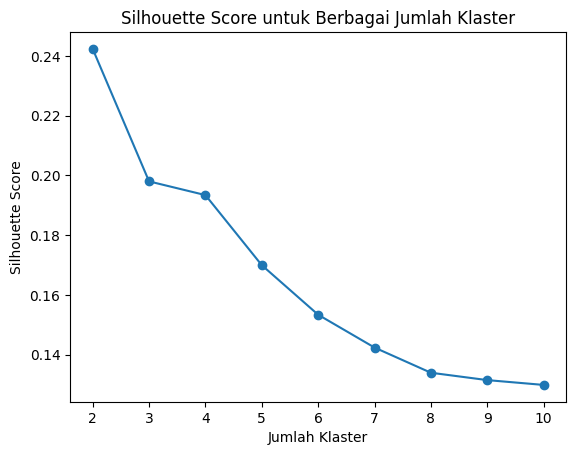

Jumlah klaster optimal berdasarkan Silhouette Score: 2
Silhouette Method untuk df_cat_b:
Silhouette Score untuk 2 klaster: 0.186019811008036
Silhouette Score untuk 3 klaster: 0.17662903961659224
Silhouette Score untuk 4 klaster: 0.18889469726102565
Silhouette Score untuk 5 klaster: 0.19254520269582048
Silhouette Score untuk 6 klaster: 0.19354710896705224
Silhouette Score untuk 7 klaster: 0.20167512267299398
Silhouette Score untuk 8 klaster: 0.21350138940934518
Silhouette Score untuk 9 klaster: 0.20502458075196686
Silhouette Score untuk 10 klaster: 0.20300788623707927


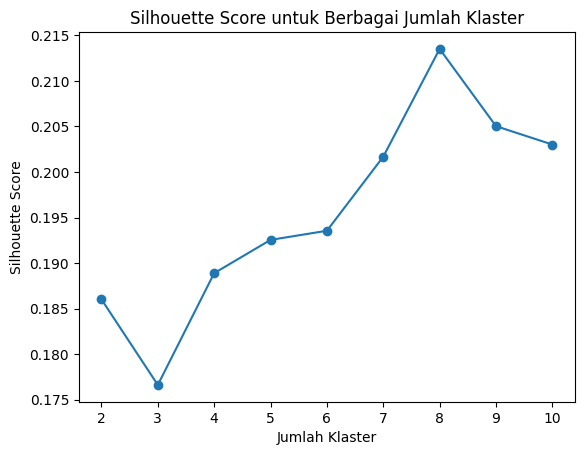

Jumlah klaster optimal berdasarkan Silhouette Score: 8


In [ ]:
# Fungsi untuk menjalankan Elbow Method menggunakan Silhouette Score
def perform_silhouette_elbow_method(df, max_k=10):
    silhouette_scores = []
    for k in range(2, max_k+1):
        kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=42)
        kmeans.fit(df)
        labels = kmeans.labels_
        score = silhouette_score(df, labels)
        silhouette_scores.append(score)
        print(f"Silhouette Score untuk {k} klaster: {score}")

    # Menampilkan grafik Silhouette Scores
    plt.plot(range(2, max_k+1), silhouette_scores, marker='o')
    plt.title("Silhouette Score untuk Berbagai Jumlah Klaster")
    plt.xlabel("Jumlah Klaster")
    plt.ylabel("Silhouette Score")
    plt.show()

    # Mengembalikan jumlah klaster optimal berdasarkan Silhouette Score tertinggi
    optimal_k = np.argmax(silhouette_scores) + 2
    print(f"Jumlah klaster optimal berdasarkan Silhouette Score: {optimal_k}")
    return optimal_k

# --- Silhouette Method untuk df_cat_a ---
print("Silhouette Method untuk df_cat_a:")
optimal_k_cat_a = perform_silhouette_elbow_method(df_cat_a)

# --- Silhouette Method untuk df_cat_b ---
print("Silhouette Method untuk df_cat_b:")
optimal_k_cat_b = perform_silhouette_elbow_method(df_cat_b)

DB-Index Method untuk df_cat_a:


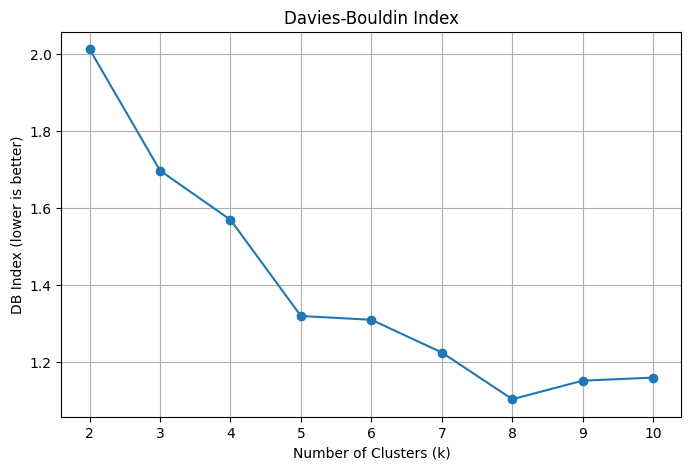

Jumlah klaster optimal berdasarkan Davies-Bouldin Index: 8
DB-Index Method untuk df_cat_b:


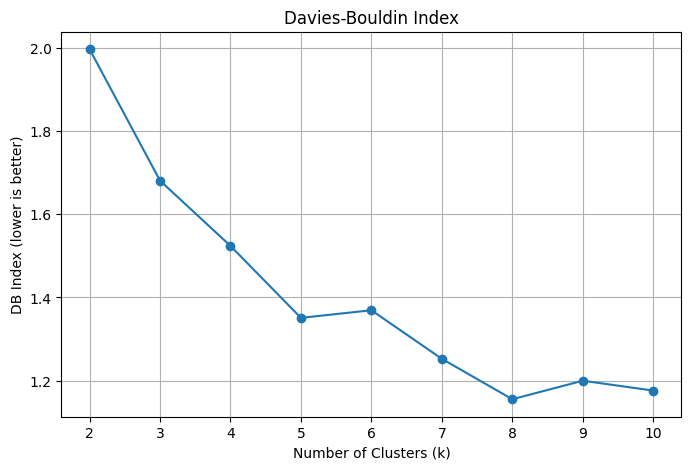

Jumlah klaster optimal berdasarkan Davies-Bouldin Index: 8


In [ ]:
from sklearn.metrics import davies_bouldin_score

def db_index_method(df, numerical_cols, max_k=10):
    # Pilih kolom numerik yang tersedia di dataframe
    available_numerical_columns = [col for col in numerical_cols if col in df.columns]
    X = df[available_numerical_columns]
    scores = []
    k_values = range(2, max_k + 1)

    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)
        score = davies_bouldin_score(X, labels)
        scores.append(score)

    plt.figure(figsize=(8, 5))
    plt.plot(k_values, scores, marker='o')
    plt.title('Davies-Bouldin Index')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('DB Index (lower is better)')
    plt.grid(True)
    plt.show()

    optimal_k = k_values[scores.index(min(scores))]
    print(f"Jumlah klaster optimal berdasarkan Davies-Bouldin Index: {optimal_k}")
    return optimal_k

# --- DB-Index Method untuk df_cat_a ---
print("DB-Index Method untuk df_cat_a:")
optimal_k_cat_a = db_index_method(df_cat_a, numerical_columns)

# --- DB-Index Method untuk df_cat_b ---
print("DB-Index Method untuk df_cat_b:")
optimal_k_cat_b = db_index_method(df_cat_b, numerical_columns)

CH Method untuk df_cat_a:


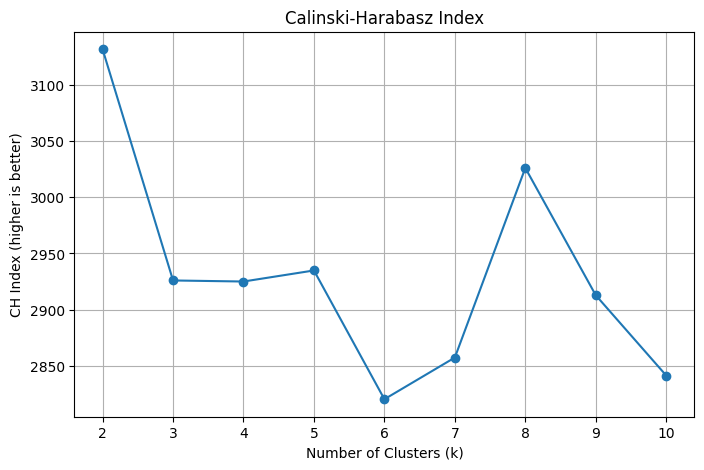

Jumlah klaster optimal berdasarkan Calinski-Harabasz Index: 2
CH Method untuk df_cat_b:


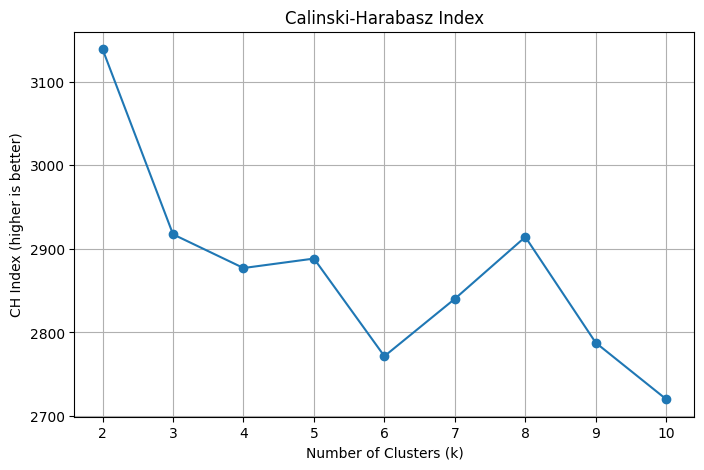

Jumlah klaster optimal berdasarkan Calinski-Harabasz Index: 2


In [ ]:
from sklearn.metrics import calinski_harabasz_score

def calinski_harabasz_method(df, numerical_cols, max_k=10):
    # Pilih kolom numerik yang tersedia di dataframe
    available_numerical_columns = [col for col in numerical_cols if col in df.columns]
    X = df[available_numerical_columns]
    scores = []
    k_values = range(2, max_k + 1)

    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)
        score = calinski_harabasz_score(X, labels)
        scores.append(score)

    plt.figure(figsize=(8, 5))
    plt.plot(k_values, scores, marker='o')
    plt.title('Calinski-Harabasz Index')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('CH Index (higher is better)')
    plt.grid(True)
    plt.show()

    optimal_k = k_values[scores.index(max(scores))]
    print(f"Jumlah klaster optimal berdasarkan Calinski-Harabasz Index: {optimal_k}")
    return optimal_k

# --- CH Method untuk df_cat_a ---
print("CH Method untuk df_cat_a:")
optimal_k_cat_a = calinski_harabasz_method(df_cat_a, numerical_columns)

# --- CH Method untuk df_cat_b ---
print("CH Method untuk df_cat_b:")
optimal_k_cat_b = calinski_harabasz_method(df_cat_b, numerical_columns)

Elbow Method untuk df_cat_a:


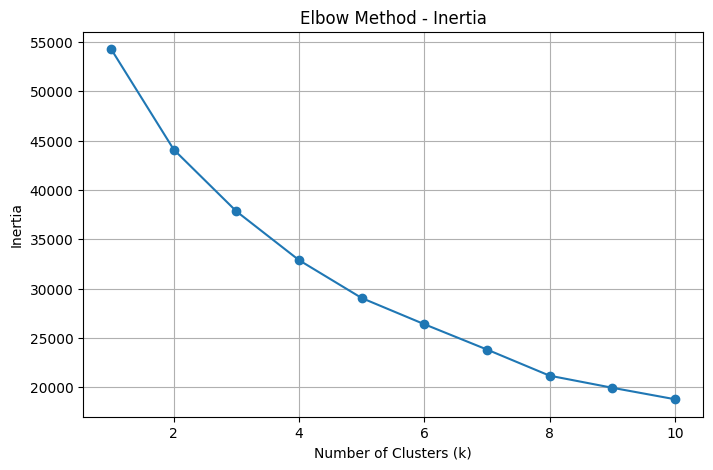

Elbow Method untuk df_cat_b:


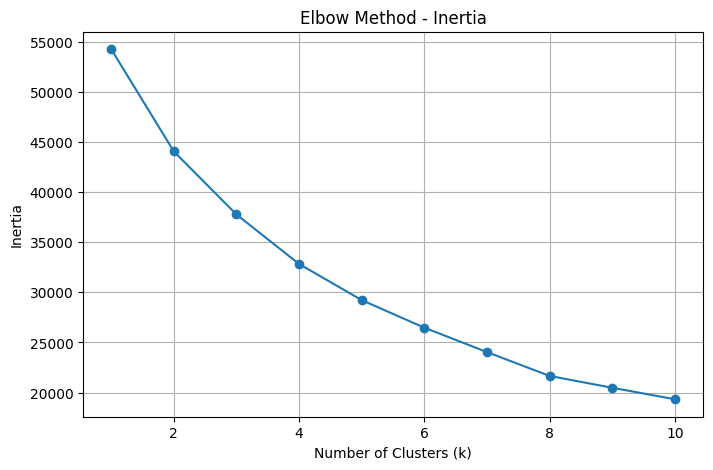

In [ ]:
def elbow_method_inertia(df, numerical_cols, max_k=10):
    # Pilih kolom numerik yang tersedia di dataframe
    available_numerical_columns = [col for col in numerical_cols if col in df.columns]
    X = df[available_numerical_columns]
    inertias = []
    k_values = range(1, max_k + 1)

    for k in k_values:
        # kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=42)
        kmeans.fit(X)
        inertias.append(kmeans.inertia_)

    plt.figure(figsize=(8, 5))
    plt.plot(k_values, inertias, marker='o')
    plt.title('Elbow Method - Inertia')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia')
    plt.grid(True)
    plt.show()

# implementasi di df_cat_a
print("Elbow Method untuk df_cat_a:")
elbow_method_inertia(df_cat_a, numerical_columns)

# implementadi di df_cat_b
print("Elbow Method untuk df_cat_b:")
elbow_method_inertia(df_cat_b, numerical_columns)

## Langkah 4: Clustering

### K-Prototype

In [ ]:
# Fungsi untuk menjalankan K-Prototypes dan visualisasi PCA
def perform_kprototypes_and_pca(df, numerical_columns, categorical_columns, k_optimal):
    # Pisahkan kolom numerik dan kategorikal
    numeric_data = df[[col for col in numerical_columns if col in df.columns]]
    categorical_data = df[[col for col in categorical_columns if col in df.columns]]
    categorical_data = categorical_data.astype('category')

    # Gabungkan data numerik dan kategorikal
    combined_data = pd.concat([numeric_data, categorical_data], axis=1)

    # One-Hot Encoding untuk variabel kategorik jika ada categorical_data
    if not categorical_data.empty:
        X_categoric_encoded = pd.get_dummies(categorical_data, drop_first=True)
        data_encoded = pd.concat([numeric_data, X_categoric_encoded], axis=1)
    else:
        data_encoded = numeric_data

    # Konversi data kategorikal ke string untuk K-Prototypes
    for col in categorical_columns:
        if col in df.columns:
            combined_data[col] = combined_data[col].astype(str)

    # Jalankan K-Prototypes
    kproto = KPrototypes(n_clusters=k_optimal, init='Huang', random_state=42)
    clusters_kproto = kproto.fit_predict(combined_data, categorical=[df.columns.get_loc(col) for col in categorical_columns if col in df.columns])

    # Visualisasi hasil klaster menggunakan PCA (numerik saja)
    pca_2d = PCA(n_components=2)
    pca_result = pca_2d.fit_transform(data_encoded)

    # Buat DataFrame untuk visualisasi
    pca_df = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2'])
    pca_df['Cluster_KProto'] = clusters_kproto

    # Tambahkan hasil klaster ke DataFrame
    df['Cluster_KProto'] = clusters_kproto

    # Plot hasil PCA
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster_KProto', data=pca_df, palette='Set2', s=50)
    plt.title(f'PCA - K-Prototypes Clusters (k={k_optimal})')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend(title='Cluster_KProto', loc='best')
    plt.show()

K-Prototypes untuk df_cat_a:


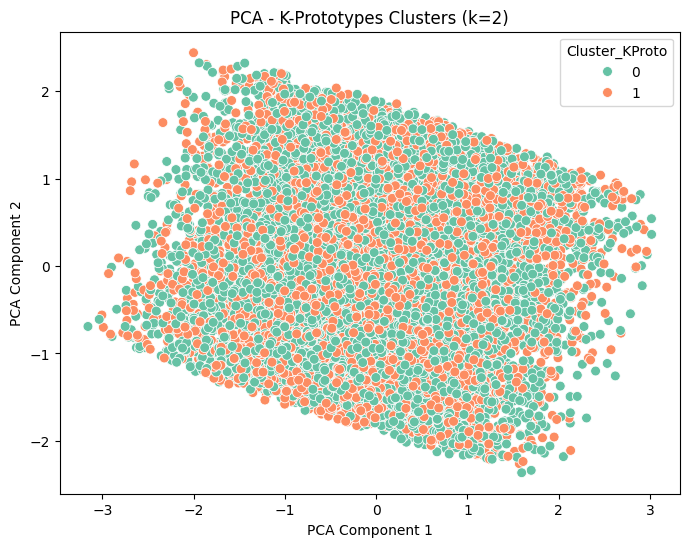

In [ ]:
# --- Jalankan untuk df_cat_a ---
print("K-Prototypes untuk df_cat_a:")
perform_kprototypes_and_pca(df_cat_a, numerical_columns, categorical_columns, optimal_k_cat_a)

In [ ]:
# # --- Jalankan untuk df_cat_b ---
# print("K-Prototypes untuk df_cat_b:")
# perform_kprototypes_and_pca(df_cat_b, numerical_columns, categorical_columns, optimal_k_cat_b)

# gausah karena gaada kategorik

### AD K-Means

K-Means untuk df_cat_a:


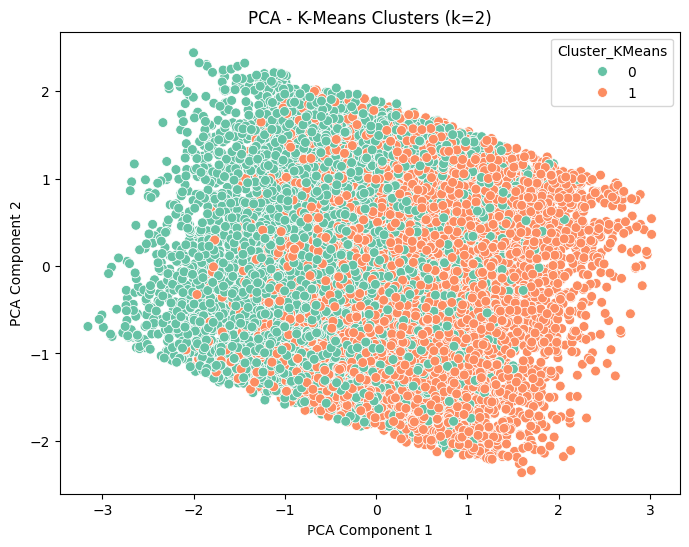

K-Means untuk df_cat_b:


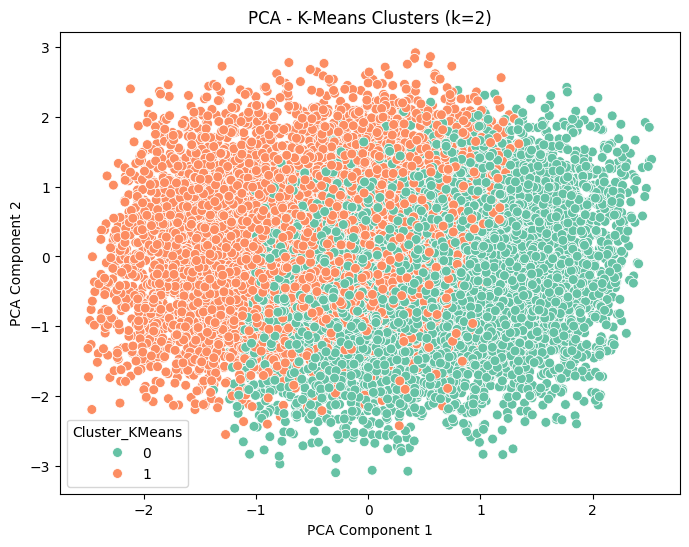

In [ ]:
# Fungsi untuk memilih kolom numerik yang tersedia dalam dataframe
def get_numeric_data(df, numerical_columns):
    return df[[col for col in numerical_columns if col in df.columns]]
#fungsi untuk memilih kolom kategorik yang tersedia dalam dataframe
def get_categorical_data(df, categorical_columns):
    return df[[col for col in categorical_columns if col in df.columns]]

# Fungsi untuk menjalankan K-Means dan visualisasi PCA
def perform_ad_kmeans_and_pca(df, k_optimal):
    # Pilih data numerik berdasarkan kolom yang ada
    X_numeric = get_numeric_data(df, numerical_columns)
    X_categoric = get_categorical_data(df, categorical_columns)
    X_categoric = X_categoric.astype('category')

    # One-Hot Encoding untuk variabel kategorik jika ada X_categoric
    if not X_categoric.empty:
        X_categoric_encoded = pd.get_dummies(X_categoric, drop_first=True)
        data_encoded = pd.concat([X_numeric, X_categoric_encoded], axis=1)
    else:
        data_encoded = X_numeric

    # Jalankan K-Means
    kmeans = KMeans(n_clusters=k_optimal, init='k-means++', n_init=10, random_state=42)
    clusters_kmeans = kmeans.fit_predict(data_encoded)

    # PCA untuk visualisasi
    pca_2d = PCA(n_components=2)
    pca_result = pca_2d.fit_transform(data_encoded)

    # Buat DataFrame untuk visualisasi
    pca_df = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2'])
    pca_df['Cluster_KMeans'] = clusters_kmeans

    # Tambahkan hasil klaster ke DataFrame
    df['Cluster_KMeans'] = clusters_kmeans

    # Plot hasil PCA
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster_KMeans', data=pca_df, palette='Set2', s=50)
    plt.title(f'PCA - K-Means Clusters (k={k_optimal})')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend(title='Cluster_KMeans', loc='best')
    plt.show()

# --- Jalankan untuk df_cat_a ---
print("K-Means untuk df_cat_a:")
perform_ad_kmeans_and_pca(df_cat_a, optimal_k_cat_a)

# --- Jalankan untuk df_cat_b ---
print("K-Means untuk df_cat_b:")
perform_ad_kmeans_and_pca(df_cat_b, optimal_k_cat_b)

### K-Medoids using Gower's Distance

K-Medoids untuk df_cat_a:


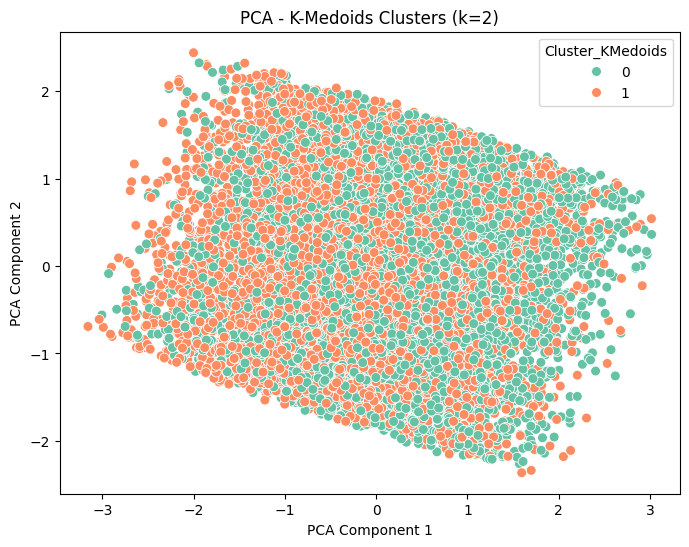

K-Medoids untuk df_cat_b:


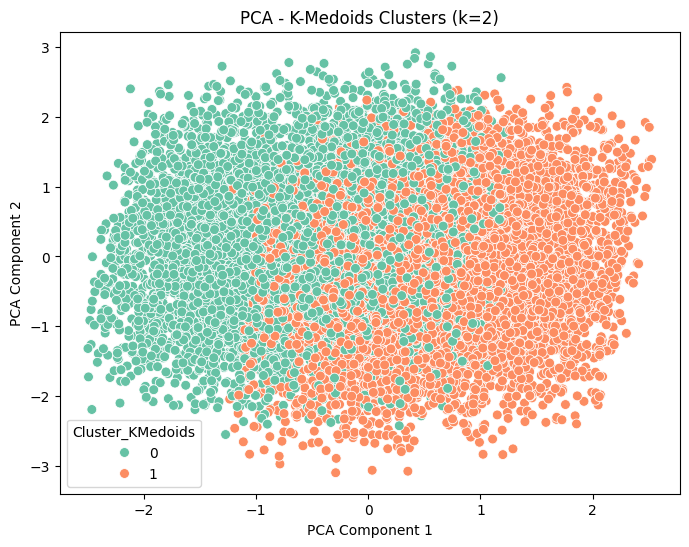

In [ ]:
# Fungsi untuk menjalankan K-Medoids dan visualisasi PCA
def perform_kmedoids_and_pca(df, categorical_columns, k_optimal):
    categorical_data = df[[col for col in categorical_columns if col in df.columns]]
    numeric_data = df[[col for col in numerical_columns if col in df.columns]]
    categorical_data = categorical_data.astype(str)

    # Gabungkan data numerik dan kategorikal
    combined_data = pd.concat([numeric_data, categorical_data], axis=1)

    # Hitung matriks Gower Distance
    gower_dist = gower.gower_matrix(combined_data)

    # Jalankan K-Medoids
    kmedoids = KMedoids(n_clusters=k_optimal, metric="precomputed", random_state=42)
    kmedoids.fit(gower_dist)
    clusters_kmedoids = kmedoids.labels_

    # One-Hot Encoding untuk variabel kategorik jika ada categorical_data
    if not categorical_data.empty:
        X_categoric_encoded = pd.get_dummies(categorical_data, drop_first=True)
        data_encoded = pd.concat([numeric_data, X_categoric_encoded], axis=1)
    else:
        data_encoded = numeric_data

    # PCA untuk visualisasi
    pca_2d = PCA(n_components=2)
    pca_result = pca_2d.fit_transform(data_encoded)

    # Buat DataFrame untuk visualisasi
    pca_df = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2'])
    pca_df['Cluster_KMedoids'] = clusters_kmedoids

    # Tambahkan hasil klaster ke DataFrame
    df['Cluster_KMedoids'] = clusters_kmedoids

    # Plot hasil PCA
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster_KMedoids', data=pca_df, palette='Set2', s=50)
    plt.title(f'PCA - K-Medoids Clusters (k={k_optimal})')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend(title='Cluster_KMedoids', loc='best')
    plt.show()

# --- Jalankan untuk df_cat_a ---
print("K-Medoids untuk df_cat_a:")
perform_kmedoids_and_pca(df_cat_a, categorical_columns, optimal_k_cat_a)

# --- Jalankan untuk df_cat_b ---
print("K-Medoids untuk df_cat_b:")
perform_kmedoids_and_pca(df_cat_b, categorical_columns, optimal_k_cat_b)

In [ ]:
def get_gower_matrix(df, categorical_columns, numerical_columns):
    categorical_data = df[[col for col in categorical_columns if col in df.columns]]
    numeric_data = df[[col for col in numerical_columns if col in df.columns]]
    if not categorical_data.empty:
        categorical_data = categorical_data.astype(str)
        combined_data = pd.concat([numeric_data, categorical_data], axis=1)
    else:
        combined_data = numeric_data
    gower_dist = gower.gower_matrix(combined_data)
    return gower_dist

gower_cat_a = get_gower_matrix(df_cat_a, categorical_columns, numerical_columns)
gower_cat_b = get_gower_matrix(df_cat_b, categorical_columns, numerical_columns)

### Agglomerative Using Gower's Distance

Agglomerative Clustering untuk df_cat_a:


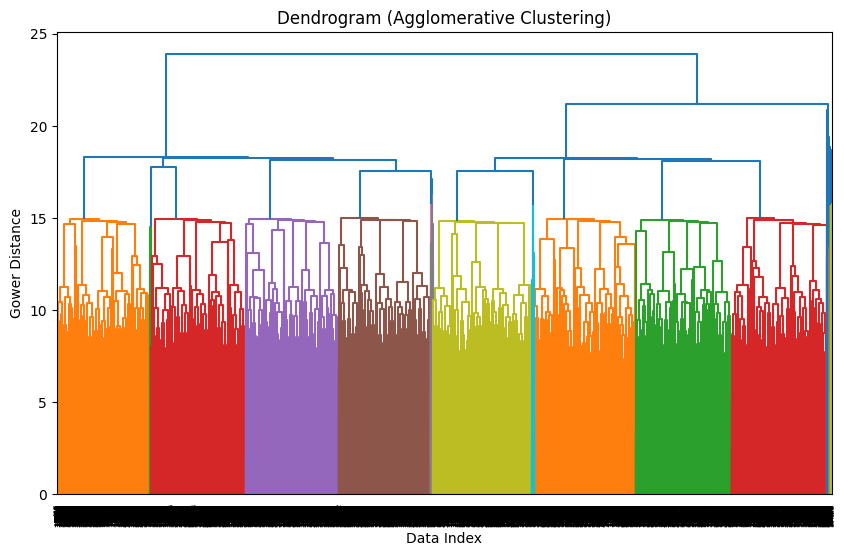

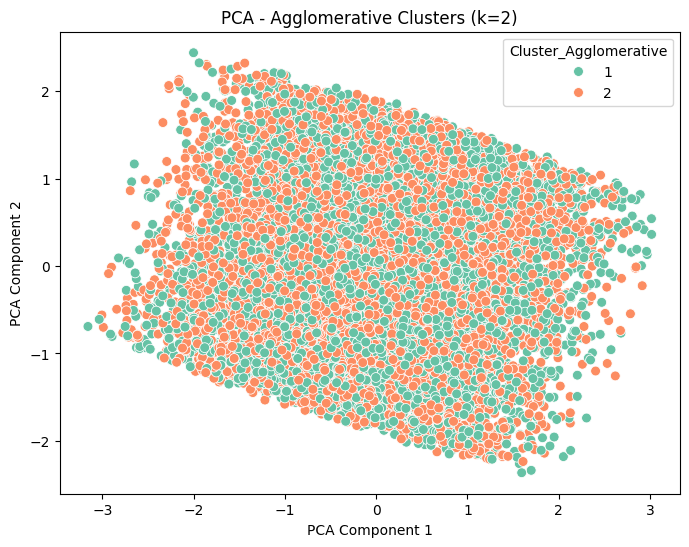

Agglomerative Clustering untuk df_cat_b:


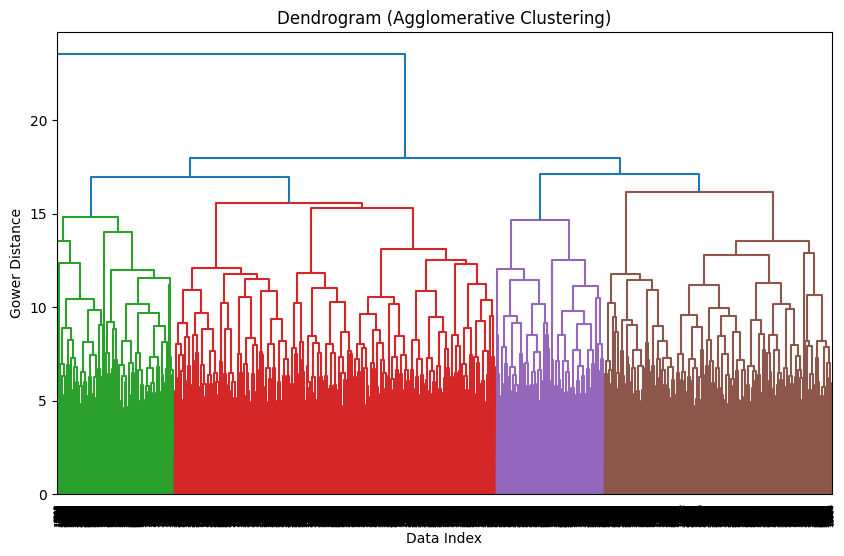

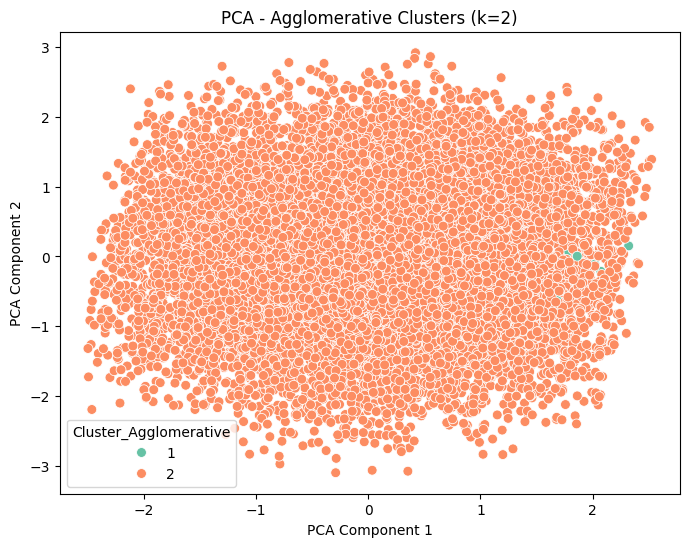

In [ ]:
# Fungsi untuk menjalankan Agglomerative Clustering dan visualisasi PCA
def perform_agglomerative_and_pca(df, k_optimal, gower_dist):
    categorical_data = df[[col for col in categorical_columns if col in df.columns]]
    numeric_data = df[[col for col in numerical_columns if col in df.columns]]

    # Step 2: Agglomerative Clustering menggunakan linkage
    # 'average' digunakan untuk rata-rata jarak antar cluster
    linkage_matrix = linkage(gower_dist, method='average')

    # Step 3: Visualisasi dendrogram
    plt.figure(figsize=(10, 6))
    dendrogram(linkage_matrix, labels=df.index, leaf_rotation=90)
    plt.title('Dendrogram (Agglomerative Clustering)')
    plt.xlabel('Data Index')
    plt.ylabel('Gower Distance')
    plt.show()

    # Step 4: Tentukan klaster
    clusters = fcluster(linkage_matrix, t=k_optimal, criterion='maxclust')
    clusters_agg = clusters

    # One-Hot Encoding untuk variabel kategorik jika ada categorical_data
    if not categorical_data.empty:
        categorical_data = categorical_data.astype(str)
        X_categoric_encoded = pd.get_dummies(categorical_data, drop_first=True)
        data_encoded = pd.concat([numeric_data, X_categoric_encoded], axis=1)
    else:
        data_encoded = numeric_data

    # PCA untuk visualisasi
    pca_2d = PCA(n_components=2)
    pca_result = pca_2d.fit_transform(data_encoded)

    # Buat DataFrame untuk visualisasi
    pca_df = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2'])
    pca_df['Cluster_Agglomerative'] = clusters_agg

    # Tambahkan hasil klaster ke DataFrame
    df['Cluster_Agglomerative'] = clusters_agg

    # Plot hasil PCA
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster_Agglomerative', data=pca_df, palette='Set2', s=50)
    plt.title(f'PCA - Agglomerative Clusters (k={k_optimal})')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend(title='Cluster_Agglomerative', loc='best')
    plt.show()

# --- Jalankan untuk df_cat_a ---
print("Agglomerative Clustering untuk df_cat_a:")
perform_agglomerative_and_pca(df_cat_a, optimal_k_cat_a, gower_cat_a)

# --- Jalankan untuk df_cat_b ---
print("Agglomerative Clustering untuk df_cat_b:")
perform_agglomerative_and_pca(df_cat_b, optimal_k_cat_b, gower_cat_b)

In [ ]:
# Fungsi untuk menambahkan kolom nama_usaha dan menyimpan dataframe ke CSV
def save_to_csv_with_nama_usaha(df, columns, df_source, path, file_name):
    # Menambahkan kolom nama_usaha ke dataframe
    df['nama_usaha'] = df_source['nama_usaha']  # Pastikan df_source memiliki kolom 'nama_usaha'

    # Reorder kolom dataframe sesuai dengan yang diinginkan
    columns_to_csv = ['nama_usaha'] + columns
    df = df[columns_to_csv]

    # Menyimpan dataframe ke file CSV
    df.to_csv(path + file_name, index=False)

# --- Untuk df_umum ---
save_to_csv_with_nama_usaha(df_umum, df_umum.columns.tolist(), df, PATH, 'df_umum_clustered.csv')

# --- Untuk df_cat_a ---
save_to_csv_with_nama_usaha(df_cat_a, df_cat_a.columns.tolist(), df, PATH, 'df_cat_a_clustered.csv')

# --- Untuk df_cat_b ---
save_to_csv_with_nama_usaha(df_cat_b, df_cat_b.columns.tolist(), df, PATH, 'df_cat_b_clustered.csv')

In [ ]:
# ubah gower ke dataframe
df_gower_cat_a = pd.DataFrame(gower_cat_a, index=df_cat_a.index, columns=df_cat_a.index)
df_gower_cat_b = pd.DataFrame(gower_cat_b, index=df_cat_b.index, columns=df_cat_b.index)
# simpan gower ke csv
df_gower_cat_a.to_csv(PATH + 'gower_cat_a_clustered.csv', index=False)
df_gower_cat_b.to_csv(PATH + 'gower_cat_b_clustered.csv', index=False)

In [ ]:
gower_cat_a

array([[0.        , 0.45977852, 0.5014209 , ..., 0.46620876, 0.40387604,
        0.65188986],
       [0.45977852, 0.        , 0.633273  , ..., 0.43933502, 0.5172577 ,
        0.48128885],
       [0.5014209 , 0.633273  , 0.        , ..., 0.5974998 , 0.33427328,
        0.5090548 ],
       ...,
       [0.46620876, 0.43933502, 0.5974998 , ..., 0.        , 0.5940386 ,
        0.44551563],
       [0.40387604, 0.5172577 , 0.33427328, ..., 0.5940386 , 0.        ,
        0.39664707],
       [0.65188986, 0.48128885, 0.5090548 , ..., 0.44551563, 0.39664707,
        0.        ]], dtype=float32)

In [ ]:
# cek tipe gower dan df_gower
print(type(gower_cat_a))
print(type(df_gower_cat_a))

<class 'numpy.ndarray'>
<class 'pandas.core.frame.DataFrame'>


## Langkah 5: Evaluasi Model Klaster

In [ ]:
# Membaca file CSV untuk df_umum, df_cat_a, dan df_cat_b
df_clustered = pd.read_csv(PATH + 'df_umum_clustered.csv')
df_umum = pd.read_csv(PATH + 'df_umum_clustered.csv').drop(columns=['nama_usaha'])
df_cat_a = pd.read_csv(PATH + 'df_cat_a_clustered.csv').drop(columns=['nama_usaha'])
df_cat_b = pd.read_csv(PATH + 'df_cat_b_clustered.csv').drop(columns=['nama_usaha'])
# panggil gower matriks dari csv
gower_cat_a_loaded = pd.read_csv(PATH + 'gower_cat_a_clustered.csv', dtype=np.float32).to_numpy()
gower_cat_b_loaded = pd.read_csv(PATH + 'gower_cat_b_clustered.csv', dtype=np.float32).to_numpy()

# Menampilkan dataframe setelah menghapus kolom 'nama_usaha'
print("Dataframe Umum:")
print(df_umum.head())

print("Dataframe cat_a:")
print(df_cat_a.head())

print("Dataframe cat_b:")
print(df_cat_b.head())

Dataframe Umum:
         laba  jenis_usaha  tenaga_kerja_perempuan  tenaga_kerja_laki_laki  \
0  -2149355.0          2.0               -1.684184                0.237175   
1  32571277.0          5.0               -1.545874               -0.177616   
2  16371593.0          2.4                0.839978                0.064346   
3  11124211.0          1.0                1.358641               -1.525687   
4  -4636043.0          1.0                1.427796                0.340873   

   tahun_berdiri  status_legalitas  marketplace  kapasitas_produksi      aset  \
0       0.411112               0.0          3.0           -0.073147  0.100419   
1       0.272922               1.0          0.0           -0.125908  0.796430   
2      -1.661738               0.0          4.0           -0.410817  1.339470   
3      -1.247168               0.0          4.0            1.710176  1.593684   
4      -1.385358               0.0          1.0           -0.653518  1.550002   

      omset  biaya_karyawan 

In [ ]:
# gower_cat_a, gower_cat_b adalah data sebelum disimpan
# gower_cat_a_loaded, gower_cat_b_loaded adalah data yang dipanggil kembali

# Membandingkan data cat_a
is_cat_a_equal = np.array_equal(gower_cat_a, gower_cat_a_loaded)
print(f"Data cat_a sama: {is_cat_a_equal}")

# Membandingkan data cat_b
is_cat_b_equal = np.array_equal(gower_cat_b, gower_cat_b_loaded)
print(f"Data cat_b sama: {is_cat_b_equal}")

Data cat_a sama: True
Data cat_b sama: True


In [ ]:
gower_cat_a = gower_cat_a_loaded
gower_cat_b = gower_cat_b_loaded

In [ ]:
# Fungsi untuk memilih kolom numerik yang tersedia dalam dataframe
def get_numeric_data(df, numerical_columns):
    return df[[col for col in numerical_columns if col in df.columns]]
#fungsi untuk memilih kolom kategorik yang tersedia dalam dataframe
def get_categorical_data(df, categorical_columns):
    return df[[col for col in categorical_columns if col in df.columns]]

# Fungsi untuk menghitung metrik evaluasi clustering
def evaluate_clustering(cluster_labels, df, numerical_columns, categorical_columns, gower_dist):
    # Pilih data numerik berdasarkan kolom yang ada
    X_numeric = get_numeric_data(df, numerical_columns)
    X_categoric = get_categorical_data(df, categorical_columns)
    X_categoric = X_categoric.astype(str)

    # One-Hot Encoding untuk variabel kategorik jika ada categorical_data
    if not X_categoric.empty:
        X_categoric_encoded = pd.get_dummies(X_categoric, drop_first=True)
        data_encoded = pd.concat([X_numeric, X_categoric_encoded], axis=1)
    else:
        data_encoded = X_numeric

    # Metrik Evaluasi
    # Silhouette Score
    sil_score = silhouette_score(gower_dist, cluster_labels, metric="precomputed")
    print(f"Silhouette Score: {sil_score}")

    # Davies-Bouldin Index
    dbi_score = davies_bouldin_score(data_encoded, cluster_labels)
    print(f"Davies-Bouldin Index: {dbi_score}")

    # Calinski-Harabasz Index
    ch_score = calinski_harabasz_score(data_encoded, cluster_labels)
    print(f"Calinski-Harabasz Index: {ch_score}")

    return sil_score, dbi_score, ch_score

# Evaluasi untuk K-Prototypes pada cat_a
silhouette_kproto_cat_a, davies_bouldin_kproto_cat_a, calinski_kproto_cat_a = evaluate_clustering(df_cat_a['Cluster_KProto'], df_cat_a, numerical_columns, categorical_columns, gower_cat_a)
# Evaluasi untuk K-Prototypes pada cat_b
# silhouette_kproto_cat_b, davies_bouldin_kproto_cat_b, calinski_kproto_cat_b = evaluate_clustering(df_cat_b['Cluster_KProto'], df_cat_b, numerical_columns, categorical_columns, gower_cat_b)

# Evaluasi untuk K-Means pada cat_a
silhouette_kmeans_cat_a, davies_bouldin_kmeans_cat_a, calinski_kmeans_cat_a = evaluate_clustering(df_cat_a['Cluster_KMeans'], df_cat_a, numerical_columns, categorical_columns, gower_cat_a)
# Evaluasi untuk K-Means pada cat_b
silhouette_kmeans_cat_b, davies_bouldin_kmeans_cat_b, calinski_kmeans_cat_b = evaluate_clustering(df_cat_b['Cluster_KMeans'], df_cat_b, numerical_columns, categorical_columns, gower_cat_b)

# Evaluasi untuk K-Medoids pada cat_a
silhouette_kmedoids_cat_a, davies_bouldin_kmedoids_cat_a, calinski_kmedoids_cat_a = evaluate_clustering(df_cat_a['Cluster_KMedoids'], df_cat_a, numerical_columns, categorical_columns, gower_cat_a)
# Evaluasi untuk K-Medoids pada cat_b
silhouette_kmedoids_cat_b, davies_bouldin_kmedoids_cat_b, calinski_kmedoids_cat_b = evaluate_clustering(df_cat_b['Cluster_KMedoids'], df_cat_b, numerical_columns, categorical_columns, gower_cat_b)

# Evaluasi untuk Agglomerative Clustering pada cat_a
silhouette_agg_cat_a, davies_bouldin_agg_cat_a, calinski_agg_cat_a = evaluate_clustering(df_cat_a['Cluster_Agglomerative'], df_cat_a, numerical_columns, categorical_columns, gower_cat_a)
# Evaluasi untuk Agglomerative Clustering pada cat_b
silhouette_agg_cat_b, davies_bouldin_agg_cat_b, calinski_agg_cat_b = evaluate_clustering(df_cat_b['Cluster_Agglomerative'], df_cat_b, numerical_columns, categorical_columns, gower_cat_b)

# Menyusun hasil evaluasi dalam dataframe untuk masing-masing dataset
evaluation_results_cat_a = pd.DataFrame({
    'Model': ['K-Prototypes', 'K-Means', 'K-Medoids', 'Agglomerative'],
    'Silhouette Score': [silhouette_kproto_cat_a, silhouette_kmeans_cat_a, silhouette_kmedoids_cat_a, silhouette_agg_cat_a],
    'Davies-Bouldin Index': [davies_bouldin_kproto_cat_a, davies_bouldin_kmeans_cat_a, davies_bouldin_kmedoids_cat_a, davies_bouldin_agg_cat_a],
    'Calinski-Harabasz Index': [calinski_kproto_cat_a, calinski_kmeans_cat_a, calinski_kmedoids_cat_a, calinski_agg_cat_a]
})
evaluation_results_cat_b = pd.DataFrame({
    'Model': [
        # 'K-Prototypes',
        'K-Means', 'K-Medoids', 'Agglomerative'],
    'Silhouette Score': [
        # silhouette_kproto_cat_b,
        silhouette_kmeans_cat_b, silhouette_kmedoids_cat_b, silhouette_agg_cat_b],
    'Davies-Bouldin Index': [
        # davies_bouldin_kproto_cat_b,
        davies_bouldin_kmeans_cat_b, davies_bouldin_kmedoids_cat_b, davies_bouldin_agg_cat_b],
    'Calinski-Harabasz Index': [
        # calinski_kproto_cat_b,
        calinski_kmeans_cat_b, calinski_kmedoids_cat_b, calinski_agg_cat_b]
})

# Tampilkan hasil evaluasi untuk cat_a dan cat_b
print("\nEvaluasi untuk dataset cat_a:")
print(evaluation_results_cat_a)
print("\nEvaluasi untuk dataset cat_b:")
print(evaluation_results_cat_b)

Silhouette Score: 0.10864745825529099
Davies-Bouldin Index: 5.499410745427352
Calinski-Harabasz Index: 419.63846083912154
Silhouette Score: 0.09549690783023834
Davies-Bouldin Index: 2.521912391032553
Calinski-Harabasz Index: 2075.1036362860063
Silhouette Score: 0.23114065825939178
Davies-Bouldin Index: 1.9961408770152618
Calinski-Harabasz Index: 3139.113478001718
Silhouette Score: 0.08400869369506836
Davies-Bouldin Index: 4.846621176551147
Calinski-Harabasz Index: 560.3202607596724
Silhouette Score: 0.2277529537677765
Davies-Bouldin Index: 2.005580058957422
Calinski-Harabasz Index: 3110.089336262328
Silhouette Score: 0.2512519955635071
Davies-Bouldin Index: 4.632815273076416
Calinski-Harabasz Index: 613.0419646183351
Silhouette Score: 0.2196691930294037
Davies-Bouldin Index: 0.7677377085868143
Calinski-Harabasz Index: 15.263594162042235

Evaluasi untuk dataset cat_a:
           Model  Silhouette Score  Davies-Bouldin Index  \
0   K-Prototypes          0.108647              5.499411   


### Model Klaster Terbaik

In [ ]:
# Fungsi untuk menilai dan memilih model terbaik
def evaluate_and_select_best_model(evaluation_results):
    # Normalisasi dan memberikan peringkat untuk masing-masing metrik
    # Silhouette Score: Nilai tertinggi lebih baik
    evaluation_results['Silhouette Rank'] = evaluation_results['Silhouette Score'].rank(ascending=False)

    # Davies-Bouldin Index: Nilai terendah lebih baik (inverse rank)
    evaluation_results['Davies-Bouldin Rank'] = evaluation_results['Davies-Bouldin Index'].rank(ascending=True)

    # Calinski-Harabasz Index: Nilai tertinggi lebih baik
    evaluation_results['Calinski Rank'] = evaluation_results['Calinski-Harabasz Index'].rank(ascending=False)

    # Total rank untuk memilih model terbaik berdasarkan gabungan ranking metrik
    evaluation_results['Total Rank'] = evaluation_results[['Silhouette Rank', 'Davies-Bouldin Rank', 'Calinski Rank']].sum(axis=1)

    # Model terbaik adalah yang memiliki Total Rank terendah
    best_model = evaluation_results.loc[evaluation_results['Total Rank'].idxmin()]

    return best_model

# Menyusun hasil evaluasi untuk dataset cat_a
evaluation_results_cat_a = pd.DataFrame({
    'Model': ['K-Prototypes', 'K-Means', 'K-Medoids', 'Agglomerative'],
    'Silhouette Score': [silhouette_kproto_cat_a, silhouette_kmeans_cat_a, silhouette_kmedoids_cat_a, silhouette_agg_cat_a],
    'Davies-Bouldin Index': [davies_bouldin_kproto_cat_a, davies_bouldin_kmeans_cat_a, davies_bouldin_kmedoids_cat_a, davies_bouldin_agg_cat_a],
    'Calinski-Harabasz Index': [calinski_kproto_cat_a, calinski_kmeans_cat_a, calinski_kmedoids_cat_a, calinski_agg_cat_a]
})

# Menyusun hasil evaluasi untuk dataset cat_b
evaluation_results_cat_b = pd.DataFrame({
    'Model': [
        # 'K-Prototypes',
        'K-Means', 'K-Medoids', 'Agglomerative'],
    'Silhouette Score': [
        # silhouette_kproto_cat_b,
        silhouette_kmeans_cat_b, silhouette_kmedoids_cat_b, silhouette_agg_cat_b],
    'Davies-Bouldin Index': [
        # davies_bouldin_kproto_cat_b,
        davies_bouldin_kmeans_cat_b, davies_bouldin_kmedoids_cat_b, davies_bouldin_agg_cat_b],
    'Calinski-Harabasz Index': [
        # calinski_kproto_cat_b,
        calinski_kmeans_cat_b, calinski_kmedoids_cat_b, calinski_agg_cat_b]
})

# Memilih model terbaik untuk dataset cat_a
best_model_cat_a = evaluate_and_select_best_model(evaluation_results_cat_a)

# Memilih model terbaik untuk dataset cat_b
best_model_cat_b = evaluate_and_select_best_model(evaluation_results_cat_b)

# Tampilkan model terbaik untuk setiap dataset
print("\nBest Model for Dataset cat_a:")
print(best_model_cat_a[['Model', 'Silhouette Rank', 'Davies-Bouldin Rank', 'Calinski Rank', 'Total Rank']])

print("\nBest Model for Dataset cat_b:")
print(best_model_cat_b[['Model', 'Silhouette Rank', 'Davies-Bouldin Rank', 'Calinski Rank', 'Total Rank']])


Best Model for Dataset cat_a:
Model                  K-Means
Silhouette Rank            3.0
Davies-Bouldin Rank        1.0
Calinski Rank              1.0
Total Rank                 5.0
Name: 1, dtype: object

Best Model for Dataset cat_b:
Model                  K-Means
Silhouette Rank            1.0
Davies-Bouldin Rank        2.0
Calinski Rank              1.0
Total Rank                 4.0
Name: 0, dtype: object


In [ ]:
# Fungsi untuk menghapus kolom hasil klaster yang bukan model terbaik
def remove_non_best_clusters(df, best_model_name, df_name):
    # Mengubah nama model untuk mencocokkan nama kolom yang ada
    model_name_map = {
        'K-Prototypes': 'KProto',
        'K-Means': 'KMeans',
        'K-Medoids': 'KMedoids',
        'Agglomerative': 'Agglomerative'
    }

    # Menyesuaikan nama model dengan format kolom
    best_model_column_name = f'Cluster_{model_name_map[best_model_name]}'

    # Daftar semua kolom klaster
    cluster_columns = ['Cluster_KProto', 'Cluster_KMeans', 'Cluster_KMedoids', 'Cluster_Agglomerative']

    # Hapus kolom klaster yang tidak sesuai dengan model terbaik
    for col in cluster_columns:
        if col != best_model_column_name:
          # jika col exist
          if col in df.columns:
            print(f"Removing column: {col}")
            df = df.drop(columns=[col])

    # Ganti nama kolom klaster terbaik
    df = df.rename(columns={best_model_column_name: f'Cluster_{model_name_map[best_model_name]}_{df_name}'})

    return df

# Mendapatkan nama model terbaik berdasarkan hasil evaluasi
best_model_cat_a_name = best_model_cat_a['Model']
best_model_cat_b_name = best_model_cat_b['Model']

# Menghapus kolom klaster yang bukan model terbaik untuk dataset cat_a
df_cat_a_best_model = remove_non_best_clusters(df_cat_a.copy(), best_model_cat_a_name, 'cat_a')

# Menghapus kolom klaster yang bukan model terbaik untuk dataset cat_b
df_cat_b_best_model = remove_non_best_clusters(df_cat_b.copy(), best_model_cat_b_name, 'cat_b')

# Menampilkan hasilnya untuk memastikan hanya kolom klaster terbaik yang tersisa
print("\nColumns in Dataset cat_a (Best Model):", df_cat_a_best_model.columns)
print("\nColumns in Dataset cat_b (Best Model):", df_cat_b_best_model.columns)

Removing column: Cluster_KProto
Removing column: Cluster_KMedoids
Removing column: Cluster_Agglomerative
Removing column: Cluster_KMedoids
Removing column: Cluster_Agglomerative

Columns in Dataset cat_a (Best Model): Index(['jenis_usaha', 'tenaga_kerja_perempuan', 'tenaga_kerja_laki_laki',
       'tahun_berdiri', 'status_legalitas', 'marketplace',
       'kapasitas_produksi', 'Cluster_KMeans_cat_a'],
      dtype='object')

Columns in Dataset cat_b (Best Model): Index(['aset', 'omset', 'biaya_karyawan', 'jumlah_pelanggan',
       'Cluster_KMeans_cat_b'],
      dtype='object')


In [ ]:
# Menambahkan kembali kolom nama_usaha yang telah dihapus pada masing-masing dataset
df_cat_a_best_model['nama_usaha'] = df_clustered['nama_usaha']
df_cat_b_best_model['nama_usaha'] = df_clustered['nama_usaha']

# Gabungkan hasil klaster cat_a dan cat_b ke df_umum_best_model berdasarkan 'SensorLocation'
df_gabung = df_clustered.copy()
df_gabung = pd.merge(df_gabung, df_cat_a_best_model[['nama_usaha', 'Cluster_KMeans_cat_a']], on='nama_usaha', how='left')
df_gabung = pd.merge(df_gabung, df_cat_b_best_model[['nama_usaha', 'Cluster_KMeans_cat_b']], on='nama_usaha', how='left')

# Menampilkan hasil penggabungan
print("Columns in Combined Dataset (Umum + cat_a + cat_b):", df_gabung.columns)

Columns in Combined Dataset (Umum + cat_a + cat_b): Index(['nama_usaha', 'laba', 'jenis_usaha', 'tenaga_kerja_perempuan',
       'tenaga_kerja_laki_laki', 'tahun_berdiri', 'status_legalitas',
       'marketplace', 'kapasitas_produksi', 'aset', 'omset', 'biaya_karyawan',
       'jumlah_pelanggan', 'Cluster_KMeans_cat_a', 'Cluster_KMeans_cat_b'],
      dtype='object')


## Langkah 6: Split Dataframe menurut Klaster

In [ ]:
df_gabung['CrossCluster'] = df_gabung['Cluster_KMeans_cat_a'].astype(str) + df_gabung['Cluster_KMeans_cat_b'].astype(str)

In [ ]:
df_gabung

,nama_usaha,laba,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,tahun_berdiri,status_legalitas,marketplace,kapasitas_produksi,aset,omset,biaya_karyawan,jumlah_pelanggan,Cluster_KMeans_cat_a,Cluster_KMeans_cat_b,CrossCluster
0,UD. Alif Pamungkas,-2149355.0,2.0,-1.684184,0.237175,0.411112,0.0,3.0,-0.073147,0.100419,-1.564612,-1.024389,-0.073412,0,1,01
1,UD. Zidanar Panji,32571277.0,5.0,-1.545874,-0.177616,0.272922,1.0,0.0,-0.125908,0.796430,1.015500,-1.220465,-0.126204,0,1,01
2,UD. Winda Jayengprana,16371593.0,2.4,0.839978,0.064346,-1.661738,0.0,4.0,-0.410817,1.339470,-0.021305,0.642255,-0.411281,1,1,11
3,UD. Damaris Satria,11124211.0,1.0,1.358641,-1.525687,-1.247168,0.0,4.0,1.710176,1.593684,-0.342074,-0.117539,1.710959,1,1,11
4,UD. Qasya Wiratama,-4636043.0,1.0,1.427796,0.340873,-1.385358,0.0,1.0,-0.653518,1.550002,-1.460834,1.254992,-0.654124,1,1,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,UD. Syana Ilir Rian,41384588.0,1.0,0.425047,0.479137,-1.247168,0.0,4.0,-1.188163,0.597345,1.598108,0.642255,-1.189083,1,1,11
13560,UD. Bela Widhi,34405847.0,4.0,0.701667,0.029780,-0.003458,1.0,4.0,-1.124850,-1.617378,0.680213,0.519707,-1.125733,0,0,00
13561,UD. Bayu Alam,662649.0,2.0,0.010116,-0.419577,-0.418028,1.0,1.0,1.062974,1.094177,-1.175250,-0.289105,1.063377,1,1,11
13562,UD. Olla Sudharmo Udin,35292664.0,4.0,-1.338408,-0.156876,-0.418028,0.0,4.0,-1.328859,0.364306,1.124067,-1.343012,-1.329862,1,1,11


In [ ]:
df_gabung.to_csv(PATH + 'df_gabung.csv', index=False)

In [ ]:
df_gabung = pd.read_csv(PATH + 'df_gabung.csv')

In [ ]:
df_sebelum_scaling["Cluster_KMeans_cat_a"] = df_gabung["Cluster_KMeans_cat_a"]
df_sebelum_scaling["Cluster_KMeans_cat_b"] = df_gabung["Cluster_KMeans_cat_b"]
df_sebelum_scaling["CrossCluster"] = df_gabung["CrossCluster"]
df_sebelum_scaling.to_csv(PATH + 'df_sebelum_scaling.csv', index=False)

In [ ]:
df_sebelum_scaling = pd.read_csv(PATH + 'df_sebelum_scaling.csv')

In [ ]:
cross_cluster = df_gabung['CrossCluster'].unique()
print(f"Kolom: {'CrossCluster'}")
print(f"Nilai CrossCluster: {cross_cluster}")
print(f"Banyak CrossCluster: {len(cross_cluster)}\n")

Kolom: CrossCluster
Nilai CrossCluster: [ 1 11 10  0]
Banyak CrossCluster: 4



In [ ]:
best_clusters = df_sebelum_scaling['CrossCluster']

# Pecah data menjadi len(cross_cluster) DataFrame berdasarkan klaster
dfs_per_cluster = {}
for cluster_id in cross_cluster:
    # Ambil data yang memiliki klaster yang sama
    cluster_data = df_sebelum_scaling[best_clusters == cluster_id].copy()
    dfs_per_cluster[cluster_id] = cluster_data

In [ ]:
print("Data untuk Klaster 00:")
dfs_per_cluster[0].head()

Data untuk Klaster 00:


,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan,nama_usaha,Cluster_KMeans_cat_a,Cluster_KMeans_cat_b,CrossCluster
12,5.00,11.00,81.00,4557522.00,21622680.00,0.00,593.00,0.00,2015.00,17065158.00,276000000.00,593.00,UD. Elyas Wiraatmaja,0,0,0
14,2.00,51.00,47.00,606340.00,13250815.00,2.00,143.00,0.00,2019.00,12644475.00,294000000.00,143.00,UD. Hasna Saputranegara,0,0,0
17,5.00,99.00,61.00,1242635.00,43856444.00,3.00,661.00,0.00,2016.00,42613809.00,480000000.00,661.00,UD. Farhan Sukadarma,0,0,0
21,5.00,44.00,58.00,4791730.00,32773263.40,4.00,904.00,1.00,2016.00,27949766.00,306000000.00,904.00,UD. Putri Wiraatmaja Rafif,0,0,0
23,5.00,41.00,65.00,3938582.00,46254838.00,4.00,841.00,1.00,2014.00,42316256.00,318000000.00,841.00,UD. Dea Tunggul Ziva,0,0,0


In [ ]:
print("Data untuk Klaster 01:")
dfs_per_cluster[1].head()

Data untuk Klaster 01:


,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan,nama_usaha,Cluster_KMeans_cat_a,Cluster_KMeans_cat_b,CrossCluster
0,2.00,1.00,56.00,5497149.00,3347794.00,3.00,479.00,0.00,2015.00,-2149355.00,171000000.00,479.00,UD. Alif Pamungkas,0,1,1
1,5.00,5.00,44.00,7398384.00,39969661.00,0.00,464.00,1.00,2014.00,32571277.00,147000000.00,464.00,UD. Zidanar Panji,0,1,1
10,5.00,18.00,84.00,7862540.00,4911505.00,0.00,736.00,1.00,2014.00,-2951035.00,306000000.00,736.00,UD. Karim Asmaralaya,0,1,1
18,5.00,57.00,54.00,8835217.00,49273062.00,0.00,542.00,0.00,2022.00,40437845.00,333000000.00,542.00,UD. Qisha Saprahan,0,1,1
19,2.00,93.00,48.60,8613350.00,38233714.00,4.00,852.00,1.00,2024.00,29620364.00,387000000.00,852.00,UD. Tasya Tunggul,0,1,1


In [ ]:
print("Data untuk Klaster 10:")
dfs_per_cluster[10].head()

Data untuk Klaster 10:


,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan,nama_usaha,Cluster_KMeans_cat_a,Cluster_KMeans_cat_b,CrossCluster
8,1.00,82.00,82.00,2745878.00,41650245.80,2.00,120.00,0.00,2000.00,39104489.00,492000000.00,120.00,UD. Wenny Langit,1,0,10
13,2.00,95.00,41.00,1961437.00,11702080.00,4.00,26.00,0.00,2004.00,9740643.00,408000000.00,26.00,UD. Erlangga Wiyata,1,0,10
24,4.00,66.00,41.00,4765067.00,35105093.00,3.00,633.00,0.00,2002.00,30340026.00,321000000.00,633.00,UD. Iqra Panji,1,0,10
29,2.00,25.00,78.00,1501660.00,15602357.00,3.00,545.00,1.00,2005.00,14100697.00,309000000.00,545.00,UD. Clarissa Cahaya,1,0,10
30,4.00,93.00,32.00,3956511.00,23171998.00,1.00,991.00,0.00,2012.00,19215487.00,375000000.00,991.00,UD. Nisa Hastinapura,1,0,10


In [ ]:
print("Data untuk Klaster 11:")
dfs_per_cluster[11].head()

Data untuk Klaster 11:


,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,marketplace,kapasitas_produksi,status_legalitas,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan,nama_usaha,Cluster_KMeans_cat_a,Cluster_KMeans_cat_b,CrossCluster
2,2.40,74.00,51.00,8881762.00,25253355.00,4.00,383.00,0.00,2000.00,16371593.00,375000000.00,383.00,UD. Winda Jayengprana,1,1,11
3,1.00,89.00,5.00,9576178.00,20700389.00,4.00,986.00,0.00,2003.00,11124211.00,282000000.00,986.00,UD. Damaris Satria,1,1,11
4,1.00,91.00,59.00,9456853.00,4820810.00,1.00,314.00,0.00,2002.00,-4636043.00,450000000.00,314.00,UD. Qasya Wiratama,1,1,11
5,1.00,76.00,36.00,9072119.00,19297316.00,0.00,661.00,0.00,2000.00,10225197.00,336000000.00,661.00,UD. Grego Wiraatmaja Nara,1,1,11
6,5.00,37.00,53.00,8132674.00,4699257.00,1.00,714.00,1.00,2003.00,-3433417.00,270000000.00,424.00,UD. Mika Bagaskara,1,1,11


## Langkah 7: Cluster Profiling

### Analisis Deskriptif

In [ ]:
pd.set_option('display.max_columns', None)  # Tampilkan semua kolom
pd.set_option('display.width', 1000)        # Atur lebar maksimum baris
pd.set_option('display.float_format', '{:.2f}'.format)  # Format angka agar lebih pendek

In [ ]:
def descriptive_analysis(df, cluster_column, variables):
    descriptive_stats = df.groupby(cluster_column)[variables].describe()
    return descriptive_stats

In [ ]:
numerical_columns_cat_a = [col for col in numerical_columns if col in df_cat_a.columns]
numerical_columns_cat_a

['tenaga_kerja_perempuan',
 'tenaga_kerja_laki_laki',
 'kapasitas_produksi',
 'tahun_berdiri']

In [ ]:
numerical_columns_cat_b = [col for col in numerical_columns if col in df_cat_b.columns]
numerical_columns_cat_b

['aset', 'omset', 'biaya_karyawan', 'jumlah_pelanggan']

#### Variabel cat_a

In [ ]:
hasil_analisis_deskriptif_cat_a = descriptive_analysis(df_gabung, 'Cluster_KMeans_cat_a', numerical_columns_cat_a)
print("Analisis Deskriptif untuk Variabel cat_a")
print(hasil_analisis_deskriptif_cat_a.to_string())

Analisis Deskriptif untuk Variabel cat_a
                     tenaga_kerja_perempuan                                       tenaga_kerja_laki_laki                                        kapasitas_produksi                                        tahun_berdiri                                        
                                      count  mean  std   min   25%  50%  75%  max                  count  mean  std   min   25%   50%  75%  max              count  mean  std   min   25%   50%  75%  max         count  mean  std   min   25%   50%   75%  max
Cluster_KMeans_cat_a                                                                                                                                                                                                                                           
0                                   6785.00  0.00 1.00 -1.72 -0.85 0.01 0.87 1.70                6785.00  0.02 1.00 -1.70 -0.83 -0.00 0.89 1.72            6785.00 -0.04 1.00 -1.72 -0.91 -0.07

In [ ]:
hasil_analisis_deskriptif_cat_a = descriptive_analysis(df_sebelum_scaling, 'Cluster_KMeans_cat_a', numerical_columns_cat_a)
print("Analisis Deskriptif untuk Variabel cat_a")
print(hasil_analisis_deskriptif_cat_a.to_string())

Analisis Deskriptif untuk Variabel cat_a
                     tenaga_kerja_perempuan                                          tenaga_kerja_laki_laki                                          kapasitas_produksi                                                 tahun_berdiri                                                     
                                      count  mean   std  min   25%   50%   75%   max                  count  mean   std  min   25%   50%   75%   max              count   mean    std   min    25%    50%    75%    max         count    mean  std     min     25%     50%     75%     max
Cluster_KMeans_cat_a                                                                                                                                                                                                                                                                      
0                                   6785.00 49.77 28.90 0.00 25.00 50.00 75.00 99.00                6785.00 49

#### Variabel cat_b

In [ ]:
hasil_analisis_deskriptif_cat_b = descriptive_analysis(df_gabung, 'Cluster_KMeans_cat_b', numerical_columns_cat_b)
print("Analisis Deskriptif untuk Variabel cat_b")
print(hasil_analisis_deskriptif_cat_b.to_string())

Analisis Deskriptif untuk Variabel cat_b
                        aset                                           omset                                        biaya_karyawan                                        jumlah_pelanggan                                       
                       count  mean  std   min   25%   50%   75%  max   count  mean  std   min   25%   50%  75%  max          count  mean  std   min   25%   50%  75%  max            count  mean  std   min   25%   50%  75%  max
Cluster_KMeans_cat_b                                                                                                                                                                                                             
0                    6796.00 -0.86 0.49 -1.73 -1.29 -0.87 -0.44 0.08 6796.00  0.02 1.00 -1.73 -0.84  0.03 0.88 1.72        6796.00 -0.01 1.01 -2.42 -0.75 -0.02 0.72 2.43          6796.00 -0.03 1.00 -1.72 -0.91 -0.03 0.83 1.76
1                    6768.00  0.87 0.51 -0.08  0.43  0.

In [ ]:
hasil_analisis_deskriptif_cat_b = descriptive_analysis(df_sebelum_scaling, 'Cluster_KMeans_cat_b', numerical_columns_cat_b)
print("Analisis Deskriptif untuk Variabel cat_b")
print(hasil_analisis_deskriptif_cat_b.to_string())

Analisis Deskriptif untuk Variabel cat_b
                        aset                                                                                omset                                                                                    biaya_karyawan                                                                                          jumlah_pelanggan                                                
                       count       mean        std        min        25%        50%        75%        max   count        mean         std        min         25%         50%         75%         max          count         mean          std        min          25%          50%          75%          max            count   mean    std   min    25%    50%    75%    max
Cluster_KMeans_cat_b                                                                                                                                                                                                               

### Uji t untuk Identifikasi Variabel Pembeda

In [ ]:
from scipy.stats import ttest_ind

def perform_ttest(df, cluster_column, variables):
    cluster_groups = df.groupby(cluster_column)
    results = {}

    for var in variables:
        cluster_0 = cluster_groups.get_group(0)[var]
        cluster_1 = cluster_groups.get_group(1)[var]
        t_stat, p_value = ttest_ind(cluster_0, cluster_1, equal_var=False)
        results[var] = {'t_stat': t_stat, 'p_value': p_value}

    return pd.DataFrame(results).T

#### Variabel cat_a

In [ ]:
print("\nT-test untuk Klaster Variabel cat_a")
print(perform_ttest(df_sebelum_scaling, 'Cluster_KMeans_cat_a', numerical_columns_cat_a))


T-test untuk Klaster Variabel cat_a
                        t_stat  p_value
tenaga_kerja_perempuan    0.24     0.81
tenaga_kerja_laki_laki    1.77     0.08
kapasitas_produksi       -4.93     0.00
tahun_berdiri           200.95     0.00


#### Variabel cat_b

In [ ]:
print("\nT-test untuk Klaster Variabel cat_b")
print(perform_ttest(df_sebelum_scaling, 'Cluster_KMeans_cat_b', numerical_columns_cat_b))


T-test untuk Klaster Variabel cat_b
                  t_stat  p_value
aset             -201.97     0.00
omset               1.92     0.05
biaya_karyawan     -1.38     0.17
jumlah_pelanggan   -3.53     0.00


### Visualisasi Cluster

In [ ]:
def plot_cluster_profiles(df, cluster_column, variables):
    for var in variables:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=cluster_column, y=var, data=df, palette='Set2')
        plt.title(f"{var} by {cluster_column}")
        plt.show()

#### Variabel cat_a


Visualisasi untuk Klaster Berdasarkan Variabel cat_a


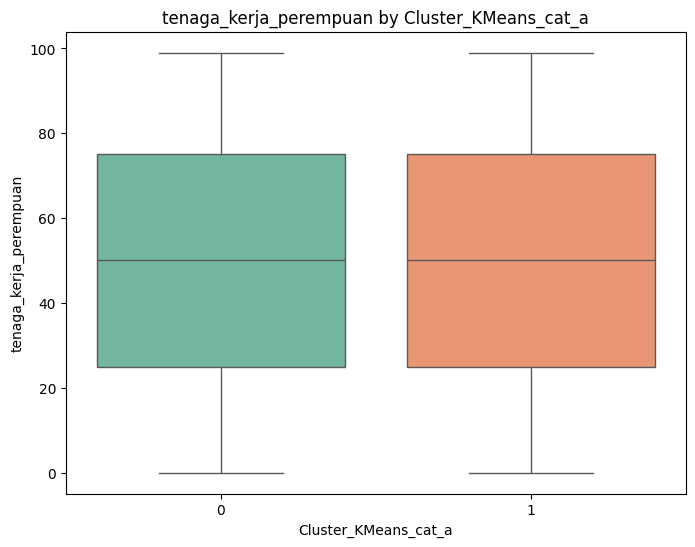

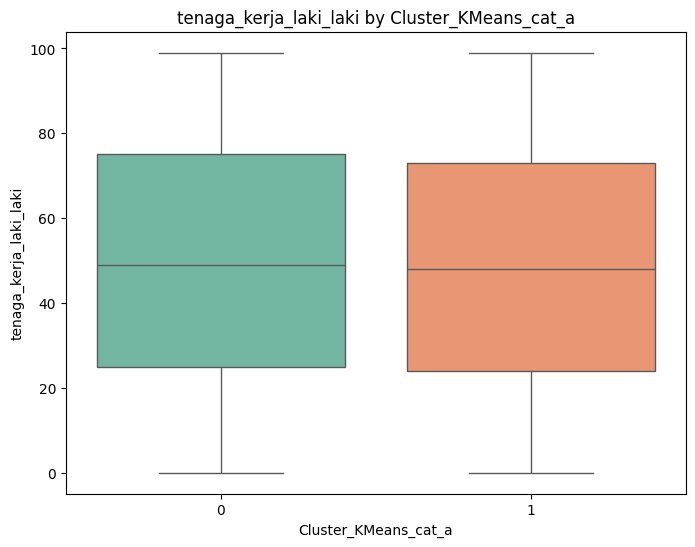

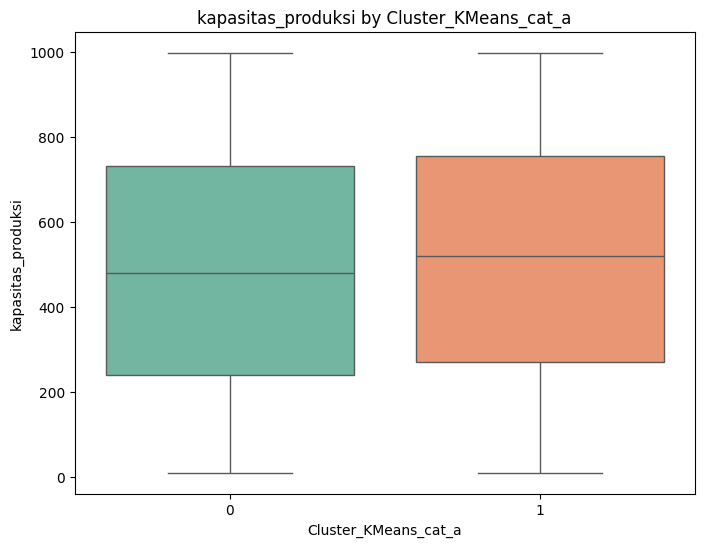

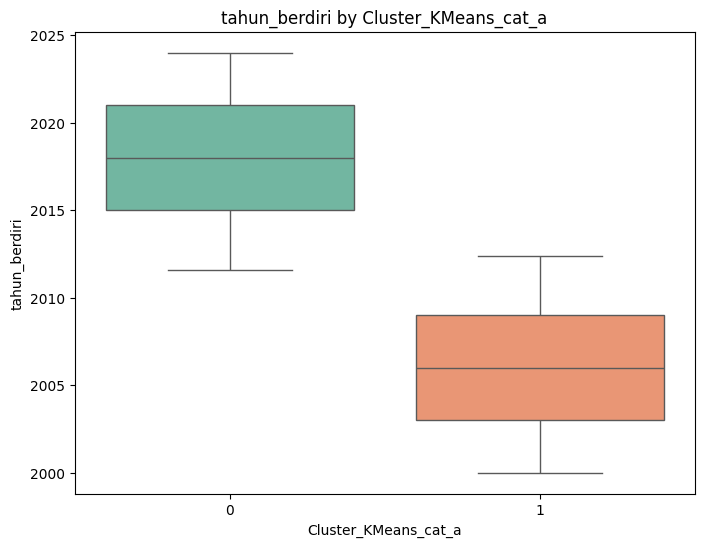

In [ ]:
print("\nVisualisasi untuk Klaster Berdasarkan Variabel cat_a")
plot_cluster_profiles(df_sebelum_scaling, 'Cluster_KMeans_cat_a', numerical_columns_cat_a)

#### Variabel cat_b


Visualisasi untuk Klaster Berdasarkan Variabel cat_b


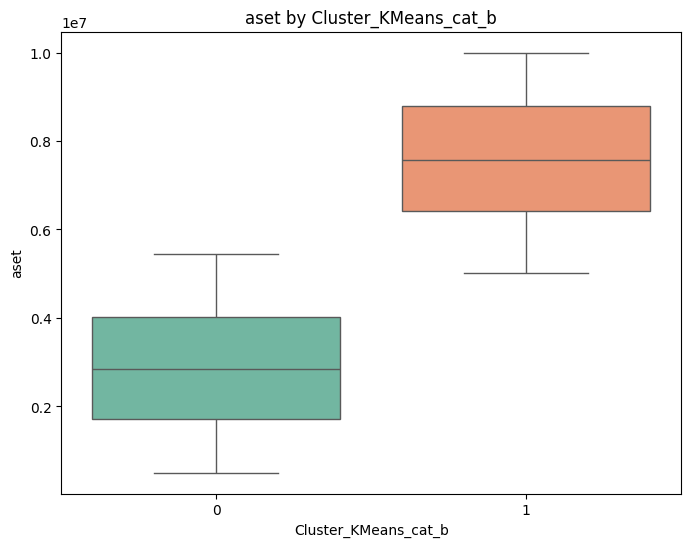

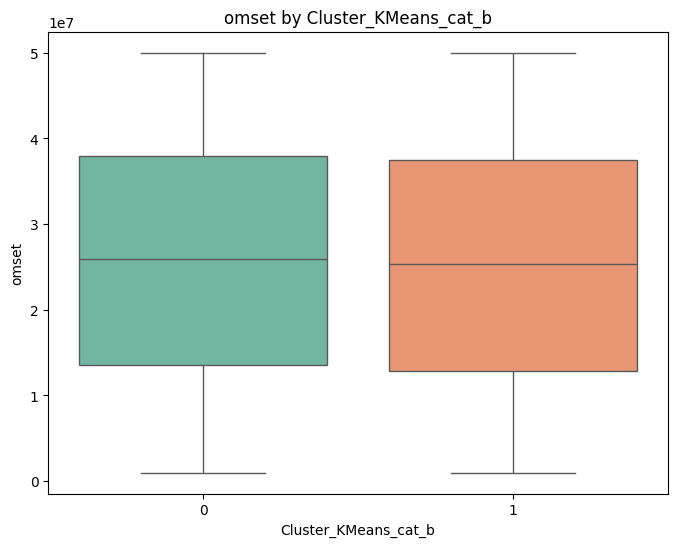

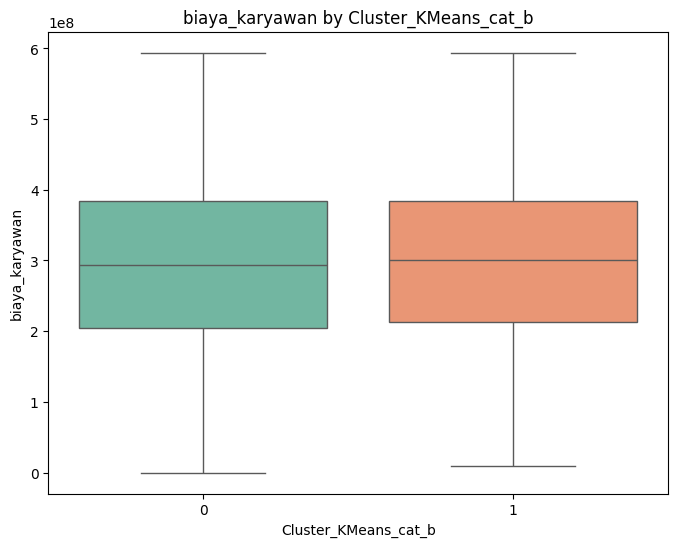

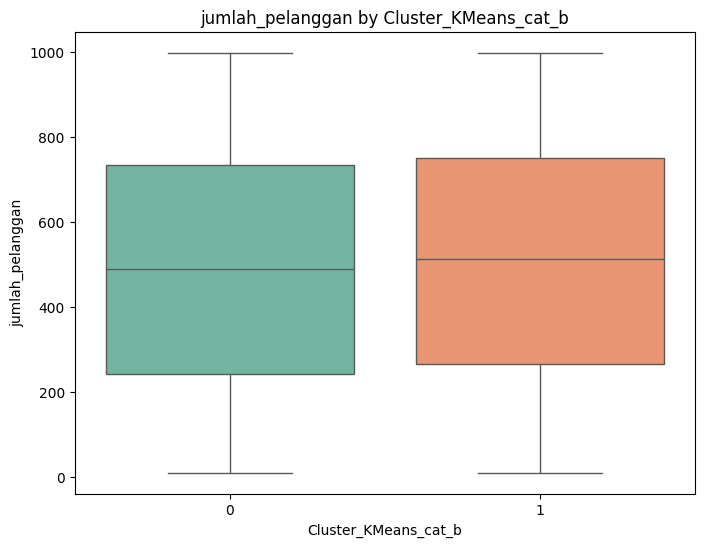

In [ ]:
print("\nVisualisasi untuk Klaster Berdasarkan Variabel cat_b")
plot_cluster_profiles(df_sebelum_scaling, 'Cluster_KMeans_cat_b', numerical_columns_cat_b)

### Narasi Cluster

In [ ]:
def generate_cluster_summary(df, cluster_column, variables):
    summary = []
    for cluster, group in df.groupby(cluster_column):
        desc = group[variables].mean().to_dict()
        summary.append(f"Cluster {cluster}: {desc}")
    return "\n".join(summary)

#### Variabel cat_a

In [ ]:
print("\nRingkasan untuk Klaster Variabel cat_a")
print(generate_cluster_summary(df_sebelum_scaling, 'Cluster_KMeans_cat_a', numerical_columns_cat_a))


Ringkasan untuk Klaster Variabel cat_a
Cluster 0: {'tenaga_kerja_perempuan': 49.7666322770818, 'tenaga_kerja_laki_laki': 49.57812822402358, 'kapasitas_produksi': 487.77630066322774, 'tahun_berdiri': 2018.2832719233604}
Cluster 1: {'tenaga_kerja_perempuan': 49.64817819737424, 'tenaga_kerja_laki_laki': 48.69842159610562, 'kapasitas_produksi': 511.82563799970495, 'tahun_berdiri': 2005.7612332202389}


#### Variabel cat_b

In [ ]:
print("\nRingkasan untuk Klaster Variabel cat_b")
print(generate_cluster_summary(df_sebelum_scaling, 'Cluster_KMeans_cat_b', numerical_columns_cat_b))


Ringkasan untuk Klaster Variabel cat_b
Cluster 0: {'aset': 2861281.1623013536, 'omset': 25789210.270512067, 'biaya_karyawan': 294942819.3054738, 'jumlah_pelanggan': 491.26365509123013}
Cluster 1: {'aset': 7594176.005673758, 'omset': 25321329.597665485, 'biaya_karyawan': 297837056.73758864, 'jumlah_pelanggan': 508.48942080378254}


# Predictive Modelling each Cluster (All not scaled without Omset, minimize mse)

In [ ]:
df_regresi = df_gabung.copy()

In [ ]:
for col in numerical_columns + categorical_columns:
    df_regresi[col] = df_sebelum_scaling[col]

In [ ]:
df_regresi.describe()

,laba,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,tahun_berdiri,status_legalitas,marketplace,kapasitas_produksi,aset,omset,biaya_karyawan,jumlah_pelanggan,Cluster_KMeans_cat_a,Cluster_KMeans_cat_b,CrossCluster
count,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00,13564.00
mean,20332633.04,3.00,49.71,49.14,2012.03,0.51,2.00,499.80,5222843.56,25555752.85,296386950.75,499.86,0.50,0.50,5.50
std,14498191.35,1.59,28.92,28.93,7.24,0.50,1.42,284.31,2731717.04,14194426.91,122406173.28,284.14,0.50,0.50,5.02
min,-8838836.00,0.00,0.00,0.00,2000.00,0.00,0.00,10.00,500233.00,1000509.00,0.00,10.00,0.00,0.00,0.00
25%,8037917.25,1.00,25.00,24.00,2006.00,0.00,1.00,253.00,2846307.75,13269129.50,210000000.00,253.00,0.00,0.00,0.00
50%,20447225.00,3.00,50.00,49.00,2012.00,1.00,2.00,501.00,5211009.00,25626271.50,297000000.00,502.00,0.00,0.00,1.00
75%,32646281.25,5.00,75.00,74.00,2018.00,1.00,3.00,744.00,7572153.75,37666122.10,384000000.00,743.00,1.00,1.00,10.00
max,49199297.00,6.00,99.00,99.00,2024.00,1.00,4.00,999.00,9999760.00,49999699.00,594000000.00,999.00,1.00,1.00,11.00


In [ ]:
df_klasifikasi = df_regresi.copy()
df_klasifikasi['klas_laba'] = df_klasifikasi['laba'].apply(lambda x: 'untung' if x > 0 else 'rugi')

print(df_klasifikasi[['laba', 'klas_laba']].head())

         laba klas_laba
0 -2149355.00      rugi
1 32571277.00    untung
2 16371593.00    untung
3 11124211.00    untung
4 -4636043.00      rugi


In [ ]:
# simpan csv
df_klasifikasi.to_csv(PATH + 'df_klasifikasi.csv', index=False)

# Run After Load Package & PATH

In [ ]:
df_klasifikasi = pd.read_csv(PATH + 'df_klasifikasi.csv')

In [ ]:
numerical_columns = [
    'tenaga_kerja_perempuan',
    'tenaga_kerja_laki_laki',
    'aset',
    'omset',
    'kapasitas_produksi',
    'tahun_berdiri',
    'laba',
    'biaya_karyawan',
    'jumlah_pelanggan',
    ]

categorical_columns = [
    'jenis_usaha',
    'status_legalitas',
    'marketplace',
    ]

target = 'klas_laba'

## Langkah 0: Exploratory Data Analysis

In [ ]:
df_klasifikasi[numerical_columns].describe()

,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,aset,omset,kapasitas_produksi,tahun_berdiri,laba,biaya_karyawan,jumlah_pelanggan
count,13564.000000,13564.000000,1.356400e+04,1.356400e+04,13564.00000,13564.000000,1.356400e+04,1.356400e+04,13564.000000
mean,49.707431,49.138469,5.222844e+06,2.555575e+07,499.79565,2012.025022,2.033263e+07,2.963870e+08,499.858758
std,28.921563,28.931288,2.731717e+06,1.419443e+07,284.31127,7.236680,1.449819e+07,1.224062e+08,284.144306
min,0.000000,0.000000,5.002330e+05,1.000509e+06,10.00000,2000.000000,-8.838836e+06,0.000000e+00,10.000000
25%,25.000000,24.000000,2.846308e+06,1.326913e+07,253.00000,2006.000000,8.037917e+06,2.100000e+08,253.000000
50%,50.000000,49.000000,5.211009e+06,2.562627e+07,501.00000,2012.000000,2.044722e+07,2.970000e+08,502.000000
75%,75.000000,74.000000,7.572154e+06,3.766612e+07,744.00000,2018.000000,3.264628e+07,3.840000e+08,743.000000
max,99.000000,99.000000,9.999760e+06,4.999970e+07,999.00000,2024.000000,4.919930e+07,5.940000e+08,999.000000


In [ ]:
df_klasifikasi_new = df_klasifikasi.copy()
for col in categorical_columns:
  df_klasifikasi_new[col] = df_klasifikasi_new[col].astype('category')
df_klasifikasi_new[categorical_columns].describe()

,jenis_usaha,status_legalitas,marketplace
count,13564.0,13564.0,13564.0
unique,20.0,6.0,20.0
top,1.0,1.0,4.0
freq,3403.0,6901.0,2758.0


In [ ]:
label_encoding_maps = {
    'jenis_usaha': {'Fashion': 0, 'Jasa': 1, 'Kesehatan': 2, 'Makanan & Minuman': 3, 'Pendidikan': 4, 'Perdagangan': 5, 'Perusahaan': 6},
    'status_legalitas': {'Belum Terdaftar': 0, 'Terdaftar': 1},
    'marketplace': {'Bukalapak': 0, 'Lazada': 1, 'Shopee': 2, 'Tokopedia': 3, 'Website Sendiri': 4}
}

def inverse_label_encoding(df, label_encoding_maps):
    """
    Performs inverse label encoding on specified columns of a DataFrame.

    Args:
        df: pandas DataFrame with label encoded columns.
        label_encoding_maps: A dictionary containing the forward label mappings.

    Returns:
        pandas DataFrame with inverse label encoded columns.
    """
    df_decoded = df.copy()
    inverse_label_encoding_maps = {}

    for col, mapping in label_encoding_maps.items():
        # Create the inverse mapping
        inverse_mapping = {v: k for k, v in mapping.items()}
        inverse_label_encoding_maps[col] = inverse_mapping

        # Apply inverse mapping to the column
        if col in df_decoded.columns:
             # Ensure the column is of integer type before mapping if it's not already
             df_decoded[col] = df_decoded[col].astype(int)
             df_decoded[col] = df_decoded[col].map(inverse_mapping)
             # Convert back to category if the original column was category
             if df[col].dtype.name == 'category':
                 df_decoded[col] = df_decoded[col].astype('category')


    return df_decoded, inverse_label_encoding_maps

# Example usage with the provided label_encoding_maps
df_klasifikasi_new, inverse_maps = inverse_label_encoding(df_klasifikasi, label_encoding_maps)

df_klasifikasi_new[categorical_columns].describe()

,jenis_usaha,status_legalitas,marketplace
count,13564,13564,13564
unique,7,2,5
top,Jasa,Terdaftar,Website Sendiri
freq,3411,6901,2758


In [ ]:
df_klasifikasi[target].describe()

,klas_laba
count,13564
unique,2
top,untung
freq,12356


### Histogram Kolom Numerik

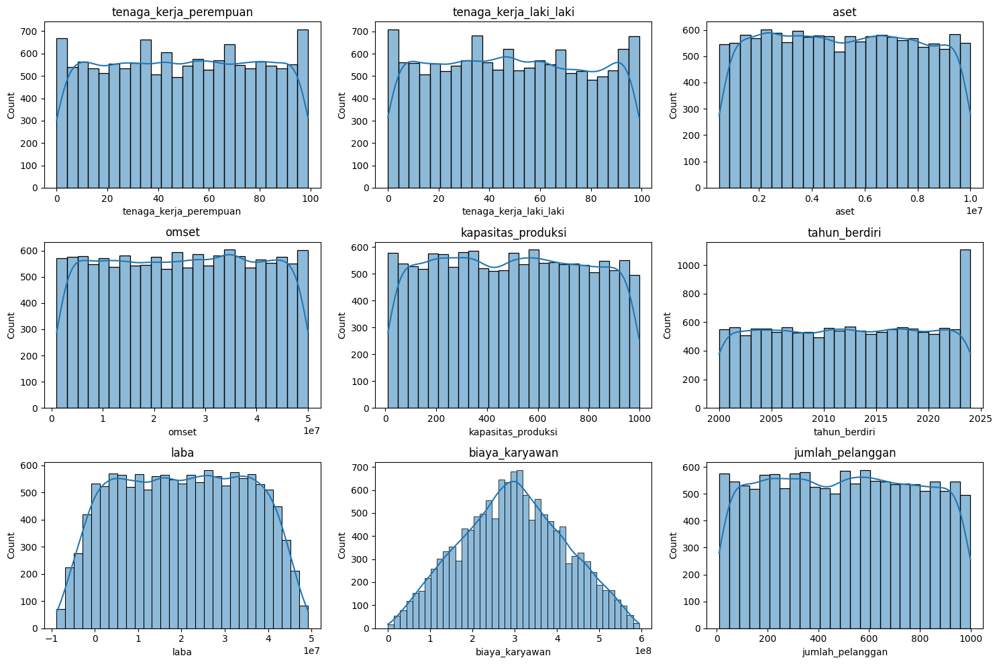

In [ ]:
# Histogram distribusi data numerik dalam 1 gambar
plt.figure(figsize=(15, 10))

# Filter numerical_columns based on what's actually in df_klasifikasi
present_numerical_columns = [col for col in numerical_columns if col in df_klasifikasi.columns]

# Iterasi melalui setiap kolom numerik dalam DataFrame
for i, col in enumerate(present_numerical_columns):
    plt.subplot(3, 3, i + 1)  # Membuat subplot sesuai jumlah kolom numerik
    sns.histplot(df_klasifikasi[col], kde=True)  # Plot histogram dengan KDE
    plt.title(col)  # Judul subplot

plt.tight_layout()
plt.show()

### Box Plot Kolom Numerik

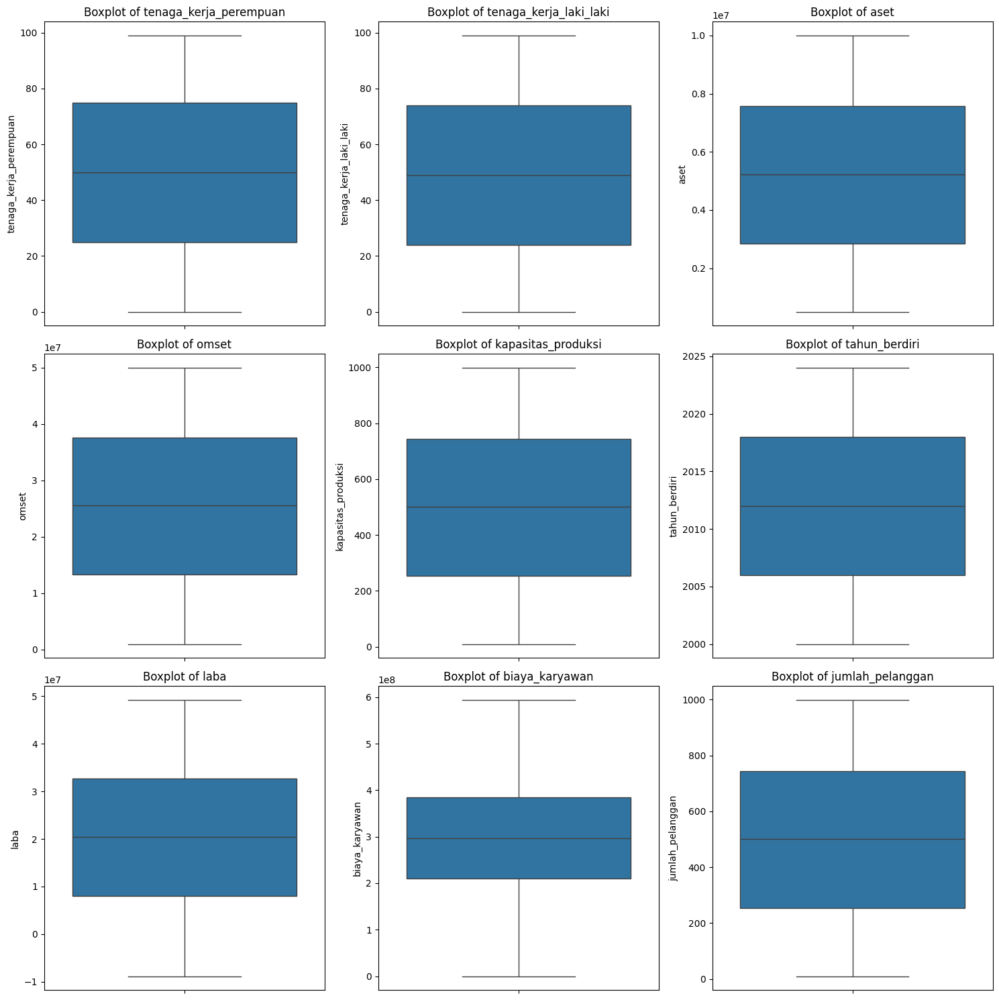

In [ ]:
def plot_numerical_boxplots(df, numerical_cols):
    """
    Generates boxplots for numerical columns in a DataFrame.

    Args:
        df: pandas DataFrame.
        numerical_cols: List of numerical column names.
    """
    num_cols = len(numerical_cols)
    num_rows = (num_cols + 2) // 3  # Calculate number of rows needed (approx. 3 plots per row)

    plt.figure(figsize=(15, num_rows * 5))

    # Filter numerical_columns based on what's actually in df
    present_numerical_columns = [col for col in numerical_cols if col in df.columns]

    for i, col in enumerate(present_numerical_columns):
        plt.subplot(num_rows, 3, i + 1)
        sns.boxplot(y=df[col])
        plt.title(f'Boxplot of {col}')
        plt.ylabel(col)

    plt.tight_layout()
    plt.show()

# Generate boxplots for numerical_columns
plot_numerical_boxplots(df_klasifikasi, numerical_columns)

### Box Plot Kolom Numerik setiap Kelas Laba

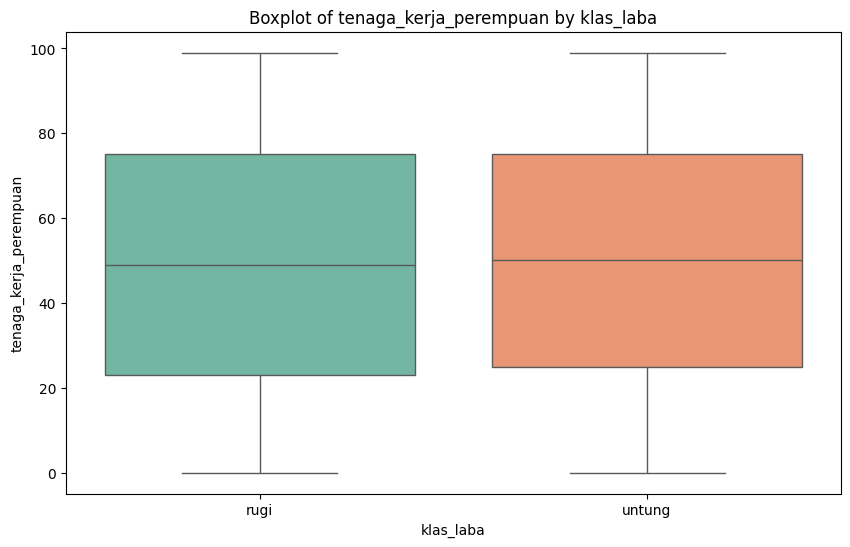

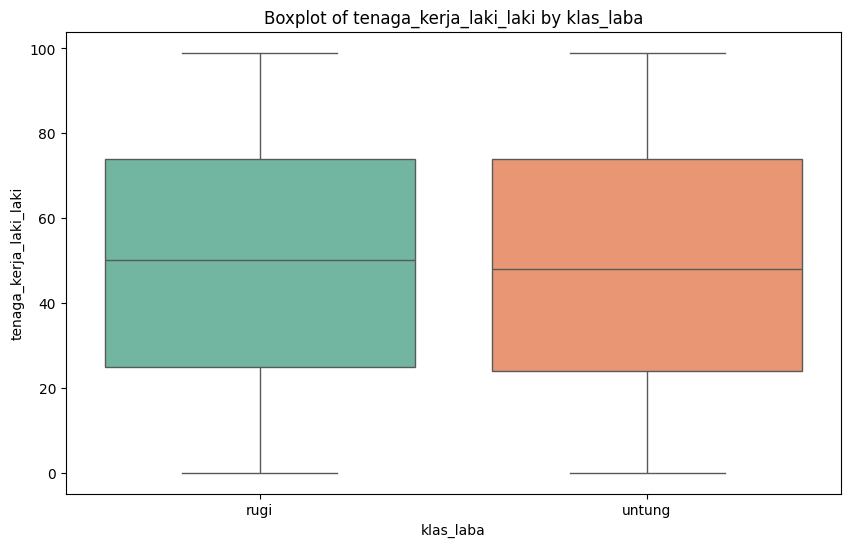

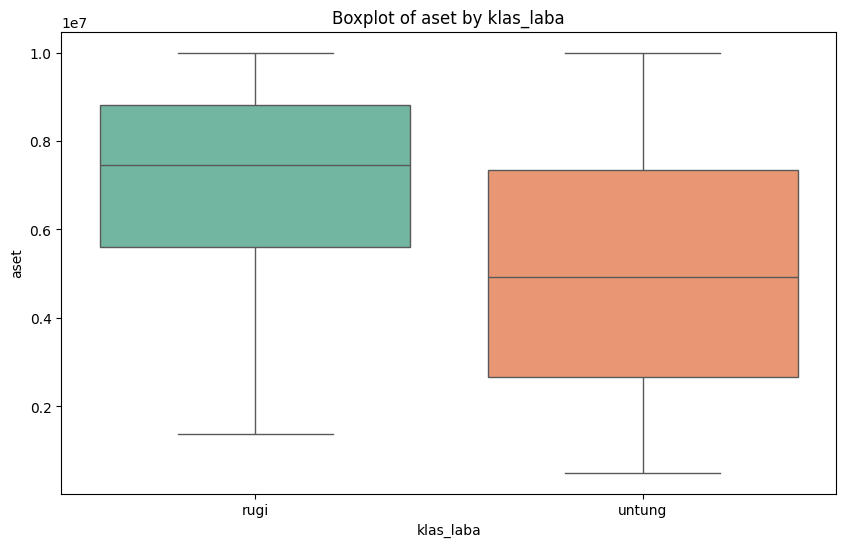

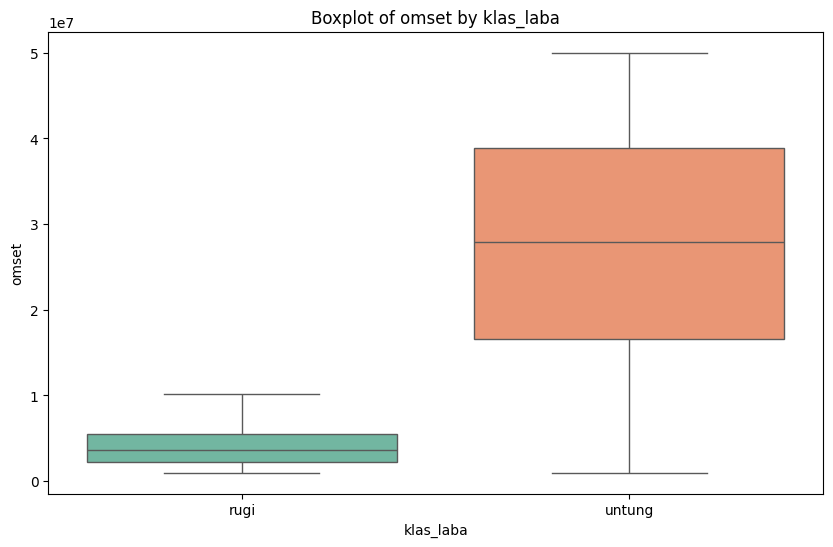

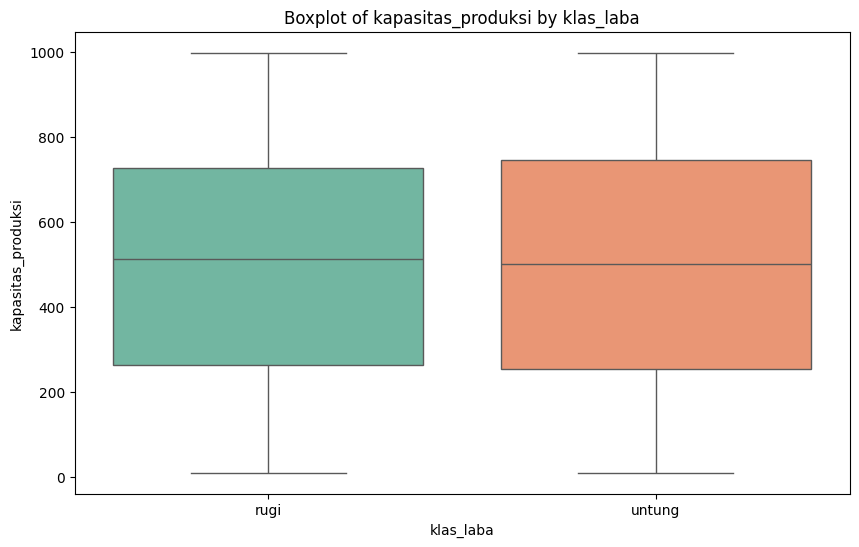

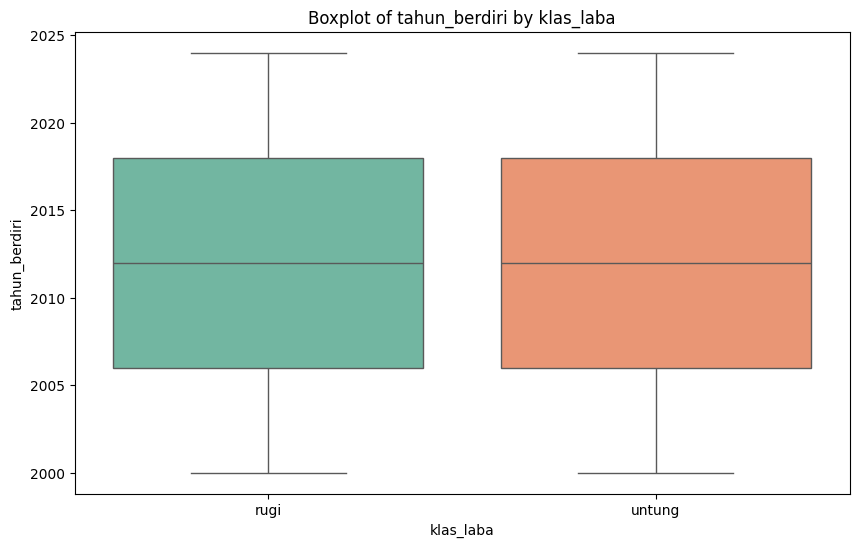

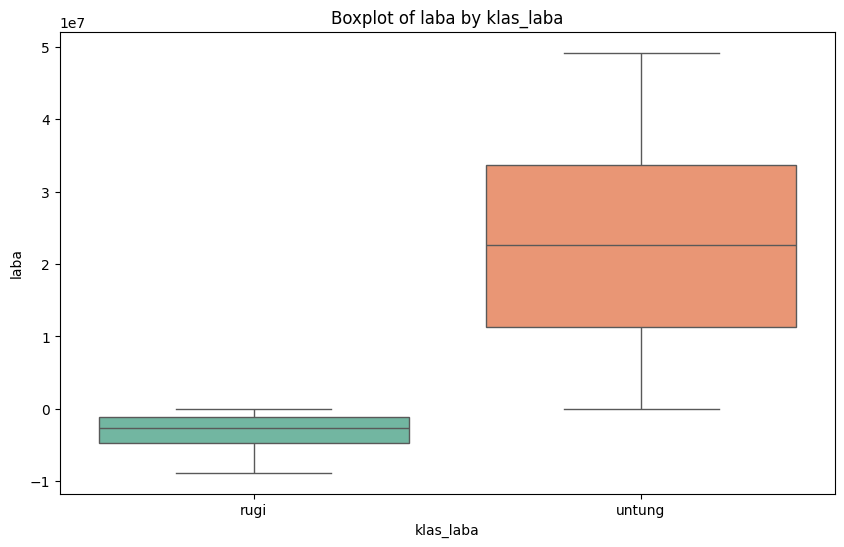

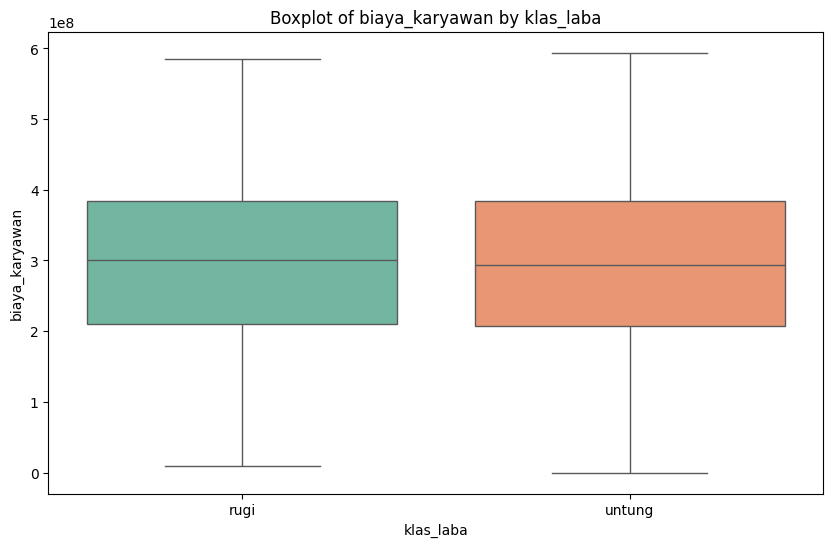

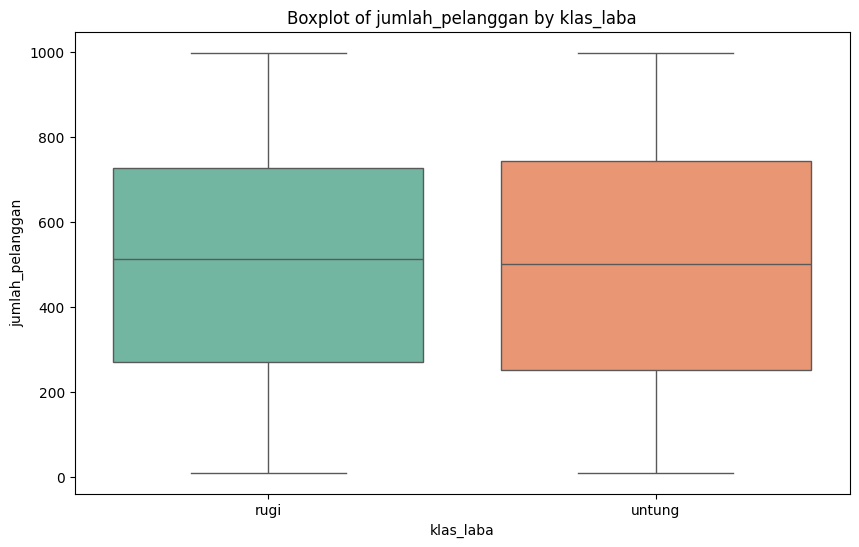

In [ ]:
def plot_clustered_boxplots(df, numerical_cols, cluster_col):
    """
    Generates boxplots for numerical columns, grouped by a cluster column.

    Args:
        df: pandas DataFrame.
        numerical_cols: List of numerical column names.
        cluster_col: Name of the column containing cluster labels.
    """
    # Filter numerical_columns based on what's actually in df
    present_numerical_columns = [col for col in numerical_cols if col in df.columns]

    for col in present_numerical_columns:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cluster_col, y=col, data=df, palette='Set2')
        plt.title(f'Boxplot of {col} by {cluster_col}')
        plt.xlabel(cluster_col)
        plt.ylabel(col)
        plt.show()

# Generate boxplots for numerical_columns for each category of klas_laba
plot_clustered_boxplots(df_klasifikasi, numerical_columns, target)

### Heatmap Korelasi Kolom Numerik

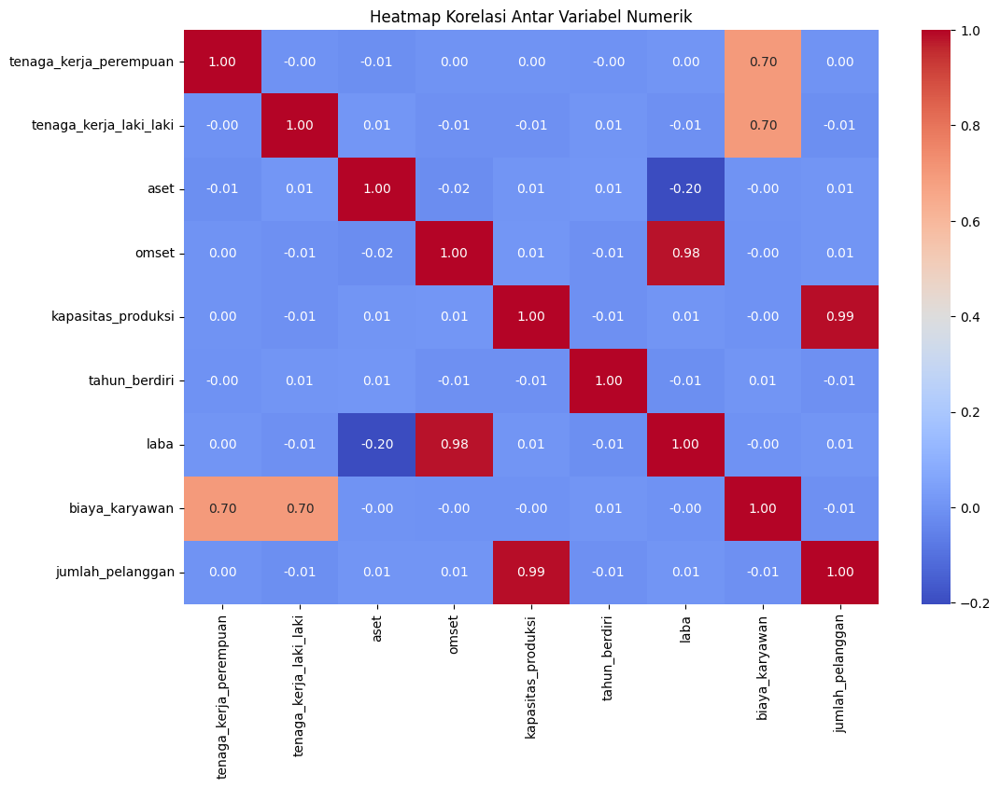

In [ ]:
numerical_data = df_klasifikasi[numerical_columns]

plt.figure(figsize=(12, 8))
sns.heatmap(numerical_data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap Korelasi Antar Variabel Numerik')
plt.show()

### Heatmap Korelasi Seluruh Kolom

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13564 entries, 0 to 13563
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   laba                    13564 non-null  float64
 1   jenis_usaha             13564 non-null  float64
 2   tenaga_kerja_perempuan  13564 non-null  float64
 3   tenaga_kerja_laki_laki  13564 non-null  float64
 4   tahun_berdiri           13564 non-null  float64
 5   status_legalitas        13564 non-null  float64
 6   marketplace             13564 non-null  float64
 7   kapasitas_produksi      13564 non-null  float64
 8   aset                    13564 non-null  float64
 9   omset                   13564 non-null  float64
 10  biaya_karyawan          13564 non-null  float64
 11  jumlah_pelanggan        13564 non-null  float64
 12  klas_laba               13564 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 1.3 MB


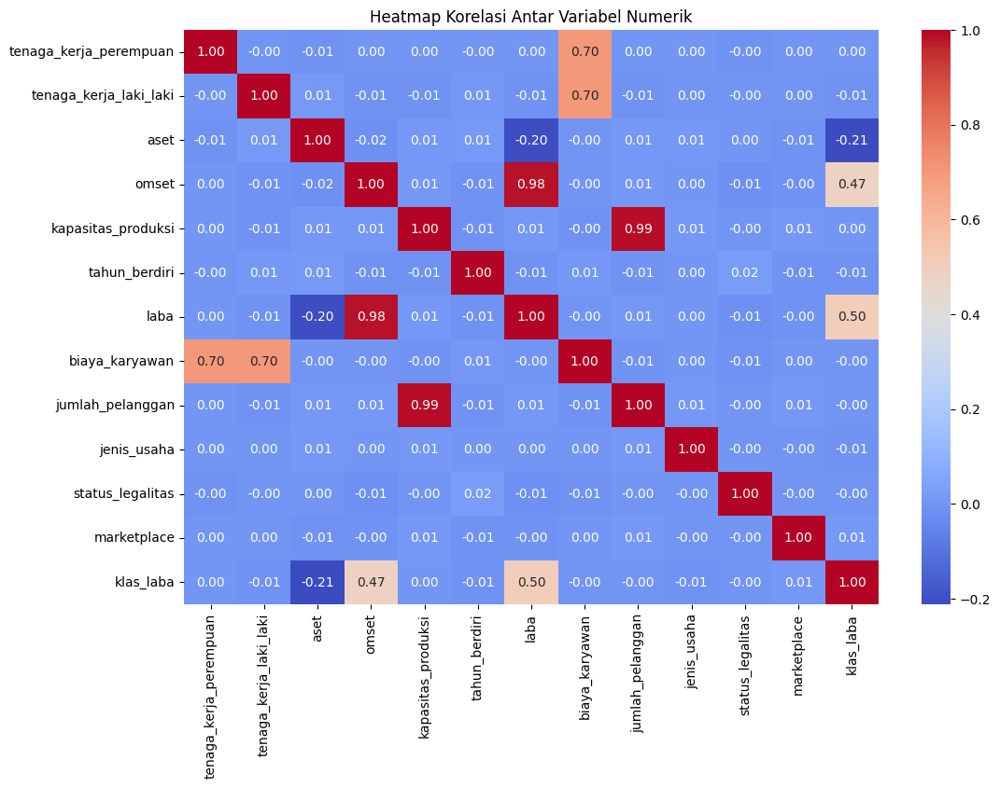

In [ ]:
df_klasifikasi_numeric_coba = df_klasifikasi.drop(columns=['nama_usaha'])
# df_klasifikasi_numeric_coba['klas_laba'] menjadi untung: 1, rugi: 0
df_klasifikasi_numeric_coba = df_klasifikasi_numeric_coba.drop(columns=[col for col in df_klasifikasi_numeric_coba.columns if 'Cluster' in col])
df_klasifikasi_numeric_coba['klas_laba'] = df_klasifikasi_numeric_coba['klas_laba'].map({'untung': 1, 'rugi': 0})
df_klasifikasi_numeric_coba.info()

plt.figure(figsize=(12, 8))
sns.heatmap(df_klasifikasi_numeric_coba[numerical_columns + categorical_columns + ['klas_laba']].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap Korelasi Antar Variabel Numerik')
plt.show()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13564 entries, 0 to 13563
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   laba                    13564 non-null  float64
 1   jenis_usaha             13564 non-null  float64
 2   tenaga_kerja_perempuan  13564 non-null  float64
 3   tenaga_kerja_laki_laki  13564 non-null  float64
 4   tahun_berdiri           13564 non-null  float64
 5   status_legalitas        13564 non-null  float64
 6   marketplace             13564 non-null  float64
 7   kapasitas_produksi      13564 non-null  float64
 8   aset                    13564 non-null  float64
 9   omset                   13564 non-null  float64
 10  biaya_karyawan          13564 non-null  float64
 11  jumlah_pelanggan        13564 non-null  float64
 12  Cluster_KMeans_cat_a    13564 non-null  int64  
 13  Cluster_KMeans_cat_b    13564 non-null  int64  
 14  CrossCluster            13564 non-null

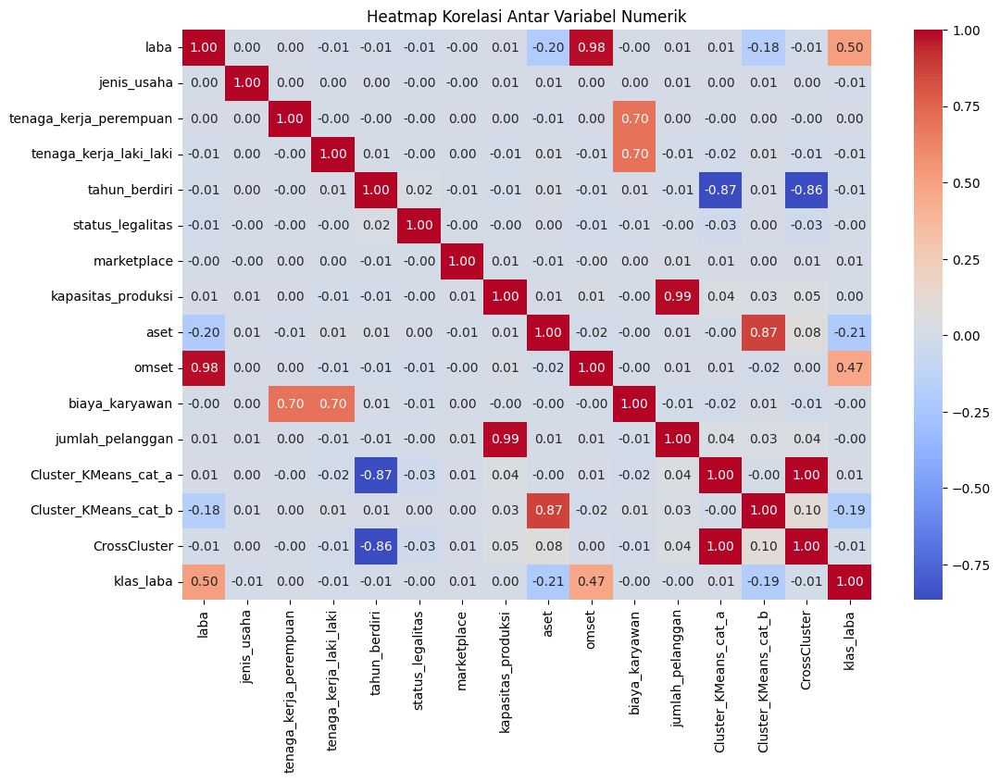

In [ ]:
df_klasifikasi_numeric = df_klasifikasi.drop(columns=['nama_usaha'])
# df_klasifikasi_numeric['klas_laba'] menjadi untung: 1, rugi: 0
df_klasifikasi_numeric['klas_laba'] = df_klasifikasi_numeric['klas_laba'].map({'untung': 1, 'rugi': 0})
df_klasifikasi_numeric.info()

plt.figure(figsize=(12, 8))
sns.heatmap(df_klasifikasi_numeric.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap Korelasi Antar Variabel Numerik')
plt.show()

### Distribusi Kolom Kategorik dan Kelas Laba

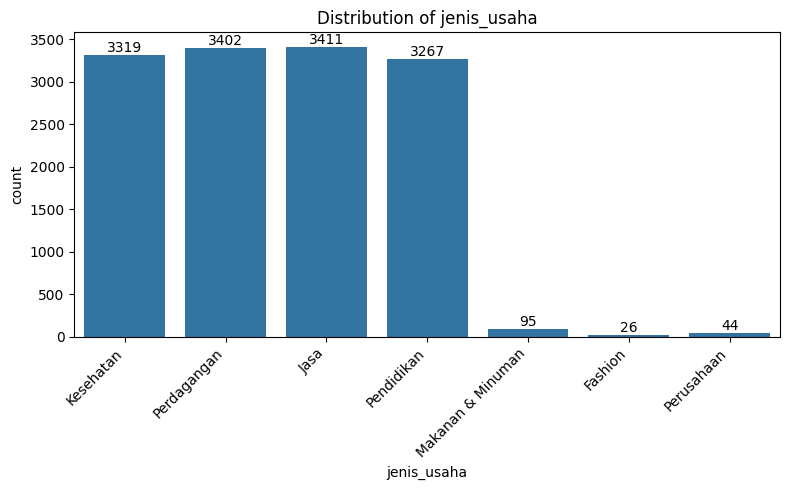

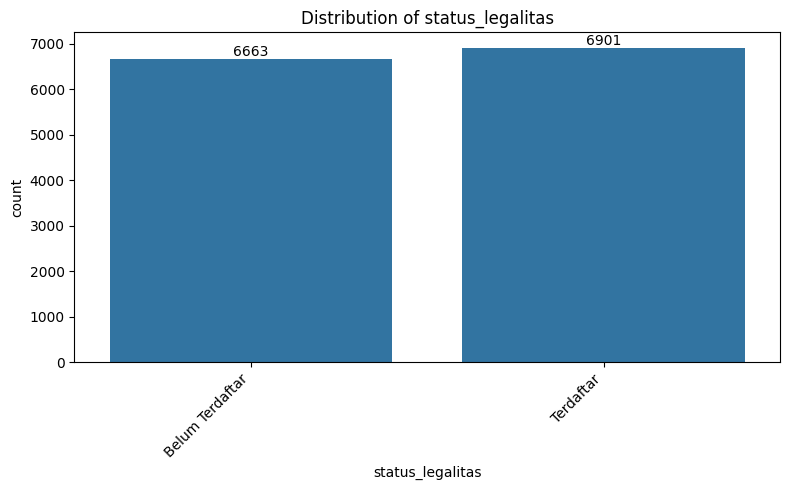

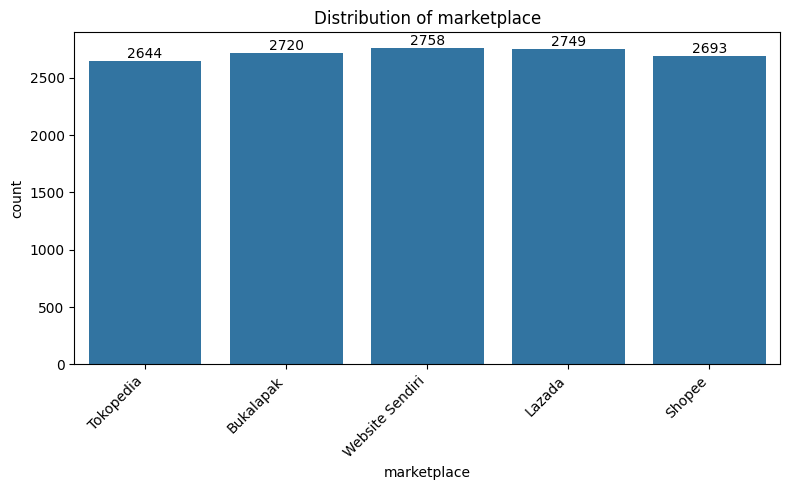

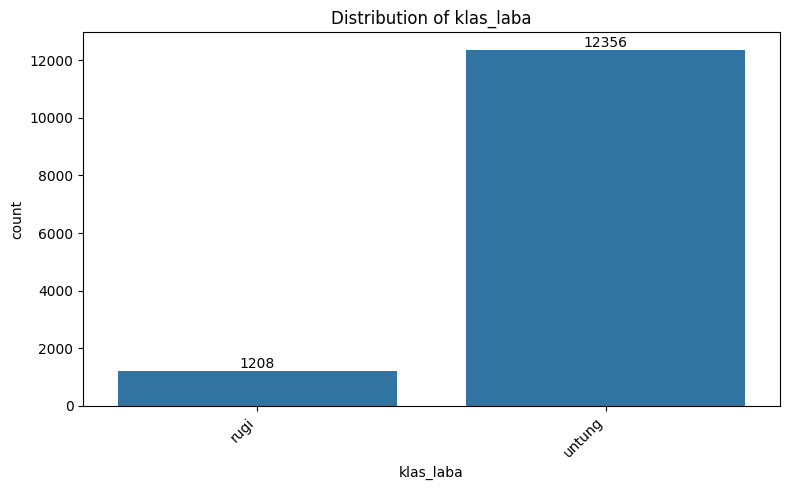

In [ ]:
for col in categorical_columns + [target]:
    plt.figure(figsize=(8, 5))
    ax = sns.countplot(x=col, data=df_klasifikasi_new)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45, ha='right')

    # Menambahkan nilai count di atas bar
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 5), textcoords='offset points')

    plt.tight_layout()
    plt.show()


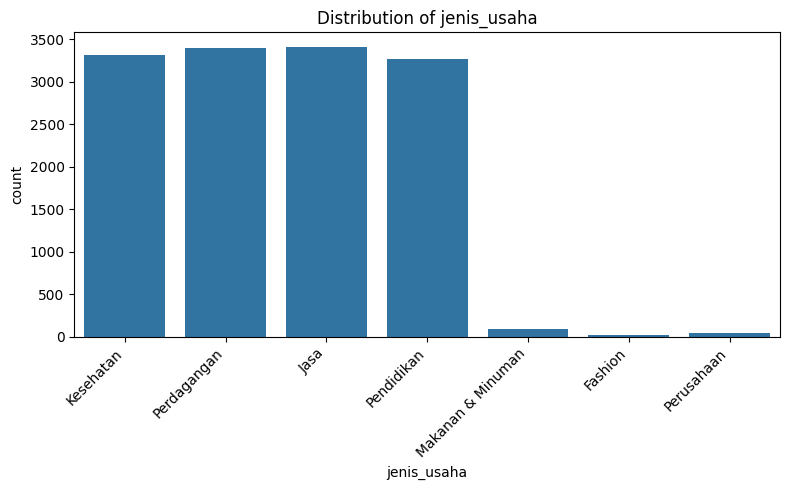

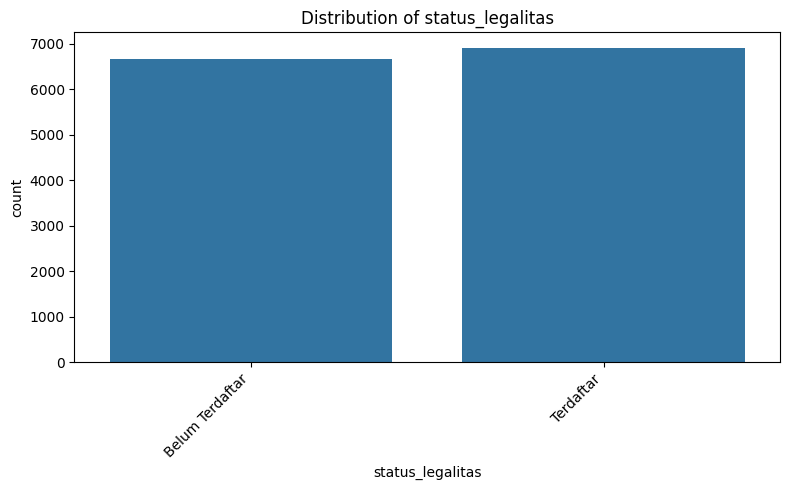

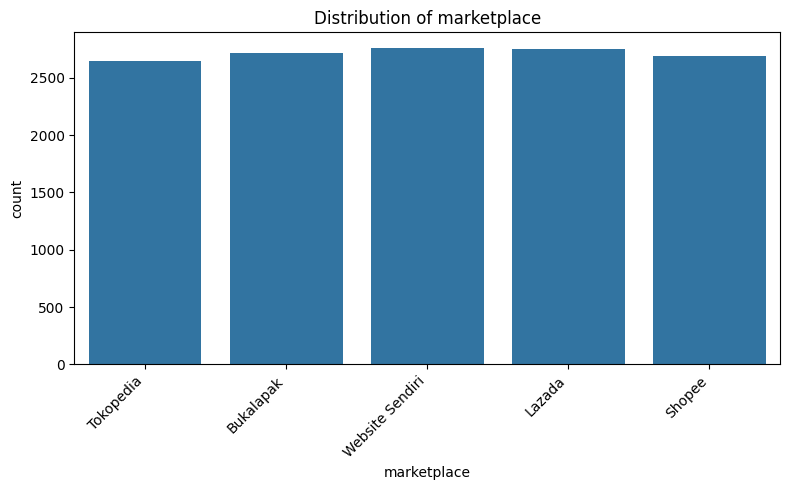

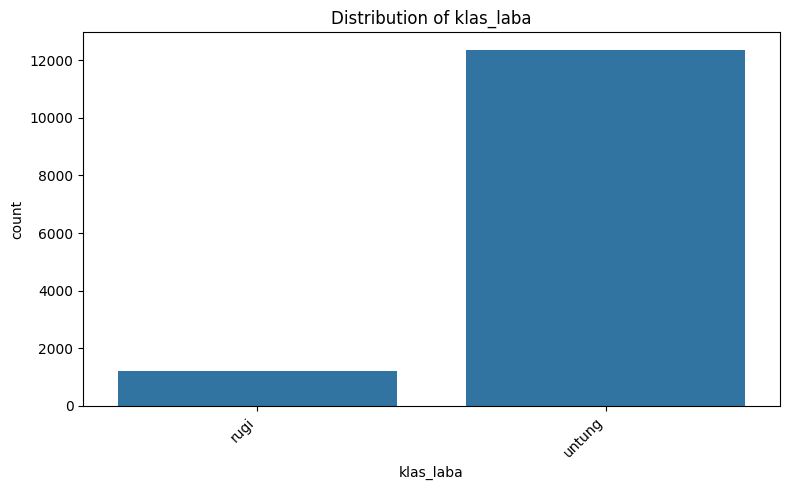

In [ ]:
# Sebaran data kategorikal
for col in categorical_columns + [target]:
    plt.figure(figsize=(8, 5))
    sns.countplot(x=col, data=df_klasifikasi_new)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

### Pemisahan Cross Cluster

In [ ]:
best_clusters = df_klasifikasi['CrossCluster']
cross_cluster = best_clusters.unique()
print(f"Kolom: {'CrossCluster'}")
print(f"Nilai CrossCluster: {cross_cluster}")
print(f"Banyak CrossCluster: {len(cross_cluster)}\n")

# Pecah data menjadi len(cross_cluster) DataFrame berdasarkan klaster
dfs_per_cluster = {}
for cluster_id in cross_cluster:
    # Ambil data yang memiliki klaster yang sama
    cluster_data = df_klasifikasi[best_clusters == cluster_id].copy()
    dfs_per_cluster[cluster_id] = cluster_data

Kolom: CrossCluster
Nilai CrossCluster: [ 1 11 10  0]
Banyak CrossCluster: 4



In [ ]:
dfs_per_cluster[0].head()

,nama_usaha,laba,jenis_usaha,tenaga_kerja_perempuan,tenaga_kerja_laki_laki,tahun_berdiri,status_legalitas,marketplace,kapasitas_produksi,aset,omset,biaya_karyawan,jumlah_pelanggan,Cluster_KMeans_cat_a,Cluster_KMeans_cat_b,CrossCluster,klas_laba
12,UD. Elyas Wiraatmaja,17065158.0,5.0,11.0,81.0,2015.0,0.0,0.0,593.0,4557522.0,21622680.0,276000000.0,593.0,0,0,0,untung
14,UD. Hasna Saputranegara,12644475.0,2.0,51.0,47.0,2019.0,0.0,2.0,143.0,606340.0,13250815.0,294000000.0,143.0,0,0,0,untung
17,UD. Farhan Sukadarma,42613809.0,5.0,99.0,61.0,2016.0,0.0,3.0,661.0,1242635.0,43856444.0,480000000.0,661.0,0,0,0,untung
21,UD. Putri Wiraatmaja Rafif,27949766.0,5.0,44.0,58.0,2016.0,1.0,4.0,904.0,4791730.0,32773263.4,306000000.0,904.0,0,0,0,untung
23,UD. Dea Tunggul Ziva,42316256.0,5.0,41.0,65.0,2014.0,1.0,4.0,841.0,3938582.0,46254838.0,318000000.0,841.0,0,0,0,untung


In [ ]:
df_klasifikasi = df_klasifikasi.drop(columns=['nama_usaha'])
df_klasifikasi = df_klasifikasi.loc[:, ~df_klasifikasi.columns.str.contains('Cluster')]
df_klasifikasi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13564 entries, 0 to 13563
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   laba                    13564 non-null  float64
 1   jenis_usaha             13564 non-null  float64
 2   tenaga_kerja_perempuan  13564 non-null  float64
 3   tenaga_kerja_laki_laki  13564 non-null  float64
 4   tahun_berdiri           13564 non-null  float64
 5   status_legalitas        13564 non-null  float64
 6   marketplace             13564 non-null  float64
 7   kapasitas_produksi      13564 non-null  float64
 8   aset                    13564 non-null  float64
 9   omset                   13564 non-null  float64
 10  biaya_karyawan          13564 non-null  float64
 11  jumlah_pelanggan        13564 non-null  float64
 12  klas_laba               13564 non-null  object 
dtypes: float64(12), object(1)
memory usage: 1.3+ MB


In [ ]:
y_column = 'klas_laba'  # Variabel target tetap 'laba'
X_columns = [col for col in df_klasifikasi.columns if col not in [y_column, 'omset', 'laba']]
X_columns

['jenis_usaha',
 'tenaga_kerja_perempuan',
 'tenaga_kerja_laki_laki',
 'tahun_berdiri',
 'status_legalitas',
 'marketplace',
 'kapasitas_produksi',
 'aset',
 'biaya_karyawan',
 'jumlah_pelanggan']

In [ ]:
from sklearn.model_selection import train_test_split

# Menyimpan hasil pembagian data untuk setiap klaster
train_test_split_results = {}

# Lakukan pembagian data untuk setiap klaster
for cluster_id, cluster_data in dfs_per_cluster.items():
    print(f"\nMembagi data untuk Klaster {cluster_id}...")

    # Pastikan kolom 'klas_laba' tersedia
    if 'klas_laba' not in cluster_data.columns:
        print(f"❌ Kolom 'klas_laba' tidak ditemukan dalam data klaster {cluster_id}, lewati klaster ini.")
        continue

    # Tampilkan distribusi kelas sebelum split
    klas_laba_counts = cluster_data['klas_laba'].value_counts()
    print(f"Distribusi data berdasarkan 'klas_laba' sebelum split untuk Klaster {cluster_id}:")
    print(klas_laba_counts)

    # Cek apakah cukup kelas untuk dilakukan stratifikasi
    if klas_laba_counts.min() < 2:
        print(f"⚠️ Tidak cukup data di salah satu kelas untuk stratifikasi. Lewati klaster ini.")
        continue

    # Pilih Y (target) dan X (fitur) untuk setiap klaster
    Y_cluster = cluster_data[y_column]
    X_cluster = cluster_data[X_columns]
    stratify_labels = cluster_data['klas_laba']

    # Pembagian data dengan stratifikasi berdasarkan klas_laba
    try:
        X_train_cluster, X_test_cluster, Y_train_cluster, Y_test_cluster = train_test_split(
            X_cluster, Y_cluster, test_size=0.2, random_state=42, stratify=stratify_labels)

        # Simpan hasil pembagian data untuk klaster ini
        train_test_split_results[cluster_id] = {
            'X_train': X_train_cluster,
            'X_test': X_test_cluster,
            'Y_train': Y_train_cluster,
            'Y_test': Y_test_cluster
        }

        # Menampilkan dimensi data setelah split
        print(f"✅ Dimensi data pelatihan (X_train, Y_train): {X_train_cluster.shape}, {Y_train_cluster.shape}")
        print(f"✅ Dimensi data pengujian (X_test, Y_test): {X_test_cluster.shape}, {Y_test_cluster.shape}")

    except ValueError as e:
        print(f"❌ Gagal melakukan stratified split untuk klaster {cluster_id}: {e}")


Membagi data untuk Klaster 1...
Distribusi data berdasarkan 'klas_laba' sebelum split untuk Klaster 1:
klas_laba
untung    2889
rugi       500
Name: count, dtype: int64
✅ Dimensi data pelatihan (X_train, Y_train): (2711, 10), (2711,)
✅ Dimensi data pengujian (X_test, Y_test): (678, 10), (678,)

Membagi data untuk Klaster 11...
Distribusi data berdasarkan 'klas_laba' sebelum split untuk Klaster 11:
klas_laba
untung    2913
rugi       466
Name: count, dtype: int64
✅ Dimensi data pelatihan (X_train, Y_train): (2703, 10), (2703,)
✅ Dimensi data pengujian (X_test, Y_test): (676, 10), (676,)

Membagi data untuk Klaster 10...
Distribusi data berdasarkan 'klas_laba' sebelum split untuk Klaster 10:
klas_laba
untung    3274
rugi       126
Name: count, dtype: int64
✅ Dimensi data pelatihan (X_train, Y_train): (2720, 10), (2720,)
✅ Dimensi data pengujian (X_test, Y_test): (680, 10), (680,)

Membagi data untuk Klaster 0...
Distribusi data berdasarkan 'klas_laba' sebelum split untuk Klaster 0:
klas

In [ ]:
# Mapping label: 'untung' → 1, 'rugi' → 0
label_map = {'untung': 1, 'rugi': 0}

# Terapkan ke semua klaster
for cluster_id, data in train_test_split_results.items():
    train_test_split_results[cluster_id]['Y_train'] = data['Y_train'].map(label_map)
    train_test_split_results[cluster_id]['Y_test'] = data['Y_test'].map(label_map)

In [ ]:
train_test_split_results

{1: {'X_train':        jenis_usaha  tenaga_kerja_perempuan  tenaga_kerja_laki_laki  \
  8867           5.0                     4.0                    28.0   
  6457           1.0                    32.0                    71.0   
  3879           5.0                     3.0                    81.0   
  12264          4.0                    39.0                    31.0   
  1757           1.0                    62.0                    34.0   
  ...            ...                     ...                     ...   
  1745           4.0                    68.0                    70.0   
  6797           5.0                    94.0                    62.0   
  8032           4.0                    70.0                    23.0   
  6406           1.0                    83.0                    83.0   
  8366           4.0                    34.0                    89.0   
  
         tahun_berdiri  status_legalitas  marketplace  kapasitas_produksi  \
  8867          2016.0               0.0  

In [ ]:
# Simpan hasil pembagian data ke dalam file CSV
for cluster_id, split_data in train_test_split_results.items():
    # Simpan X_train, X_test, Y_train, Y_test untuk setiap klaster
    split_data['X_train'].to_csv(f'{PATH}klas_X_train_cluster_{cluster_id}.csv', index=False)
    split_data['X_test'].to_csv(f'{PATH}klas_X_test_cluster_{cluster_id}.csv', index=False)
    split_data['Y_train'].to_csv(f'{PATH}klas_Y_train_cluster_{cluster_id}.csv', index=False)
    split_data['Y_test'].to_csv(f'{PATH}klas_Y_test_cluster_{cluster_id}.csv', index=False)
    print(f"Data untuk Klaster {cluster_id} berhasil disimpan.")

Data untuk Klaster 1 berhasil disimpan.
Data untuk Klaster 11 berhasil disimpan.
Data untuk Klaster 10 berhasil disimpan.
Data untuk Klaster 0 berhasil disimpan.


## Langkah 1: Tuning Parameter dengan Optuna

In [ ]:
!pip install optuna

In [ ]:
import optuna
from sklearn.metrics import balanced_accuracy_score
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# Menyimpan hasil evaluasi untuk setiap klaster
models = {
    'XGBoost': {},
    'CatBoost': {},
    'LightGBM': {},
    'RandomForest': {}
}
predictions = {
    'XGBoost': {},
    'CatBoost': {},
    'LightGBM': {},
    'RandomForest': {}
}
proba_predictions = {
    'XGBoost': {},
    'CatBoost': {},
    'LightGBM': {},
    'RandomForest': {}
}
def get_scale_pos_weight(y):
    # Hindari pembagian nol jika tidak ada minoritas
    neg = np.sum(y == 0)
    pos = np.sum(y == 1)
    return neg / pos if pos > 0 else 1

def objective_xgb(trial, X_train, Y_train, X_test, Y_test, scale_pos_weight):
    param = {
        'n_estimators': trial.suggest_categorical('n_estimators', [100, 200, 300]),
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 6),
        'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-4, 1.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-4, 1.0, log=True),
        'scale_pos_weight': trial.suggest_categorical('scale_pos_weight', [scale_pos_weight])
    }
    model = XGBClassifier(**param, use_label_encoder=False, eval_metric='logloss', random_state=42)
    model.fit(X_train, Y_train)
    pred = model.predict(X_test)
    return balanced_accuracy_score(Y_test, pred)

def objective_catboost(trial, X_train, Y_train, X_test, Y_test, scale_pos_weight):
    param = {
        'iterations': trial.suggest_categorical('iterations', [100, 200, 300]),
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 0.1, log=True),
        'depth': trial.suggest_int('depth', 3, 6),
        'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-4, 10.0, log=True),
        'border_count': trial.suggest_int('border_count', 32, 255),
        'scale_pos_weight': trial.suggest_categorical('scale_pos_weight', [scale_pos_weight])
    }
    model = CatBoostClassifier(**param, random_state=42, verbose=0)
    model.fit(X_train, Y_train)
    pred = model.predict(X_test)
    return balanced_accuracy_score(Y_test, pred)

def objective_lgb(trial, X_train, Y_train, X_test, Y_test, scale_pos_weight):
    param = {
        'n_estimators': trial.suggest_categorical('n_estimators', [100, 200, 300]),
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 6),
        'num_leaves': trial.suggest_int('num_leaves', 31, 100),
        'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-4, 1.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-4, 1.0, log=True),
        'scale_pos_weight': trial.suggest_categorical('scale_pos_weight', [scale_pos_weight])
    }
    model = lgb.LGBMClassifier(**param, random_state=42)
    model.fit(X_train, Y_train)
    pred = model.predict(X_test)
    return balanced_accuracy_score(Y_test, pred)

def objective_rf(trial, X_train, Y_train, X_test, Y_test, scale_pos_weight):
    # RF tidak ada param scale_pos_weight, tapi bisa coba class_weight='balanced'
    param = {
        'n_estimators': trial.suggest_categorical('n_estimators', [100, 200, 300, 400]),
        'max_depth': trial.suggest_categorical('max_depth', [10, 20, None]),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        'class_weight': 'balanced'  # untuk RF pakai ini
    }
    model = RandomForestClassifier(**param, random_state=42)
    model.fit(X_train, Y_train)
    pred = model.predict(X_test)
    return balanced_accuracy_score(Y_test, pred)

# Loop per klaster, hitung scale_pos_weight dan masukkan ke fungsi objective
for cluster_id, cluster_data in dfs_per_cluster.items():
    print(f"\nMelatih model klasifikasi untuk Klaster {cluster_id} dengan Optuna...")

    X_train = np.array(train_test_split_results[cluster_id]['X_train'])
    X_test = np.array(train_test_split_results[cluster_id]['X_test'])
    Y_train = np.array(train_test_split_results[cluster_id]['Y_train'])
    Y_test = np.array(train_test_split_results[cluster_id]['Y_test'])

    scale_pos_weight = get_scale_pos_weight(Y_train)

    # XGBoost
    study_xgb = optuna.create_study(direction='maximize')
    study_xgb.optimize(lambda trial: objective_xgb(trial, X_train, Y_train, X_test, Y_test, scale_pos_weight), n_trials=50)
    best_model = XGBClassifier(**study_xgb.best_params, use_label_encoder=False, eval_metric='logloss', random_state=42)
    best_model.fit(X_train, Y_train)
    models['XGBoost'][cluster_id] = best_model
    predictions['XGBoost'][cluster_id] = best_model.predict(X_test)
    proba_predictions['XGBoost'][cluster_id] = best_model.predict_proba(X_test)

    # CatBoost
    study_cat = optuna.create_study(direction='maximize')
    study_cat.optimize(lambda trial: objective_catboost(trial, X_train, Y_train, X_test, Y_test, scale_pos_weight), n_trials=50)
    best_model = CatBoostClassifier(**study_cat.best_params, random_state=42, verbose=0)
    best_model.fit(X_train, Y_train)
    models['CatBoost'][cluster_id] = best_model
    predictions['CatBoost'][cluster_id] = best_model.predict(X_test)
    proba_predictions['CatBoost'][cluster_id] = best_model.predict_proba(X_test)

    # LightGBM
    study_lgb = optuna.create_study(direction='maximize')
    study_lgb.optimize(lambda trial: objective_lgb(trial, X_train, Y_train, X_test, Y_test, scale_pos_weight), n_trials=50)
    best_model = lgb.LGBMClassifier(**study_lgb.best_params, random_state=42)
    best_model.fit(X_train, Y_train)
    models['LightGBM'][cluster_id] = best_model
    predictions['LightGBM'][cluster_id] = best_model.predict(X_test)
    proba_predictions['LightGBM'][cluster_id] = best_model.predict_proba(X_test)

    # Random Forest
    study_rf = optuna.create_study(direction='maximize')
    study_rf.optimize(lambda trial: objective_rf(trial, X_train, Y_train, X_test, Y_test, scale_pos_weight), n_trials=50)
    best_model = RandomForestClassifier(**study_rf.best_params, random_state=42, class_weight='balanced')
    best_model.fit(X_train, Y_train)
    models['RandomForest'][cluster_id] = best_model
    predictions['RandomForest'][cluster_id] = best_model.predict(X_test)
    proba_predictions['RandomForest'][cluster_id] = best_model.predict_proba(X_test)

[I 2025-06-04 18:06:17,834] A new study created in memory with name: no-name-5e165b0a-99ec-4d9c-aded-7c44e970ebfc



Melatih model klasifikasi untuk Klaster 1 dengan Optuna...


[I 2025-06-04 18:06:19,170] Trial 0 finished with value: 0.5233217993079585 and parameters: {'n_estimators': 300, 'learning_rate': 0.011307526920158958, 'max_depth': 6, 'subsample': 0.8707765817599511, 'colsample_bytree': 0.8600606020069497, 'gamma': 0.7720998021526654, 'reg_alpha': 0.2601353703340362, 'reg_lambda': 0.7046113729013876, 'scale_pos_weight': 0.17308524448290782}. Best is trial 0 with value: 0.5233217993079585.
[I 2025-06-04 18:06:19,565] Trial 1 finished with value: 0.5397923875432526 and parameters: {'n_estimators': 100, 'learning_rate': 0.000399819194897675, 'max_depth': 5, 'subsample': 0.919328089201467, 'colsample_bytree': 0.8800820026591786, 'gamma': 0.6016546667054643, 'reg_alpha': 0.0016420131908372283, 'reg_lambda': 0.463293884648965, 'scale_pos_weight': 0.17308524448290782}. Best is trial 1 with value: 0.5397923875432526.
[I 2025-06-04 18:06:20,073] Trial 2 finished with value: 0.5397923875432526 and parameters: {'n_estimators': 300, 'learning_rate': 0.0006469783

[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000776 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:07,471] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.00038275167050041135, 'max_depth': 6, 'num_leaves': 34, 'subsample': 0.9448389135510874, 'colsample_bytree': 0.9005307219474628, 'reg_alpha': 0.19770120056011567, 'reg_lambda': 0.00045269908447383324, 'scale_pos_weight': 0.17308524448290782}. Best is trial 0 with value: 0.5.
[I 2025-06-04 18:08:07,625] Trial 2 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0015534062253949744, 'max_depth': 4, 'num_leaves': 60, 'subsample': 0.9570917073724596, 'colsample_bytree': 0.7009187854614624, 'reg_alpha': 0.20858758483723755, 'reg_lambda': 0.0006746813559925634, 'scale_pos_weight': 0.17308524448290782}. Best is trial 0 with value: 0.5.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:07,803] Trial 3 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0005275665098296047, 'max_depth': 4, 'num_leaves': 50, 'subsample': 0.7607975479247644, 'colsample_bytree': 0.847191680105039, 'reg_alpha': 0.0001149548767340562, 'reg_lambda': 0.0035378295705929966, 'scale_pos_weight': 0.17308524448290782}. Best is trial 0 with value: 0.5.
[I 2025-06-04 18:08:07,858] Trial 4 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.0017423868207506255, 'max_depth': 3, 'num_leaves': 97, 'subsample': 0.7795843591463457, 'colsample_bytree': 0.7781149114245913, 'reg_alpha': 0.007155419259153955, 'reg_lambda': 0.0010649114955608393, 'scale_pos_weight': 0.17308524448290782}. Best is trial 0 with value: 0.5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:08,000] Trial 5 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0001221681820325231, 'max_depth': 5, 'num_leaves': 97, 'subsample': 0.9483172462810915, 'colsample_bytree': 0.7176183012839532, 'reg_alpha': 0.14699925069296618, 'reg_lambda': 0.019002155037549547, 'scale_pos_weight': 0.17308524448290782}. Best is trial 0 with value: 0.5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:08,112] Trial 6 finished with value: 0.4982352941176471 and parameters: {'n_estimators': 200, 'learning_rate': 0.045622051190470456, 'max_depth': 4, 'num_leaves': 87, 'subsample': 0.8642584010517271, 'colsample_bytree': 0.7503889674282616, 'reg_alpha': 0.7427164135510137, 'reg_lambda': 0.42744733620984754, 'scale_pos_weight': 0.17308524448290782}. Best is trial 0 with value: 0.5.
[I 2025-06-04 18:08:08,173] Trial 7 finished with value: 0.5239100346020762 and parameters: {'n_estimators': 100, 'learning_rate': 0.03982957851636188, 'max_depth': 4, 'num_leaves': 92, 'subsample': 0.9909738580636045, 'colsample_bytree': 0.7401953674379764, 'reg_alpha': 0.030703398069773406, 'reg_lambda': 0.0007831114796706107, 'scale_pos_weight': 0.17308524448290782}. Best is trial 7 with value: 0.5239100346020762.
[I 2025-06-04 18:08:08,276] Trial 8 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.002636210570817025, 'max_depth': 6, 'num_leaves': 74, 'sub

[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:08,389] Trial 9 finished with value: 0.5056228373702423 and parameters: {'n_estimators': 100, 'learning_rate': 0.06768670564375968, 'max_depth': 6, 'num_leaves': 84, 'subsample': 0.7765540711674943, 'colsample_bytree': 0.9108109706364806, 'reg_alpha': 0.00037357019881181097, 'reg_lambda': 0.003895590351027751, 'scale_pos_weight': 0.17308524448290782}. Best is trial 7 with value: 0.5239100346020762.
[I 2025-06-04 18:08:08,478] Trial 10 finished with value: 0.5109688581314878 and parameters: {'n_estimators': 100, 'learning_rate': 0.014599639912965805, 'max_depth': 3, 'num_leaves': 54, 'subsample': 0.99681343954371, 'colsample_bytree': 0.8186470695022362, 'reg_alpha': 0.012389499257407227, 'reg_lambda': 0.06148874976955632, 'scale_pos_weight': 0.17308524448290782}. Best is trial 7 with value: 0.5239100346020762.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:08,571] Trial 11 finished with value: 0.5257785467128028 and parameters: {'n_estimators': 100, 'learning_rate': 0.01543488851474111, 'max_depth': 3, 'num_leaves': 49, 'subsample': 0.9922209564384498, 'colsample_bytree': 0.8148994346926353, 'reg_alpha': 0.016241398601401693, 'reg_lambda': 0.045503614807768863, 'scale_pos_weight': 0.17308524448290782}. Best is trial 11 with value: 0.5257785467128028.
[I 2025-06-04 18:08:08,660] Trial 12 finished with value: 0.5041349480968857 and parameters: {'n_estimators': 100, 'learning_rate': 0.011019477230512059, 'max_depth': 3, 'num_leaves': 37, 'subsample': 0.7008636335089171, 'colsample_bytree': 0.8090577080842726, 'reg_alpha': 0.012747980081600318, 'reg_lambda': 0.1158562956711599, 'scale_pos_weight': 0.17308524448290782}. Best is trial 11 with value: 0.5257785467128028.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:08,762] Trial 13 finished with value: 0.5162629757785467 and parameters: {'n_estimators': 100, 'learning_rate': 0.016036291439952312, 'max_depth': 3, 'num_leaves': 46, 'subsample': 0.9952186245081863, 'colsample_bytree': 0.8693547010421687, 'reg_alpha': 0.002708215918604211, 'reg_lambda': 0.000121059831254136, 'scale_pos_weight': 0.17308524448290782}. Best is trial 11 with value: 0.5257785467128028.
[I 2025-06-04 18:08:08,868] Trial 14 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.00682951528207378, 'max_depth': 4, 'num_leaves': 63, 'subsample': 0.898469218528616, 'colsample_bytree': 0.8014565580209683, 'reg_alpha': 0.03651248583486805, 'reg_lambda': 0.015976944498156696, 'scale_pos_weight': 0.17308524448290782}. Best is trial 11 with value: 0.5257785467128028.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:09,033] Trial 15 finished with value: 0.4983217993079585 and parameters: {'n_estimators': 200, 'learning_rate': 0.0386476920587872, 'max_depth': 5, 'num_leaves': 80, 'subsample': 0.9074658026415239, 'colsample_bytree': 0.7376137513000823, 'reg_alpha': 0.001581998536939566, 'reg_lambda': 0.061749188115616103, 'scale_pos_weight': 0.17308524448290782}. Best is trial 11 with value: 0.5257785467128028.
[I 2025-06-04 18:08:09,123] Trial 16 finished with value: 0.5473702422145329 and parameters: {'n_estimators': 100, 'learning_rate': 0.03161980444204546, 'max_depth': 3, 'num_leaves': 45, 'subsample': 0.9050959669795571, 'colsample_bytree': 0.9860469111114323, 'reg_alpha': 0.03484441287353805, 'reg_lambda': 0.814777292780935, 'scale_pos_weight': 0.17308524448290782}. Best is trial 16 with value: 0.5473702422145329.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:09,218] Trial 17 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.005325930411919442, 'max_depth': 3, 'num_leaves': 41, 'subsample': 0.9059934747220312, 'colsample_bytree': 0.9943054629530508, 'reg_alpha': 0.04126715596885205, 'reg_lambda': 0.8584044830657083, 'scale_pos_weight': 0.17308524448290782}. Best is trial 16 with value: 0.5473702422145329.
[I 2025-06-04 18:08:09,374] Trial 18 finished with value: 0.4953460207612457 and parameters: {'n_estimators': 300, 'learning_rate': 0.08989924296706413, 'max_depth': 3, 'num_leaves': 56, 'subsample': 0.9284566869895032, 'colsample_bytree': 0.9977293188081906, 'reg_alpha': 0.002364059985037968, 'reg_lambda': 0.19977836290425918, 'scale_pos_weight': 0.17308524448290782}. Best is trial 16 with value: 0.5473702422145329.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:09,531] Trial 19 finished with value: 0.5476643598615917 and parameters: {'n_estimators': 200, 'learning_rate': 0.024147059126282677, 'max_depth': 3, 'num_leaves': 44, 'subsample': 0.8393561057732289, 'colsample_bytree': 0.9501564437414449, 'reg_alpha': 0.05767319619804591, 'reg_lambda': 0.7796971150157456, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-06-04 18:08:09,678] Trial 20 finished with value: 0.5031487889273356 and parameters: {'n_estimators': 200, 'learning_rate': 0.02403625914482643, 'max_depth': 4, 'num_leaves': 42, 'subsample': 0.8280964659786361, 'colsample_bytree': 0.9536032105211624, 'reg_alpha': 0.05359199866873446, 'reg_lambda': 0.9618948107897942, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.
[I 2025-06-04 18:08:09,812] Trial 21 finished with value: 0.5322837370242215 and parameters: {'n_estimators': 200, 'learning_rate': 0.02513837207050298, 'max_depth': 3, 'num_leaves': 31, 'subsample': 0.8764985303843548, 'colsample_bytree': 0.958382506258564, 'reg_alpha': 0.06444693638772983, 'reg_lambda': 0.2943462368694277, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:09,952] Trial 22 finished with value: 0.4978892733564014 and parameters: {'n_estimators': 200, 'learning_rate': 0.006707914657347321, 'max_depth': 3, 'num_leaves': 33, 'subsample': 0.8798715505712044, 'colsample_bytree': 0.960237962546228, 'reg_alpha': 0.08192254069415192, 'reg_lambda': 0.28321055306309684, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.
[I 2025-06-04 18:08:10,072] Trial 23 finished with value: 0.5338235294117647 and parameters: {'n_estimators': 200, 'learning_rate': 0.024726074219360267, 'max_depth': 3, 'num_leaves': 31, 'subsample': 0.8325973273917223, 'colsample_bytree': 0.9264817367848821, 'reg_alpha': 0.0063820951817464555, 'reg_lambda': 0.4795814415629187, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.
[I 2025-06-04 18:08:10,192] Trial 24 finished with value: 0.5089100346020761 and parameters: {'n_estimators': 200, 'learning_rate': 0.09073004453000935, 'max_

[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:10,351] Trial 25 finished with value: 0.5095847750865052 and parameters: {'n_estimators': 200, 'learning_rate': 0.031206658110945345, 'max_depth': 4, 'num_leaves': 38, 'subsample': 0.8282242860455363, 'colsample_bytree': 0.9787535000973359, 'reg_alpha': 0.022356185549465293, 'reg_lambda': 0.13896077038511911, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:10,506] Trial 26 finished with value: 0.5217474048442907 and parameters: {'n_estimators': 200, 'learning_rate': 0.009155724141448402, 'max_depth': 3, 'num_leaves': 44, 'subsample': 0.7346508056032175, 'colsample_bytree': 0.9306744700567547, 'reg_alpha': 0.0006291377672363509, 'reg_lambda': 0.460961066912989, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.
[I 2025-06-04 18:08:10,646] Trial 27 finished with value: 0.5173702422145329 and parameters: {'n_estimators': 200, 'learning_rate': 0.05203014129104508, 'max_depth': 4, 'num_leaves': 51, 'subsample': 0.8387282311071446, 'colsample_bytree': 0.8875251570455253, 'reg_alpha': 0.005666580412438524, 'reg_lambda': 0.13311633830991285, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:10,794] Trial 28 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.003464379399295109, 'max_depth': 3, 'num_leaves': 56, 'subsample': 0.8041610471893386, 'colsample_bytree': 0.9728208173516035, 'reg_alpha': 0.09103523148689424, 'reg_lambda': 0.03679515124017005, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:10,967] Trial 29 finished with value: 0.5156401384083045 and parameters: {'n_estimators': 200, 'learning_rate': 0.022919399614121885, 'max_depth': 5, 'num_leaves': 70, 'subsample': 0.8461224778840024, 'colsample_bytree': 0.9344328450627789, 'reg_alpha': 0.300675122123348, 'reg_lambda': 0.5787721141717707, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:11,137] Trial 30 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0009577935466779697, 'max_depth': 3, 'num_leaves': 37, 'subsample': 0.8599402170276084, 'colsample_bytree': 0.8809176859062401, 'reg_alpha': 0.003338200698415084, 'reg_lambda': 0.268086928686765, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.
[I 2025-06-04 18:08:11,267] Trial 31 finished with value: 0.5264186851211072 and parameters: {'n_estimators': 200, 'learning_rate': 0.023089814360719767, 'max_depth': 3, 'num_leaves': 31, 'subsample': 0.8726915166300551, 'colsample_bytree': 0.9749639590041094, 'reg_alpha': 0.07379718768624252, 'reg_lambda': 0.3305715678531864, 'scale_pos_weight': 0.17308524448290782}. Best is trial 19 with value: 0.5476643598615917.
[I 2025-06-04 18:08:11,388] Trial 32 finished with value: 0.549878892733564 and parameters: {'n_estimators': 200, 'learning_rate': 0.028223792463271887, 'max_depth': 3, 'num_

[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:11,544] Trial 33 finished with value: 0.5256401384083045 and parameters: {'n_estimators': 200, 'learning_rate': 0.06988160028454211, 'max_depth': 3, 'num_leaves': 35, 'subsample': 0.9251008510706258, 'colsample_bytree': 0.9050087780978118, 'reg_alpha': 0.822513044837884, 'reg_lambda': 0.8378128500561554, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:11,701] Trial 34 finished with value: 0.5356228373702422 and parameters: {'n_estimators': 200, 'learning_rate': 0.013079079586275508, 'max_depth': 4, 'num_leaves': 46, 'subsample': 0.8934679437054, 'colsample_bytree': 0.9425529628067946, 'reg_alpha': 0.37389882591064016, 'reg_lambda': 0.9798999431672059, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:11,910] Trial 35 finished with value: 0.5150519031141868 and parameters: {'n_estimators': 300, 'learning_rate': 0.009620250417718612, 'max_depth': 4, 'num_leaves': 47, 'subsample': 0.8911276752596141, 'colsample_bytree': 0.937698102047955, 'reg_alpha': 0.4367624968302726, 'reg_lambda': 0.09309863484279055, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.
[I 2025-06-04 18:08:12,049] Trial 36 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.003924862646389763, 'max_depth': 4, 'num_leaves': 60, 'subsample': 0.9682860024339385, 'colsample_bytree': 0.8576006460994559, 'reg_alpha': 0.4274189290256769, 'reg_lambda': 0.949345143741643, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:12,295] Trial 37 finished with value: 0.5032352941176471 and parameters: {'n_estimators': 300, 'learning_rate': 0.013166709729891587, 'max_depth': 4, 'num_leaves': 51, 'subsample': 0.925902315429255, 'colsample_bytree': 0.9847687183226301, 'reg_alpha': 0.23470554906348357, 'reg_lambda': 0.22586055229694876, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000152 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-06-04 18:08:12,494] Trial 38 finished with value: 0.49591695501730104 and parameters: {'n_estimators': 200, 'learning_rate': 0.0509806080319022, 'max_depth': 5, 'num_leaves': 40, 'subsample': 0.8080509230802111, 'colsample_bytree': 0.9635872515481909, 'reg_alpha': 0.9906469012324309, 'reg_lambda': 0.0046156261777804495, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:12,647] Trial 39 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.00013490949466289114, 'max_depth': 4, 'num_leaves': 45, 'subsample': 0.9673367423108662, 'colsample_bytree': 0.8952830364300951, 'reg_alpha': 0.12342259416307858, 'reg_lambda': 0.5035513042500372, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:12,854] Trial 40 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.002183733097713866, 'max_depth': 6, 'num_leaves': 68, 'subsample': 0.9405877982224177, 'colsample_bytree': 0.9420755139756462, 'reg_alpha': 0.39610532758851374, 'reg_lambda': 0.008237513617685967, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:12,993] Trial 41 finished with value: 0.5343944636678201 and parameters: {'n_estimators': 200, 'learning_rate': 0.01832086049591244, 'max_depth': 3, 'num_leaves': 35, 'subsample': 0.8575052779212565, 'colsample_bytree': 0.9197056872625656, 'reg_alpha': 0.023937470286379894, 'reg_lambda': 0.45758124707914066, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.
[I 2025-06-04 18:08:13,118] Trial 42 finished with value: 0.5212283737024221 and parameters: {'n_estimators': 200, 'learning_rate': 0.034508426773209276, 'max_depth': 3, 'num_leaves': 36, 'subsample': 0.8872184934894706, 'colsample_bytree': 0.9111810837684813, 'reg_alpha': 0.026832307316417392, 'reg_lambda': 0.5827724135708272, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:08:13,262] Trial 43 finished with value: 0.5393944636678201 and parameters: {'n_estimators': 200, 'learning_rate': 0.018915344593097554, 'max_depth': 3, 'num_leaves': 43, 'subsample': 0.8648513562085692, 'colsample_bytree': 0.9670123712176066, 'reg_alpha': 0.5880482136306453, 'reg_lambda': 0.35872024000495667, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.
[I 2025-06-04 18:08:13,358] Trial 44 finished with value: 0.5209342560553634 and parameters: {'n_estimators': 100, 'learning_rate': 0.06662120889264002, 'max_depth': 3, 'num_leaves': 53, 'subsample': 0.9152452502061533, 'colsample_bytree': 0.9882803937875247, 'reg_alpha': 0.6659096639115998, 'reg_lambda': 0.18363202560183406, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-06-04 18:08:13,499] Trial 45 finished with value: 0.5331487889273356 and parameters: {'n_estimators': 200, 'learning_rate': 0.03128514783902381, 'max_depth': 3, 'num_leaves': 49, 'subsample': 0.8712882331758423, 'colsample_bytree': 0.9442089534024142, 'reg_alpha': 0.18555374992921977, 'reg_lambda': 0.9785626665856585, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.
[I 2025-06-04 18:08:13,606] Trial 46 finished with value: 0.505 and parameters: {'n_estimators': 100, 'learning_rate': 0.01178017484667731, 'max_depth': 4, 'num_leaves': 44, 'subsample': 0.8939053365173503, 'colsample_bytree': 0.9718993430753479, 'reg_alpha': 0.5499793010442936, 'reg_lambda': 0.37349057480291675, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:13,762] Trial 47 finished with value: 0.5411245674740485 and parameters: {'n_estimators': 200, 'learning_rate': 0.018343654724816662, 'max_depth': 3, 'num_leaves': 61, 'subsample': 0.8522509889612845, 'colsample_bytree': 0.9995399444339349, 'reg_alpha': 0.27919368400920674, 'reg_lambda': 0.09220296786541228, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.
[I 2025-06-04 18:08:13,860] Trial 48 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.007841025691827985, 'max_depth': 3, 'num_leaves': 74, 'subsample': 0.8147298092869193, 'colsample_bytree': 0.9959004217948646, 'reg_alpha': 0.23340660048171255, 'reg_lambda': 0.08356382728324405, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-06-04 18:08:14,046] Trial 49 finished with value: 0.5312283737024222 and parameters: {'n_estimators': 300, 'learning_rate': 0.017978670979234022, 'max_depth': 3, 'num_leaves': 61, 'subsample': 0.8516041312795737, 'colsample_bytree': 0.9670781550584342, 'reg_alpha': 0.10394342889596209, 'reg_lambda': 0.1717975400054788, 'scale_pos_weight': 0.17308524448290782}. Best is trial 32 with value: 0.549878892733564.


[LightGBM] [Info] Number of positive: 2311, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 2711, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.852453 -> initscore=1.753971
[LightGBM] [Info] Start training from score 1.753971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:08:14,164] A new study created in memory with name: no-name-f103ec11-def4-437c-ba23-bb9e49eaf182


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2025-06-04 18:08:15,290] Trial 0 finished with value: 0.5068339100346021 and parameters: {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 6, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.5068339100346021.
[I 2025-06-04 18:08:15,883] Trial 1 finished with value: 0.5097231833910034 and parameters: {'n_estimators': 100, 'max_depth': None, 'min_samples_split': 7, 'min_samples_leaf': 10}. Best is trial 1 with value: 0.5097231833910034.
[I 2025-06-04 18:08:16,976] Trial 2 finished with value: 0.5136678200692042 and parameters: {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 6, 'min_samples_leaf': 7}. Best is trial 2 with value: 0.5136678200692042.
[I 2025-06-04 18:08:17,811] Trial 3 finished with value: 0.5063494809688581 and parameters: {'n_estimators': 100, 'max_depth': None, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 2 with value: 0.5136678200692042.
[I 2025-06-04 18:08:21,462] Trial 4 finished with value: 0.5024048442906575 and paramet


Melatih model klasifikasi untuk Klaster 11 dengan Optuna...


[I 2025-06-04 18:09:23,563] Trial 0 finished with value: 0.5352459469927516 and parameters: {'n_estimators': 300, 'learning_rate': 0.00011247541821021022, 'max_depth': 4, 'subsample': 0.7799071987881031, 'colsample_bytree': 0.8247340277629897, 'gamma': 0.10013842331323153, 'reg_alpha': 0.5842847003971943, 'reg_lambda': 0.001915646432778981, 'scale_pos_weight': 0.16008583690987124}. Best is trial 0 with value: 0.5352459469927516.
[I 2025-06-04 18:09:23,975] Trial 1 finished with value: 0.5052656817720725 and parameters: {'n_estimators': 300, 'learning_rate': 0.0012957979202682937, 'max_depth': 6, 'subsample': 0.8264307571641196, 'colsample_bytree': 0.9681957750634097, 'gamma': 0.06132299733674462, 'reg_alpha': 0.04109772667226071, 'reg_lambda': 0.0001272828872091515, 'scale_pos_weight': 0.16008583690987124}. Best is trial 0 with value: 0.5352459469927516.
[I 2025-06-04 18:09:24,093] Trial 2 finished with value: 0.5259779781995242 and parameters: {'n_estimators': 100, 'learning_rate': 0.

[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:52,485] Trial 0 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0009258890267425509, 'max_depth': 6, 'num_leaves': 71, 'subsample': 0.9789369181999261, 'colsample_bytree': 0.7669558466444014, 'reg_alpha': 0.00191422912511772, 'reg_lambda': 0.0006446987162954873, 'scale_pos_weight': 0.16008583690987124}. Best is trial 0 with value: 0.5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-06-04 18:09:52,640] Trial 1 finished with value: 0.48844501005182683 and parameters: {'n_estimators': 200, 'learning_rate': 0.031413194103210196, 'max_depth': 5, 'num_leaves': 93, 'subsample': 0.846854950037307, 'colsample_bytree': 0.994280375940453, 'reg_alpha': 0.46287700386318936, 'reg_lambda': 0.06178639792723638, 'scale_pos_weight': 0.16008583690987124}. Best is trial 0 with value: 0.5.
[I 2025-06-04 18:09:52,844] Trial 2 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0001760047433681736, 'max_depth': 5, 'num_leaves': 79, 'subsample': 0.9346514114462435, 'colsample_bytree': 0.702443457060912, 'reg_alpha': 0.0007877979958800116, 'reg_lambda': 0.056325464778559486, 'scale_pos_weight': 0.16008583690987124}. Best is trial 0 with value: 0.5.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:53,018] Trial 3 finished with value: 0.5435917298364042 and parameters: {'n_estimators': 300, 'learning_rate': 0.010755472731343753, 'max_depth': 4, 'num_leaves': 64, 'subsample': 0.9624135308956077, 'colsample_bytree': 0.7110863388383433, 'reg_alpha': 0.004924683545121842, 'reg_lambda': 0.03288285659551924, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:53,084] Trial 4 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.007479875803872921, 'max_depth': 3, 'num_leaves': 95, 'subsample': 0.8174929494194161, 'colsample_bytree': 0.7391362741202562, 'reg_alpha': 0.027606222443250422, 'reg_lambda': 0.0120753440267871, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.
[I 2025-06-04 18:09:53,241] Trial 5 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0002721144315180837, 'max_depth': 4, 'num_leaves': 59, 'subsample': 0.7890728261250148, 'colsample_bytree': 0.7546295279848712, 'reg_alpha': 0.0011606165257522809, 'reg_lambda': 0.21985699624233854, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:53,324] Trial 6 finished with value: 0.5319814087312565 and parameters: {'n_estimators': 100, 'learning_rate': 0.04323469528992277, 'max_depth': 4, 'num_leaves': 74, 'subsample': 0.7039436716584413, 'colsample_bytree': 0.9794744503665782, 'reg_alpha': 0.06899239672196852, 'reg_lambda': 0.1703022104494146, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.
[I 2025-06-04 18:09:53,380] Trial 7 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.008237108031284352, 'max_depth': 3, 'num_leaves': 45, 'subsample': 0.9335853402454642, 'colsample_bytree': 0.8455436981529056, 'reg_alpha': 0.0498876515150861, 'reg_lambda': 0.019331145241065762, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:53,563] Trial 8 finished with value: 0.508401114000627 and parameters: {'n_estimators': 200, 'learning_rate': 0.025115932224440755, 'max_depth': 6, 'num_leaves': 32, 'subsample': 0.7848477296254011, 'colsample_bytree': 0.8859849890293044, 'reg_alpha': 0.11311160530933964, 'reg_lambda': 0.06050788418976993, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.
[I 2025-06-04 18:09:53,650] Trial 9 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.005899613756478682, 'max_depth': 5, 'num_leaves': 44, 'subsample': 0.9948209517550229, 'colsample_bytree': 0.9497046419714079, 'reg_alpha': 0.0038380935883883783, 'reg_lambda': 0.00025901328095865255, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:53,833] Trial 10 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0013914109187891383, 'max_depth': 4, 'num_leaves': 59, 'subsample': 0.9220216455566285, 'colsample_bytree': 0.8313436692111099, 'reg_alpha': 0.00010968734584025092, 'reg_lambda': 0.8855952066249778, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000497 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:53,949] Trial 11 finished with value: 0.5121267452369096 and parameters: {'n_estimators': 100, 'learning_rate': 0.09399018564503893, 'max_depth': 4, 'num_leaves': 79, 'subsample': 0.7303472788035211, 'colsample_bytree': 0.914933384714679, 'reg_alpha': 0.0104471968250088, 'reg_lambda': 0.0022621736256643603, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:54,164] Trial 12 finished with value: 0.5100149394123832 and parameters: {'n_estimators': 300, 'learning_rate': 0.027273159487765188, 'max_depth': 4, 'num_leaves': 67, 'subsample': 0.7018115164412504, 'colsample_bytree': 0.8066753705886105, 'reg_alpha': 0.9441540525376134, 'reg_lambda': 0.00308329048611614, 'scale_pos_weight': 0.16008583690987124}. Best is trial 3 with value: 0.5435917298364042.
[I 2025-06-04 18:09:54,261] Trial 13 finished with value: 0.548737527435032 and parameters: {'n_estimators': 100, 'learning_rate': 0.09181328245023618, 'max_depth': 3, 'num_leaves': 82, 'subsample': 0.8889629173687191, 'colsample_bytree': 0.9852596347695792, 'reg_alpha': 0.1332816760897435, 'reg_lambda': 0.4050105037680203, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:54,399] Trial 14 finished with value: 0.5097843929249894 and parameters: {'n_estimators': 200, 'learning_rate': 0.08907487720226206, 'max_depth': 3, 'num_leaves': 86, 'subsample': 0.8826403127493361, 'colsample_bytree': 0.8919209872237174, 'reg_alpha': 0.013346997235768526, 'reg_lambda': 0.9903002731054131, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.
[I 2025-06-04 18:09:54,492] Trial 15 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.0030894846925581137, 'max_depth': 3, 'num_leaves': 57, 'subsample': 0.8831937284326984, 'colsample_bytree': 0.7968229712555835, 'reg_alpha': 0.11913142847685258, 'reg_lambda': 0.24204970540500428, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:54,665] Trial 16 finished with value: 0.5339272210848596 and parameters: {'n_estimators': 300, 'learning_rate': 0.015465691340289247, 'max_depth': 3, 'num_leaves': 83, 'subsample': 0.9669698020801134, 'colsample_bytree': 0.7032000973065519, 'reg_alpha': 0.24679896400435145, 'reg_lambda': 0.002786774709247273, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:54,766] Trial 17 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.0021851759593949894, 'max_depth': 3, 'num_leaves': 100, 'subsample': 0.8942260570914216, 'colsample_bytree': 0.9465019124381441, 'reg_alpha': 0.0003105813954023912, 'reg_lambda': 0.024706642478960466, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.
[I 2025-06-04 18:09:54,967] Trial 18 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0005859412045820226, 'max_depth': 4, 'num_leaves': 48, 'subsample': 0.9492182099912224, 'colsample_bytree': 0.8818520938278974, 'reg_alpha': 0.003052359154862967, 'reg_lambda': 0.3609514227406156, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:55,165] Trial 19 finished with value: 0.5436931702908574 and parameters: {'n_estimators': 200, 'learning_rate': 0.012822221543893484, 'max_depth': 5, 'num_leaves': 66, 'subsample': 0.8533353801017607, 'colsample_bytree': 0.9330051549724758, 'reg_alpha': 0.020728247926183323, 'reg_lambda': 0.08993484048991136, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:55,355] Trial 20 finished with value: 0.5276655784872462 and parameters: {'n_estimators': 200, 'learning_rate': 0.0647796096310944, 'max_depth': 5, 'num_leaves': 87, 'subsample': 0.848866222757355, 'colsample_bytree': 0.9582439861729477, 'reg_alpha': 0.022043836703279893, 'reg_lambda': 0.09584827199222051, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:55,537] Trial 21 finished with value: 0.5348862944724174 and parameters: {'n_estimators': 200, 'learning_rate': 0.01343965718556462, 'max_depth': 5, 'num_leaves': 65, 'subsample': 0.9034007849425978, 'colsample_bytree': 0.9295325106485495, 'reg_alpha': 0.004670497221572883, 'reg_lambda': 0.00689576096134466, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:55,766] Trial 22 finished with value: 0.5028034452867076 and parameters: {'n_estimators': 200, 'learning_rate': 0.0050827267217540256, 'max_depth': 6, 'num_leaves': 65, 'subsample': 0.8699887318394327, 'colsample_bytree': 0.9988428492246554, 'reg_alpha': 0.03278269112215605, 'reg_lambda': 0.02917089356209189, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:55,947] Trial 23 finished with value: 0.5267710581161585 and parameters: {'n_estimators': 200, 'learning_rate': 0.014666640913423762, 'max_depth': 5, 'num_leaves': 55, 'subsample': 0.8177627356201652, 'colsample_bytree': 0.9100452661563334, 'reg_alpha': 0.007017913007824484, 'reg_lambda': 0.4387748907106884, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:56,126] Trial 24 finished with value: 0.5183607222560357 and parameters: {'n_estimators': 200, 'learning_rate': 0.042145570983966145, 'max_depth': 4, 'num_leaves': 74, 'subsample': 0.9111443377975601, 'colsample_bytree': 0.9708901136162693, 'reg_alpha': 0.2279585342110843, 'reg_lambda': 0.1224655384107972, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:56,325] Trial 25 finished with value: 0.5036610782198123 and parameters: {'n_estimators': 100, 'learning_rate': 0.010502128849008271, 'max_depth': 5, 'num_leaves': 53, 'subsample': 0.8220856823222844, 'colsample_bytree': 0.9355300988962925, 'reg_alpha': 0.020560409657361226, 'reg_lambda': 0.007107773941899878, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:56,639] Trial 26 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0033962914639387876, 'max_depth': 4, 'num_leaves': 69, 'subsample': 0.8629540680521139, 'colsample_bytree': 0.8614715319692247, 'reg_alpha': 0.07026502986023084, 'reg_lambda': 0.4292999934475717, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:56,778] Trial 27 finished with value: 0.5105774728416238 and parameters: {'n_estimators': 100, 'learning_rate': 0.023024020489468913, 'max_depth': 3, 'num_leaves': 37, 'subsample': 0.9573255527278026, 'colsample_bytree': 0.8134505600783514, 'reg_alpha': 0.007087471457989042, 'reg_lambda': 0.03372706153101998, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:57,078] Trial 28 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.004031288168083703, 'max_depth': 6, 'num_leaves': 61, 'subsample': 0.8320577874025981, 'colsample_bytree': 0.781256145558598, 'reg_alpha': 0.18452051775072048, 'reg_lambda': 0.09576385165165793, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:57,476] Trial 29 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0008830920210748923, 'max_depth': 6, 'num_leaves': 71, 'subsample': 0.9877732720715857, 'colsample_bytree': 0.9695735530557614, 'reg_alpha': 0.5636067752703869, 'reg_lambda': 0.0005339142851276152, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:57,739] Trial 30 finished with value: 0.5064553016470241 and parameters: {'n_estimators': 300, 'learning_rate': 0.057600615367279305, 'max_depth': 4, 'num_leaves': 77, 'subsample': 0.7606001703621288, 'colsample_bytree': 0.7305502650819387, 'reg_alpha': 0.0012476909644460656, 'reg_lambda': 0.5333463443650267, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:58,018] Trial 31 finished with value: 0.526245412124901 and parameters: {'n_estimators': 200, 'learning_rate': 0.011487205242280994, 'max_depth': 5, 'num_leaves': 63, 'subsample': 0.8977826365572372, 'colsample_bytree': 0.928739650096093, 'reg_alpha': 0.0037801990130665176, 'reg_lambda': 0.005572258477585984, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:58,304] Trial 32 finished with value: 0.5426695438868293 and parameters: {'n_estimators': 200, 'learning_rate': 0.0178980368379199, 'max_depth': 5, 'num_leaves': 52, 'subsample': 0.9049106781334472, 'colsample_bytree': 0.9145707677719149, 'reg_alpha': 0.002534198093454483, 'reg_lambda': 0.01417004304119587, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:58,568] Trial 33 finished with value: 0.5278592375366569 and parameters: {'n_estimators': 200, 'learning_rate': 0.018453087371420505, 'max_depth': 5, 'num_leaves': 49, 'subsample': 0.9329040371223456, 'colsample_bytree': 0.9040101751291592, 'reg_alpha': 0.0018006620160310898, 'reg_lambda': 0.046199533876429735, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:58,848] Trial 34 finished with value: 0.4776277688633136 and parameters: {'n_estimators': 200, 'learning_rate': 0.03963805511530655, 'max_depth': 5, 'num_leaves': 52, 'subsample': 0.8655163743133518, 'colsample_bytree': 0.986548516822881, 'reg_alpha': 0.0004265054038969692, 'reg_lambda': 0.014468598275666685, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-06-04 18:09:59,143] Trial 35 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0022035540183683857, 'max_depth': 5, 'num_leaves': 40, 'subsample': 0.9716237640407127, 'colsample_bytree': 0.8759575279390664, 'reg_alpha': 0.002055122032404293, 'reg_lambda': 0.13363641898935283, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:09:59,576] Trial 36 finished with value: 0.526937051587082 and parameters: {'n_estimators': 300, 'learning_rate': 0.008770058311485722, 'max_depth': 5, 'num_leaves': 91, 'subsample': 0.8394425712325038, 'colsample_bytree': 0.9595494528708656, 'reg_alpha': 0.0007901482285375739, 'reg_lambda': 0.06872090516553267, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:09:59,793] Trial 37 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.0061759622137591294, 'max_depth': 6, 'num_leaves': 74, 'subsample': 0.9484629864911542, 'colsample_bytree': 0.8632728488830343, 'reg_alpha': 0.01470108441681957, 'reg_lambda': 0.00010328877131457229, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:10:00,035] Trial 38 finished with value: 0.490787362363747 and parameters: {'n_estimators': 200, 'learning_rate': 0.06077046231715717, 'max_depth': 4, 'num_leaves': 84, 'subsample': 0.7968349417887313, 'colsample_bytree': 0.9830005062802192, 'reg_alpha': 0.044833258813722264, 'reg_lambda': 0.23635985815711258, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:10:00,185] Trial 39 finished with value: 0.5050720227226618 and parameters: {'n_estimators': 100, 'learning_rate': 0.01925904767246783, 'max_depth': 3, 'num_leaves': 91, 'subsample': 0.9230140518225178, 'colsample_bytree': 0.8389083290813976, 'reg_alpha': 0.006297976387057306, 'reg_lambda': 0.01702569405126736, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:10:00,574] Trial 40 finished with value: 0.5008484110736089 and parameters: {'n_estimators': 300, 'learning_rate': 0.03230977438356059, 'max_depth': 5, 'num_leaves': 80, 'subsample': 0.8779807559248408, 'colsample_bytree': 0.7617548373493068, 'reg_alpha': 0.0018910629915350392, 'reg_lambda': 0.04784044444308299, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:10:00,909] Trial 41 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.00010626879520223234, 'max_depth': 5, 'num_leaves': 64, 'subsample': 0.9095575529689033, 'colsample_bytree': 0.9279352550333431, 'reg_alpha': 0.004753961461856403, 'reg_lambda': 0.010516732718423287, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.
[I 2025-06-04 18:10:01,101] Trial 42 finished with value: 0.53214740220218 and parameters: {'n_estimators': 200, 'learning_rate': 0.015133113387071366, 'max_depth': 5, 'num_leaves': 70, 'subsample': 0.9010630628059766, 'colsample_bytree': 0.9214064728368611, 'reg_alpha': 0.008832619269245683, 'reg_lambda': 0.0069952742741876805, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:10:01,298] Trial 43 finished with value: 0.5313912097235287 and parameters: {'n_estimators': 200, 'learning_rate': 0.011388027593787195, 'max_depth': 5, 'num_leaves': 61, 'subsample': 0.8528110301147862, 'colsample_bytree': 0.8962892546602413, 'reg_alpha': 0.003455247579408114, 'reg_lambda': 0.004873220516181343, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:10:01,473] Trial 44 finished with value: 0.4895424113318209 and parameters: {'n_estimators': 200, 'learning_rate': 0.007000262444751028, 'max_depth': 4, 'num_leaves': 68, 'subsample': 0.9186615781657136, 'colsample_bytree': 0.9572013482574299, 'reg_alpha': 0.01592104003973879, 'reg_lambda': 0.0013273211469492447, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:10:01,709] Trial 45 finished with value: 0.5287537579077445 and parameters: {'n_estimators': 200, 'learning_rate': 0.033044536746131746, 'max_depth': 6, 'num_leaves': 57, 'subsample': 0.9410590473311543, 'colsample_bytree': 0.940475796221234, 'reg_alpha': 0.0009431466783423496, 'reg_lambda': 0.021653516484368723, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:10:01,846] Trial 46 finished with value: 0.5080045740423099 and parameters: {'n_estimators': 100, 'learning_rate': 0.023455325154518435, 'max_depth': 5, 'num_leaves': 51, 'subsample': 0.8894996781616326, 'colsample_bytree': 0.9720705739275399, 'reg_alpha': 0.03435410922073093, 'reg_lambda': 0.011925575585787464, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:10:02,045] Trial 47 finished with value: 0.5045187111529169 and parameters: {'n_estimators': 200, 'learning_rate': 0.00427140924846297, 'max_depth': 5, 'num_leaves': 44, 'subsample': 0.8041945361129506, 'colsample_bytree': 0.8223347816650495, 'reg_alpha': 0.011290250717571452, 'reg_lambda': 0.0330643621063085, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:10:02,206] Trial 48 finished with value: 0.5271675980744757 and parameters: {'n_estimators': 300, 'learning_rate': 0.008392898991386151, 'max_depth': 3, 'num_leaves': 73, 'subsample': 0.8567451709434452, 'colsample_bytree': 0.7292620511014591, 'reg_alpha': 0.0023537831798405083, 'reg_lambda': 0.0017487187898917306, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.
[I 2025-06-04 18:10:02,326] Trial 49 finished with value: 0.49851528062118444 and parameters: {'n_estimators': 100, 'learning_rate': 0.012718912975646887, 'max_depth': 4, 'num_leaves': 59, 'subsample': 0.982575978838994, 'colsample_bytree': 0.904330449675712, 'reg_alpha': 0.0005213134458195645, 'reg_lambda': 0.0042990027849666435, 'scale_pos_weight': 0.16008583690987124}. Best is trial 13 with value: 0.548737527435032.
[I 2025-06-04 18:10:02,389] A new study created in memory with name: no-name-839607e0-1b4e-4f75-be8c-382101379942


[LightGBM] [Info] Number of positive: 2330, number of negative: 373
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 2703, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.862005 -> initscore=1.832045
[LightGBM] [Info] Start training from score 1.832045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:10:03,612] Trial 0 finished with value: 0.4940611224847378 and parameters: {'n_estimators': 200, 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 8}. Best is trial 0 with value: 0.4940611224847378.
[I 2025-06-04 18:10:05,231] Trial 1 finished with value: 0.47908482266364194 and parameters: {'n_estimators': 300, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.4940611224847378.
[I 2025-06-04 18:10:07,398] Trial 2 finished with value: 0.4876611519946882 and parameters: {'n_estimators': 400, 'max_depth': 10, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.4940611224847378.
[I 2025-06-04 18:10:07,972] Trial 3 finished with value: 0.49864438665412497 and parameters: {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 8, 'min_samples_leaf': 2}. Best is trial 3 with value: 0.49864438665412497.
[I 2025-06-04 18:10:09,007] Trial 4 finished with value: 0.4754882974602999 and paramete


Melatih model klasifikasi untuk Klaster 10 dengan Optuna...


[I 2025-06-04 18:11:49,605] Trial 1 finished with value: 0.47358778625954195 and parameters: {'n_estimators': 200, 'learning_rate': 0.050624372463326434, 'max_depth': 5, 'subsample': 0.8151471118845977, 'colsample_bytree': 0.8376129753337235, 'gamma': 0.2065449229306462, 'reg_alpha': 0.10369705209932903, 'reg_lambda': 0.02609724620482623, 'scale_pos_weight': 0.038564337533409696}. Best is trial 0 with value: 0.4850381679389313.
[I 2025-06-04 18:11:49,774] Trial 2 finished with value: 0.50793893129771 and parameters: {'n_estimators': 200, 'learning_rate': 0.013468711525555357, 'max_depth': 5, 'subsample': 0.7598632643248526, 'colsample_bytree': 0.8694410723500299, 'gamma': 0.48602170942915435, 'reg_alpha': 0.373171409682044, 'reg_lambda': 0.002396230537409811, 'scale_pos_weight': 0.038564337533409696}. Best is trial 2 with value: 0.50793893129771.
[I 2025-06-04 18:11:49,883] Trial 3 finished with value: 0.490381679389313 and parameters: {'n_estimators': 100, 'learning_rate': 0.005714754

[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:19,188] Trial 1 finished with value: 0.48931297709923666 and parameters: {'n_estimators': 300, 'learning_rate': 0.0732821634028323, 'max_depth': 5, 'num_leaves': 44, 'subsample': 0.7871650789649384, 'colsample_bytree': 0.7950773688825404, 'reg_alpha': 0.01844718295149589, 'reg_lambda': 0.00010060950417323579, 'scale_pos_weight': 0.038564337533409696}. Best is trial 0 with value: 0.5.
[I 2025-06-04 18:12:19,311] Trial 2 finished with value: 0.5473282442748092 and parameters: {'n_estimators': 200, 'learning_rate': 0.014106075862424199, 'max_depth': 3, 'num_leaves': 87, 'subsample': 0.8313136780382333, 'colsample_bytree': 0.7852559112175661, 'reg_alpha': 0.0032160748408753075, 'reg_lambda': 0.0003450854813303519, 'scale_pos_weight': 0.038564337533409696}. Best is trial 2 with value: 0.5473282442748092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:12:19,439] Trial 3 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.0007510467082909803, 'max_depth': 6, 'num_leaves': 37, 'subsample': 0.7418790575160831, 'colsample_bytree': 0.9805137068498534, 'reg_alpha': 0.1180764466742961, 'reg_lambda': 0.0025050803318713935, 'scale_pos_weight': 0.038564337533409696}. Best is trial 2 with value: 0.5473282442748092.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:19,763] Trial 4 finished with value: 0.4986259541984733 and parameters: {'n_estimators': 300, 'learning_rate': 0.0501338982730054, 'max_depth': 5, 'num_leaves': 85, 'subsample': 0.886821744597842, 'colsample_bytree': 0.7121691249555337, 'reg_alpha': 0.12222525773692462, 'reg_lambda': 0.0008298838980747278, 'scale_pos_weight': 0.038564337533409696}. Best is trial 2 with value: 0.5473282442748092.
[I 2025-06-04 18:12:19,850] Trial 5 finished with value: 0.5488549618320611 and parameters: {'n_estimators': 100, 'learning_rate': 0.025571759853783273, 'max_depth': 3, 'num_leaves': 71, 'subsample': 0.7865989484122851, 'colsample_bytree': 0.7103616311505431, 'reg_alpha': 0.08092901586926338, 'reg_lambda': 0.006879135318858137, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2025-06-04 18:12:20,077] Trial 6 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.002038824344622872, 'max_depth': 5, 'num_leaves': 37, 'subsample': 0.743291778966484, 'colsample_bytree': 0.7042322665374133, 'reg_alpha': 0.00027558354071333265, 'reg_lambda': 0.021029861689581618, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:12:20,203] Trial 7 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0027413001576567786, 'max_depth': 3, 'num_leaves': 97, 'subsample': 0.7156489231543881, 'colsample_bytree': 0.7047031271384465, 'reg_alpha': 0.0011426068596174666, 'reg_lambda': 0.0002838885673905718, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.
[I 2025-06-04 18:12:20,413] Trial 8 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.001555376310327865, 'max_depth': 6, 'num_leaves': 50, 'subsample': 0.9427799829087697, 'colsample_bytree': 0.84235611959665, 'reg_alpha': 0.10461714439596545, 'reg_lambda': 0.00026686405103584434, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:20,721] Trial 9 finished with value: 0.4958778625954198 and parameters: {'n_estimators': 200, 'learning_rate': 0.014746137637187332, 'max_depth': 6, 'num_leaves': 32, 'subsample': 0.7527937181495462, 'colsample_bytree': 0.9491062564434092, 'reg_alpha': 0.00020869685938137603, 'reg_lambda': 0.00023369335889723494, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:20,879] Trial 10 finished with value: 0.5215267175572519 and parameters: {'n_estimators': 100, 'learning_rate': 0.014067523160034595, 'max_depth': 4, 'num_leaves': 63, 'subsample': 0.8491358255032051, 'colsample_bytree': 0.8836397093581004, 'reg_alpha': 0.7323683264894905, 'reg_lambda': 0.01883455729911769, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.
[I 2025-06-04 18:12:21,014] Trial 11 finished with value: 0.527175572519084 and parameters: {'n_estimators': 100, 'learning_rate': 0.012225387002111862, 'max_depth': 3, 'num_leaves': 68, 'subsample': 0.8255010533275611, 'colsample_bytree': 0.7778054814913002, 'reg_alpha': 0.0037279274588355063, 'reg_lambda': 0.004112238181094513, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:12:21,161] Trial 12 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.0001443022208883548, 'max_depth': 3, 'num_leaves': 79, 'subsample': 0.896949850118371, 'colsample_bytree': 0.7680896992256411, 'reg_alpha': 0.011519818227223248, 'reg_lambda': 0.10450345138262866, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:21,391] Trial 13 finished with value: 0.540763358778626 and parameters: {'n_estimators': 200, 'learning_rate': 0.026955544181275062, 'max_depth': 4, 'num_leaves': 100, 'subsample': 0.8029078417022756, 'colsample_bytree': 0.7560052679995551, 'reg_alpha': 0.0015524139606603582, 'reg_lambda': 0.0015420042131335408, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:12:21,504] Trial 14 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.0048711263995868765, 'max_depth': 3, 'num_leaves': 66, 'subsample': 0.8842714360658013, 'colsample_bytree': 0.8188782504516201, 'reg_alpha': 0.9906525658085532, 'reg_lambda': 0.07918256285148466, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.
[I 2025-06-04 18:12:21,707] Trial 15 finished with value: 0.5163358778625954 and parameters: {'n_estimators': 200, 'learning_rate': 0.005952079046984949, 'max_depth': 4, 'num_leaves': 90, 'subsample': 0.954340506028457, 'colsample_bytree': 0.7467348166920296, 'reg_alpha': 0.027591980542499728, 'reg_lambda': 0.006608387661651635, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:21,835] Trial 16 finished with value: 0.529618320610687 and parameters: {'n_estimators': 100, 'learning_rate': 0.03524429995370126, 'max_depth': 3, 'num_leaves': 74, 'subsample': 0.9973825176040432, 'colsample_bytree': 0.8092496097604358, 'reg_alpha': 0.003365459496701967, 'reg_lambda': 0.0008766530316780546, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000548 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:22,046] Trial 17 finished with value: 0.45206106870229007 and parameters: {'n_estimators': 200, 'learning_rate': 0.08967872081032881, 'max_depth': 3, 'num_leaves': 58, 'subsample': 0.8369507960429161, 'colsample_bytree': 0.744964248905318, 'reg_alpha': 0.3263469791955254, 'reg_lambda': 0.100470098944084, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:12:22,212] Trial 18 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.00797432097262839, 'max_depth': 4, 'num_leaves': 88, 'subsample': 0.8155091038009611, 'colsample_bytree': 0.8758425434354252, 'reg_alpha': 0.03770079289647755, 'reg_lambda': 0.01019232867909462, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:12:22,500] Trial 19 finished with value: 0.5309923664122137 and parameters: {'n_estimators': 300, 'learning_rate': 0.024180187986111427, 'max_depth': 3, 'num_leaves': 75, 'subsample': 0.7052521153043829, 'colsample_bytree': 0.7373556909180375, 'reg_alpha': 0.005882765623939021, 'reg_lambda': 0.5991585993654232, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:12:22,747] Trial 20 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0002471940611986966, 'max_depth': 4, 'num_leaves': 54, 'subsample': 0.783451580523868, 'colsample_bytree': 0.8389154974333719, 'reg_alpha': 0.0005713813350629798, 'reg_lambda': 0.036745324694663094, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:22,986] Trial 21 finished with value: 0.5161832061068703 and parameters: {'n_estimators': 200, 'learning_rate': 0.027817473109283404, 'max_depth': 4, 'num_leaves': 100, 'subsample': 0.7958580607095026, 'colsample_bytree': 0.7693331174564144, 'reg_alpha': 0.0013324378040147418, 'reg_lambda': 0.0011174864522583792, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:23,249] Trial 22 finished with value: 0.5403053435114504 and parameters: {'n_estimators': 200, 'learning_rate': 0.023920859982548313, 'max_depth': 3, 'num_leaves': 95, 'subsample': 0.8622868262366316, 'colsample_bytree': 0.7325663451233956, 'reg_alpha': 0.0019258377423408196, 'reg_lambda': 0.0018803927690332132, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:23,476] Trial 23 finished with value: 0.49038167938931293 and parameters: {'n_estimators': 200, 'learning_rate': 0.05380363677088963, 'max_depth': 4, 'num_leaves': 91, 'subsample': 0.8101547074255556, 'colsample_bytree': 0.7886829209146129, 'reg_alpha': 0.00011617045370756763, 'reg_lambda': 0.0004877467716902917, 'scale_pos_weight': 0.038564337533409696}. Best is trial 5 with value: 0.5488549618320611.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:23,629] Trial 24 finished with value: 0.5587786259541985 and parameters: {'n_estimators': 200, 'learning_rate': 0.009311603811415102, 'max_depth': 3, 'num_leaves': 83, 'subsample': 0.8632420630248058, 'colsample_bytree': 0.7632355495478299, 'reg_alpha': 0.010098777745966613, 'reg_lambda': 0.002201886496856952, 'scale_pos_weight': 0.038564337533409696}. Best is trial 24 with value: 0.5587786259541985.
[I 2025-06-04 18:12:23,727] Trial 25 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.009125127541111012, 'max_depth': 3, 'num_leaves': 84, 'subsample': 0.865213825987284, 'colsample_bytree': 0.7267739075113159, 'reg_alpha': 0.009308294721863621, 'reg_lambda': 0.005419595930600097, 'scale_pos_weight': 0.038564337533409696}. Best is trial 24 with value: 0.5587786259541985.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:12:23,873] Trial 26 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.005242689769208958, 'max_depth': 3, 'num_leaves': 72, 'subsample': 0.919115447941545, 'colsample_bytree': 0.8169047793138435, 'reg_alpha': 0.041152289470829995, 'reg_lambda': 0.00011401981999201111, 'scale_pos_weight': 0.038564337533409696}. Best is trial 24 with value: 0.5587786259541985.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:24,015] Trial 27 finished with value: 0.5480916030534351 and parameters: {'n_estimators': 200, 'learning_rate': 0.015559695512967332, 'max_depth': 3, 'num_leaves': 81, 'subsample': 0.8413639533203211, 'colsample_bytree': 0.7880101972869901, 'reg_alpha': 0.29995321354964616, 'reg_lambda': 0.003631095159305314, 'scale_pos_weight': 0.038564337533409696}. Best is trial 24 with value: 0.5587786259541985.
[I 2025-06-04 18:12:24,183] Trial 28 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.00358867890051663, 'max_depth': 3, 'num_leaves': 81, 'subsample': 0.9132310621206584, 'colsample_bytree': 0.8600363475282277, 'reg_alpha': 0.2751984797635981, 'reg_lambda': 0.003293010247747263, 'scale_pos_weight': 0.038564337533409696}. Best is trial 24 with value: 0.5587786259541985.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:24,288] Trial 29 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.0009752056397432375, 'max_depth': 4, 'num_leaves': 78, 'subsample': 0.7623778033399026, 'colsample_bytree': 0.9001602324380878, 'reg_alpha': 0.2993249553218153, 'reg_lambda': 0.01181413522108519, 'scale_pos_weight': 0.038564337533409696}. Best is trial 24 with value: 0.5587786259541985.
[I 2025-06-04 18:12:24,554] Trial 30 finished with value: 0.4955725190839695 and parameters: {'n_estimators': 300, 'learning_rate': 0.04977507988856454, 'max_depth': 5, 'num_leaves': 70, 'subsample': 0.8465863861027144, 'colsample_bytree': 0.7223976419799732, 'reg_alpha': 0.0699275530723401, 'reg_lambda': 0.04349097468524742, 'scale_pos_weight': 0.038564337533409696}. Best is trial 24 with value: 0.5587786259541985.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:24,706] Trial 31 finished with value: 0.5450381679389313 and parameters: {'n_estimators': 200, 'learning_rate': 0.014723093088847188, 'max_depth': 3, 'num_leaves': 83, 'subsample': 0.8315675809447359, 'colsample_bytree': 0.7965633237057105, 'reg_alpha': 0.015223240550890494, 'reg_lambda': 0.0004981382986564753, 'scale_pos_weight': 0.038564337533409696}. Best is trial 24 with value: 0.5587786259541985.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:24,840] Trial 32 finished with value: 0.5641221374045802 and parameters: {'n_estimators': 200, 'learning_rate': 0.009047390693252284, 'max_depth': 3, 'num_leaves': 76, 'subsample': 0.7807091232975878, 'colsample_bytree': 0.7558488021175926, 'reg_alpha': 0.45686290252621314, 'reg_lambda': 0.006620149803496388, 'scale_pos_weight': 0.038564337533409696}. Best is trial 32 with value: 0.5641221374045802.
[I 2025-06-04 18:12:24,981] Trial 33 finished with value: 0.566412213740458 and parameters: {'n_estimators': 200, 'learning_rate': 0.008522401682260407, 'max_depth': 3, 'num_leaves': 63, 'subsample': 0.773157257221613, 'colsample_bytree': 0.7586031747635334, 'reg_alpha': 0.543079533337712, 'reg_lambda': 0.0069919309604866515, 'scale_pos_weight': 0.038564337533409696}. Best is trial 33 with value: 0.566412213740458.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:25,111] Trial 34 finished with value: 0.5810687022900763 and parameters: {'n_estimators': 200, 'learning_rate': 0.008856526912268747, 'max_depth': 3, 'num_leaves': 60, 'subsample': 0.7789146015949339, 'colsample_bytree': 0.7609373412763134, 'reg_alpha': 0.560635685171806, 'reg_lambda': 0.007478284797994915, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.
[I 2025-06-04 18:12:25,275] Trial 35 finished with value: 0.5471755725190839 and parameters: {'n_estimators': 200, 'learning_rate': 0.008448540115414701, 'max_depth': 3, 'num_leaves': 62, 'subsample': 0.7770252025129848, 'colsample_bytree': 0.7601318954545839, 'reg_alpha': 0.5586510261894122, 'reg_lambda': 0.017173734365044196, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:25,408] Trial 36 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0034987053404356323, 'max_depth': 3, 'num_leaves': 48, 'subsample': 0.7291881577670815, 'colsample_bytree': 0.7579352455736686, 'reg_alpha': 0.17955691616412423, 'reg_lambda': 0.007844950657990391, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.
[I 2025-06-04 18:12:25,573] Trial 37 finished with value: 0.5294656488549618 and parameters: {'n_estimators': 200, 'learning_rate': 0.0060227958941361575, 'max_depth': 4, 'num_leaves': 58, 'subsample': 0.7258857989052255, 'colsample_bytree': 0.8034689564406428, 'reg_alpha': 0.44915651063498524, 'reg_lambda': 0.0022409511589542063, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:25,715] Trial 38 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.002297952205208628, 'max_depth': 3, 'num_leaves': 57, 'subsample': 0.7689000208008375, 'colsample_bytree': 0.9868950758182135, 'reg_alpha': 0.1739382108874428, 'reg_lambda': 0.03391747854886889, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.
[I 2025-06-04 18:12:25,853] Trial 39 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0013859118657018228, 'max_depth': 3, 'num_leaves': 62, 'subsample': 0.7567012289450032, 'colsample_bytree': 0.8344881999073385, 'reg_alpha': 0.05871000311905829, 'reg_lambda': 0.013569013435452006, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:12:26,072] Trial 40 finished with value: 0.5048854961832061 and parameters: {'n_estimators': 300, 'learning_rate': 0.008610655042410736, 'max_depth': 5, 'num_leaves': 75, 'subsample': 0.7365883864925555, 'colsample_bytree': 0.7797806159452149, 'reg_alpha': 0.9792725795063374, 'reg_lambda': 0.003958373191270562, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:26,222] Trial 41 finished with value: 0.5541984732824428 and parameters: {'n_estimators': 200, 'learning_rate': 0.010519200542785646, 'max_depth': 3, 'num_leaves': 66, 'subsample': 0.7919268453421403, 'colsample_bytree': 0.7005472572335079, 'reg_alpha': 0.13529883930345046, 'reg_lambda': 0.006492332877310817, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:26,365] Trial 42 finished with value: 0.5534351145038168 and parameters: {'n_estimators': 200, 'learning_rate': 0.010426572094194201, 'max_depth': 3, 'num_leaves': 66, 'subsample': 0.7940423558138, 'colsample_bytree': 0.718070324993557, 'reg_alpha': 0.16200237533664685, 'reg_lambda': 0.005813740342229421, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.
[I 2025-06-04 18:12:26,503] Trial 43 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.004007331216356696, 'max_depth': 3, 'num_leaves': 54, 'subsample': 0.7738170951371022, 'colsample_bytree': 0.7079609858100138, 'reg_alpha': 0.4789613618896684, 'reg_lambda': 0.0013203563352944057, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:26,673] Trial 44 finished with value: 0.5488549618320611 and parameters: {'n_estimators': 200, 'learning_rate': 0.018614170595381292, 'max_depth': 3, 'num_leaves': 64, 'subsample': 0.8123483339217377, 'colsample_bytree': 0.7473148617264846, 'reg_alpha': 0.5809074638971543, 'reg_lambda': 0.02417223974715363, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.
[I 2025-06-04 18:12:26,819] Trial 45 finished with value: 0.546412213740458 and parameters: {'n_estimators': 200, 'learning_rate': 0.007656999612299006, 'max_depth': 3, 'num_leaves': 70, 'subsample': 0.7530980634589413, 'colsample_bytree': 0.946006606062645, 'reg_alpha': 0.10842542472482829, 'reg_lambda': 0.0025637207327048783, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:27,047] Trial 46 finished with value: 0.4842748091603053 and parameters: {'n_estimators': 200, 'learning_rate': 0.019289321899589873, 'max_depth': 6, 'num_leaves': 77, 'subsample': 0.8674163614441479, 'colsample_bytree': 0.7748796523087527, 'reg_alpha': 0.20202033664148672, 'reg_lambda': 0.009297438547953864, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:27,208] Trial 47 finished with value: 0.5441221374045802 and parameters: {'n_estimators': 200, 'learning_rate': 0.011471457227653062, 'max_depth': 4, 'num_leaves': 68, 'subsample': 0.7860942060001903, 'colsample_bytree': 0.7336831316443738, 'reg_alpha': 0.6775236787210066, 'reg_lambda': 0.20357683623958228, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:27,350] Trial 48 finished with value: 0.4961832061068702 and parameters: {'n_estimators': 200, 'learning_rate': 0.005893137956452302, 'max_depth': 3, 'num_leaves': 49, 'subsample': 0.8223603987533903, 'colsample_bytree': 0.7611294932989456, 'reg_alpha': 0.3983115942940197, 'reg_lambda': 0.005682552587026356, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 272

[I 2025-06-04 18:12:27,527] Trial 49 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.002645313992808559, 'max_depth': 5, 'num_leaves': 44, 'subsample': 0.7452861438900109, 'colsample_bytree': 0.7002482493873182, 'reg_alpha': 0.02200818270304353, 'reg_lambda': 0.0028455361888036716, 'scale_pos_weight': 0.038564337533409696}. Best is trial 34 with value: 0.5810687022900763.
[I 2025-06-04 18:12:27,657] A new study created in memory with name: no-name-d9bbe6d1-b1ad-4eaa-9c50-fe60420cf1e8


[LightGBM] [Info] Number of positive: 2619, number of negative: 101
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1192
[LightGBM] [Info] Number of data points in the train set: 2720, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.962868 -> initscore=3.255427
[LightGBM] [Info] Start training from score 3.255427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2025-06-04 18:12:28,610] Trial 0 finished with value: 0.5062595419847328 and parameters: {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.5062595419847328.
[I 2025-06-04 18:12:29,630] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 200, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 2}. Best is trial 0 with value: 0.5062595419847328.
[I 2025-06-04 18:12:30,581] Trial 2 finished with value: 0.5039694656488549 and parameters: {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.5062595419847328.
[I 2025-06-04 18:12:32,497] Trial 3 finished with value: 0.49923664122137407 and parameters: {'n_estimators': 400, 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 7}. Best is trial 0 with value: 0.5062595419847328.
[I 2025-06-04 18:12:34,702] Trial 4 finished with value: 0.5039694656488549 and parameters: {'n_estimators


Melatih model klasifikasi untuk Klaster 0 dengan Optuna...


[I 2025-06-04 18:13:43,027] Trial 1 finished with value: 0.621500893388922 and parameters: {'n_estimators': 300, 'learning_rate': 0.02037762410276026, 'max_depth': 4, 'subsample': 0.9478294699496592, 'colsample_bytree': 0.8866426113709278, 'gamma': 0.3564544128630208, 'reg_alpha': 0.36123049456546413, 'reg_lambda': 0.0003482071666120825, 'scale_pos_weight': 0.035455585207777356}. Best is trial 0 with value: 0.6857256303355171.
[I 2025-06-04 18:13:43,157] Trial 2 finished with value: 0.5913903778704255 and parameters: {'n_estimators': 300, 'learning_rate': 0.09187170075880606, 'max_depth': 4, 'subsample': 0.889143731592662, 'colsample_bytree': 0.902426406753487, 'gamma': 0.745882458972824, 'reg_alpha': 0.2232865001134777, 'reg_lambda': 0.0006210463425364016, 'scale_pos_weight': 0.035455585207777356}. Best is trial 0 with value: 0.6857256303355171.
[I 2025-06-04 18:13:43,294] Trial 3 finished with value: 0.5982396929389187 and parameters: {'n_estimators': 200, 'learning_rate': 0.04583787

[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:21,102] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0025363096590490667, 'max_depth': 5, 'num_leaves': 44, 'subsample': 0.9079812107596448, 'colsample_bytree': 0.9733425605175623, 'reg_alpha': 0.001298876840508941, 'reg_lambda': 0.003017373510985257, 'scale_pos_weight': 0.035455585207777356}. Best is trial 0 with value: 0.5.
[I 2025-06-04 18:14:21,189] Trial 2 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.005432754679603642, 'max_depth': 3, 'num_leaves': 47, 'subsample': 0.7062448778185597, 'colsample_bytree': 0.9773442272283939, 'reg_alpha': 0.4061659635463643, 'reg_lambda': 0.0029600915401412765, 'scale_pos_weight': 0.035455585207777356}. Best is trial 0 with value: 0.5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:21,348] Trial 3 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0002132475086925516, 'max_depth': 3, 'num_leaves': 82, 'subsample': 0.7259336393210354, 'colsample_bytree': 0.9812860254983753, 'reg_alpha': 0.02524899391160627, 'reg_lambda': 0.07751611312992972, 'scale_pos_weight': 0.035455585207777356}. Best is trial 0 with value: 0.5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:21,550] Trial 4 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0001620793890162383, 'max_depth': 4, 'num_leaves': 97, 'subsample': 0.7169967493266068, 'colsample_bytree': 0.8215847347074108, 'reg_alpha': 0.01810650583939445, 'reg_lambda': 0.0006872070323778219, 'scale_pos_weight': 0.035455585207777356}. Best is trial 0 with value: 0.5.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:21,768] Trial 5 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.00066693426029119, 'max_depth': 5, 'num_leaves': 92, 'subsample': 0.8157596581588581, 'colsample_bytree': 0.8104513739815584, 'reg_alpha': 0.004789898959425338, 'reg_lambda': 0.007929163307011449, 'scale_pos_weight': 0.035455585207777356}. Best is trial 0 with value: 0.5.
[I 2025-06-04 18:14:21,847] Trial 6 finished with value: 0.521408245648865 and parameters: {'n_estimators': 100, 'learning_rate': 0.012583261797949993, 'max_depth': 5, 'num_leaves': 40, 'subsample': 0.765137415645766, 'colsample_bytree': 0.764085333289737, 'reg_alpha': 0.05340849307899862, 'reg_lambda': 0.13037561054131008, 'scale_pos_weight': 0.035455585207777356}. Best is trial 6 with value: 0.521408245648865.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:22,056] Trial 7 finished with value: 0.5110846403282377 and parameters: {'n_estimators': 300, 'learning_rate': 0.07258366365227109, 'max_depth': 5, 'num_leaves': 43, 'subsample': 0.816110259842644, 'colsample_bytree': 0.7464275950544744, 'reg_alpha': 0.0053540105673675975, 'reg_lambda': 0.0012529908006084199, 'scale_pos_weight': 0.035455585207777356}. Best is trial 6 with value: 0.521408245648865.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:22,264] Trial 8 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0010460696406409198, 'max_depth': 4, 'num_leaves': 47, 'subsample': 0.7448490370305149, 'colsample_bytree': 0.8297523045492659, 'reg_alpha': 0.004976917412506894, 'reg_lambda': 0.0015556738760200554, 'scale_pos_weight': 0.035455585207777356}. Best is trial 6 with value: 0.521408245648865.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:22,395] Trial 9 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0010138097503820638, 'max_depth': 6, 'num_leaves': 32, 'subsample': 0.8757510817422369, 'colsample_bytree': 0.7519329601057099, 'reg_alpha': 0.041367024664061613, 'reg_lambda': 0.20174123984912112, 'scale_pos_weight': 0.035455585207777356}. Best is trial 6 with value: 0.521408245648865.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2025-06-04 18:14:22,541] Trial 10 finished with value: 0.5879160876182913 and parameters: {'n_estimators': 100, 'learning_rate': 0.023723257658103857, 'max_depth': 6, 'num_leaves': 67, 'subsample': 0.9970265992932895, 'colsample_bytree': 0.8829025216997883, 'reg_alpha': 0.7580533353840112, 'reg_lambda': 0.790521338356544, 'scale_pos_weight': 0.035455585207777356}. Best is trial 10 with value: 0.5879160876182913.
[I 2025-06-04 18:14:22,657] Trial 11 finished with value: 0.6028059029845808 and parameters: {'n_estimators': 100, 'learning_rate': 0.025144200563403937, 'max_depth': 6, 'num_leaves': 68, 'subsample': 0.9936491642240848, 'colsample_bytree': 0.8979668944603586, 'reg_alpha': 0.9492365028470329, 'reg_lambda': 0.927899522774524, 'scale_pos_weight': 0.035455585207777356}. Best is trial 11 with value: 0.6028059029845808.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:22,799] Trial 12 finished with value: 0.6028059029845808 and parameters: {'n_estimators': 100, 'learning_rate': 0.029306982551855498, 'max_depth': 6, 'num_leaves': 67, 'subsample': 0.99264252535218, 'colsample_bytree': 0.8956803255226607, 'reg_alpha': 0.8537165634053112, 'reg_lambda': 0.8250577284083795, 'scale_pos_weight': 0.035455585207777356}. Best is trial 11 with value: 0.6028059029845808.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:22,947] Trial 13 finished with value: 0.5691218317781749 and parameters: {'n_estimators': 100, 'learning_rate': 0.09838485955782701, 'max_depth': 6, 'num_leaves': 65, 'subsample': 0.9943062995972306, 'colsample_bytree': 0.9024122731560027, 'reg_alpha': 0.1853324700981221, 'reg_lambda': 0.9199502459348118, 'scale_pos_weight': 0.035455585207777356}. Best is trial 11 with value: 0.6028059029845808.
[I 2025-06-04 18:14:23,162] Trial 14 finished with value: 0.6267288730064191 and parameters: {'n_estimators': 200, 'learning_rate': 0.02512166210112195, 'max_depth': 6, 'num_leaves': 66, 'subsample': 0.944183359106523, 'colsample_bytree': 0.9230663434588833, 'reg_alpha': 0.146142959763331, 'reg_lambda': 0.2922718090147919, 'scale_pos_weight': 0.035455585207777356}. Best is trial 14 with value: 0.6267288730064191.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:23,395] Trial 15 finished with value: 0.5714049368010059 and parameters: {'n_estimators': 200, 'learning_rate': 0.008416394830914477, 'max_depth': 6, 'num_leaves': 58, 'subsample': 0.9396434728053272, 'colsample_bytree': 0.9335198027411545, 'reg_alpha': 0.11303474440616423, 'reg_lambda': 0.00018036418524394662, 'scale_pos_weight': 0.035455585207777356}. Best is trial 14 with value: 0.6267288730064191.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:23,631] Trial 16 finished with value: 0.528687710939051 and parameters: {'n_estimators': 200, 'learning_rate': 0.03421052193650552, 'max_depth': 6, 'num_leaves': 78, 'subsample': 0.941638509093636, 'colsample_bytree': 0.9315817407874798, 'reg_alpha': 0.22893384047746926, 'reg_lambda': 0.2600308812292651, 'scale_pos_weight': 0.035455585207777356}. Best is trial 14 with value: 0.6267288730064191.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:23,824] Trial 17 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.003543139113220156, 'max_depth': 5, 'num_leaves': 78, 'subsample': 0.9493663900356233, 'colsample_bytree': 0.8603635817910967, 'reg_alpha': 0.00010116651653585643, 'reg_lambda': 0.03512858917356461, 'scale_pos_weight': 0.035455585207777356}. Best is trial 14 with value: 0.6267288730064191.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:24,038] Trial 18 finished with value: 0.6534643637085567 and parameters: {'n_estimators': 200, 'learning_rate': 0.016128041379078202, 'max_depth': 6, 'num_leaves': 58, 'subsample': 0.8754779715781552, 'colsample_bytree': 0.9296272047653991, 'reg_alpha': 0.0821656946376477, 'reg_lambda': 0.34328721808742985, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:24,234] Trial 19 finished with value: 0.5912911124346503 and parameters: {'n_estimators': 200, 'learning_rate': 0.011575450176020451, 'max_depth': 5, 'num_leaves': 57, 'subsample': 0.8662370452586288, 'colsample_bytree': 0.9456887548563803, 'reg_alpha': 0.07760871115431976, 'reg_lambda': 0.043959988193086184, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:24,496] Trial 20 finished with value: 0.5313017007477996 and parameters: {'n_estimators': 200, 'learning_rate': 0.047043328337129986, 'max_depth': 6, 'num_leaves': 57, 'subsample': 0.8996817812046846, 'colsample_bytree': 0.9515125824821979, 'reg_alpha': 0.014458839862095306, 'reg_lambda': 0.013631562221585484, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:24,721] Trial 21 finished with value: 0.6061809278009397 and parameters: {'n_estimators': 200, 'learning_rate': 0.01513936058245423, 'max_depth': 6, 'num_leaves': 71, 'subsample': 0.962630140691507, 'colsample_bytree': 0.9137032072988024, 'reg_alpha': 0.35410001003298486, 'reg_lambda': 0.26857982235797645, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:24,926] Trial 22 finished with value: 0.6038978227781087 and parameters: {'n_estimators': 200, 'learning_rate': 0.012883026123158661, 'max_depth': 6, 'num_leaves': 73, 'subsample': 0.9619815290015815, 'colsample_bytree': 0.8611281985906105, 'reg_alpha': 0.2474076638641294, 'reg_lambda': 0.3275633570647998, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2025-06-04 18:14:25,120] Trial 23 finished with value: 0.4977168949771689 and parameters: {'n_estimators': 200, 'learning_rate': 0.004971890011039464, 'max_depth': 6, 'num_leaves': 86, 'subsample': 0.9125157536969676, 'colsample_bytree': 0.9992471124508321, 'reg_alpha': 0.12194041620872013, 'reg_lambda': 0.09591501653586891, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:25,333] Trial 24 finished with value: 0.6306333134802462 and parameters: {'n_estimators': 200, 'learning_rate': 0.018651637758627767, 'max_depth': 5, 'num_leaves': 61, 'subsample': 0.8828132769898871, 'colsample_bytree': 0.9196358703772415, 'reg_alpha': 0.4724735322998921, 'reg_lambda': 0.43446848872541655, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:25,559] Trial 25 finished with value: 0.5714049368010059 and parameters: {'n_estimators': 200, 'learning_rate': 0.05047829197604341, 'max_depth': 5, 'num_leaves': 61, 'subsample': 0.8432149079390647, 'colsample_bytree': 0.9176678947195145, 'reg_alpha': 0.037892251879118946, 'reg_lambda': 0.3944912461952352, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:25,723] Trial 26 finished with value: 0.6072728475944675 and parameters: {'n_estimators': 200, 'learning_rate': 0.007509709799195594, 'max_depth': 4, 'num_leaves': 51, 'subsample': 0.8844563627695375, 'colsample_bytree': 0.872761678837198, 'reg_alpha': 0.5177552496192753, 'reg_lambda': 0.0752605906652759, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:25,885] Trial 27 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0022797607230282354, 'max_depth': 5, 'num_leaves': 53, 'subsample': 0.8451193867811027, 'colsample_bytree': 0.9551046110740681, 'reg_alpha': 0.11791653275547005, 'reg_lambda': 0.4127679420151604, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:26,085] Trial 28 finished with value: 0.6107471378466018 and parameters: {'n_estimators': 200, 'learning_rate': 0.01844514506034849, 'max_depth': 5, 'num_leaves': 75, 'subsample': 0.9174893788801768, 'colsample_bytree': 0.8345495053895272, 'reg_alpha': 0.058683213519715796, 'reg_lambda': 0.1575346366176925, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:26,261] Trial 29 finished with value: 0.52640460591622 and parameters: {'n_estimators': 200, 'learning_rate': 0.05324629626311959, 'max_depth': 4, 'num_leaves': 63, 'subsample': 0.8598887838175044, 'colsample_bytree': 0.9235862345450101, 'reg_alpha': 0.00891321593927974, 'reg_lambda': 0.052959908900047356, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.
[I 2025-06-04 18:14:26,406] Trial 30 finished with value: 0.6408576533650983 and parameters: {'n_estimators': 200, 'learning_rate': 0.007724001329494859, 'max_depth': 3, 'num_leaves': 54, 'subsample': 0.7995764070709374, 'colsample_bytree': 0.7103790654154063, 'reg_alpha': 0.0008933741193916559, 'reg_lambda': 0.018559507936976073, 'scale_pos_weight': 0.035455585207777356}. Best is trial 18 with value: 0.6534643637085567.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2025-06-04 18:14:26,582] Trial 31 finished with value: 0.666071074052015 and parameters: {'n_estimators': 200, 'learning_rate': 0.008422054692371953, 'max_depth': 3, 'num_leaves': 52, 'subsample': 0.7909837759268404, 'colsample_bytree': 0.7027024167168407, 'reg_alpha': 0.0010858391234390532, 'reg_lambda': 0.018147241186082384, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.
[I 2025-06-04 18:14:26,733] Trial 32 finished with value: 0.6312950830520813 and parameters: {'n_estimators': 200, 'learning_rate': 0.007201056333500435, 'max_depth': 3, 'num_leaves': 52, 'subsample': 0.7842699886372388, 'colsample_bytree': 0.7102705655953974, 'reg_alpha': 0.0010300528576571843, 'reg_lambda': 0.019092034520721377, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:26,885] Trial 33 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0034312607466135043, 'max_depth': 3, 'num_leaves': 38, 'subsample': 0.7842054648698287, 'colsample_bytree': 0.7015408653161059, 'reg_alpha': 0.0009209506137800666, 'reg_lambda': 0.016411389681026498, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:27,079] Trial 34 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0018147561262327092, 'max_depth': 3, 'num_leaves': 51, 'subsample': 0.8137146131300804, 'colsample_bytree': 0.7017160617050544, 'reg_alpha': 0.00023429169406688298, 'reg_lambda': 0.00686174564048809, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:27,277] Trial 35 finished with value: 0.6045595923499437 and parameters: {'n_estimators': 200, 'learning_rate': 0.006457599890339364, 'max_depth': 3, 'num_leaves': 49, 'subsample': 0.7827250513956696, 'colsample_bytree': 0.7252948520478498, 'reg_alpha': 0.0017237930032467242, 'reg_lambda': 0.004197269789350681, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:27,480] Trial 36 finished with value: 0.4992389649923896 and parameters: {'n_estimators': 200, 'learning_rate': 0.005012696254832135, 'max_depth': 3, 'num_leaves': 55, 'subsample': 0.7559679970593794, 'colsample_bytree': 0.7840564402018163, 'reg_alpha': 0.0020684337180008373, 'reg_lambda': 0.026859951793785433, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:27,784] Trial 37 finished with value: 0.6463834292899212 and parameters: {'n_estimators': 300, 'learning_rate': 0.009817246216546598, 'max_depth': 3, 'num_leaves': 45, 'subsample': 0.7943816658892335, 'colsample_bytree': 0.7196043768484024, 'reg_alpha': 0.0004946612125564311, 'reg_lambda': 0.02126928239470145, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:28,075] Trial 38 finished with value: 0.629971543908411 and parameters: {'n_estimators': 300, 'learning_rate': 0.009882327603470239, 'max_depth': 3, 'num_leaves': 38, 'subsample': 0.8028606666354472, 'colsample_bytree': 0.7861660112166227, 'reg_alpha': 0.0003143197877895308, 'reg_lambda': 0.00483301246679609, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:28,353] Trial 39 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0002710724285145756, 'max_depth': 3, 'num_leaves': 43, 'subsample': 0.8390442982674176, 'colsample_bytree': 0.7276696156250965, 'reg_alpha': 0.0005448486521708117, 'reg_lambda': 0.002182617905363468, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:28,669] Trial 40 finished with value: 0.5610813314803785 and parameters: {'n_estimators': 300, 'learning_rate': 0.0045124834173877445, 'max_depth': 4, 'num_leaves': 33, 'subsample': 0.82353927963337, 'colsample_bytree': 0.7446514601543263, 'reg_alpha': 0.002804191927059234, 'reg_lambda': 0.012214283971496522, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:28,945] Trial 41 finished with value: 0.6127986235192906 and parameters: {'n_estimators': 300, 'learning_rate': 0.00793862137378164, 'max_depth': 3, 'num_leaves': 46, 'subsample': 0.7693605226919408, 'colsample_bytree': 0.7175725502710895, 'reg_alpha': 0.0006283114801599163, 'reg_lambda': 0.022110459858628962, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:29,207] Trial 42 finished with value: 0.5 and parameters: {'n_estimators': 300, 'learning_rate': 0.0017738463926621258, 'max_depth': 3, 'num_leaves': 53, 'subsample': 0.7389366278884612, 'colsample_bytree': 0.7142927947483176, 'reg_alpha': 0.000999143850185327, 'reg_lambda': 0.007737555919444587, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:29,478] Trial 43 finished with value: 0.6166037985573423 and parameters: {'n_estimators': 300, 'learning_rate': 0.015775866850616813, 'max_depth': 3, 'num_leaves': 46, 'subsample': 0.7941810326444829, 'colsample_bytree': 0.7671655226347112, 'reg_alpha': 0.0002770205154905938, 'reg_lambda': 0.019196508175689093, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:29,715] Trial 44 finished with value: 0.6458540136324532 and parameters: {'n_estimators': 200, 'learning_rate': 0.01071301215917114, 'max_depth': 4, 'num_leaves': 42, 'subsample': 0.8270525669726321, 'colsample_bytree': 0.7407102433474759, 'reg_alpha': 0.00014763583486948238, 'reg_lambda': 0.00039405509175823077, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:29,892] Trial 45 finished with value: 0.5133677453510688 and parameters: {'n_estimators': 100, 'learning_rate': 0.011118613690074853, 'max_depth': 4, 'num_leaves': 41, 'subsample': 0.8245447258026957, 'colsample_bytree': 0.7412378467105266, 'reg_alpha': 0.00010388575916295704, 'reg_lambda': 0.00030366768910806724, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:30,191] Trial 46 finished with value: 0.5859638673813778 and parameters: {'n_estimators': 300, 'learning_rate': 0.019928541714704404, 'max_depth': 4, 'num_leaves': 36, 'subsample': 0.8307187054906982, 'colsample_bytree': 0.7669905322721592, 'reg_alpha': 0.00019864325277888742, 'reg_lambda': 0.0004534423485148719, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:30,418] Trial 47 finished with value: 0.6183574879227053 and parameters: {'n_estimators': 200, 'learning_rate': 0.03558391007588482, 'max_depth': 4, 'num_leaves': 49, 'subsample': 0.8076250207796078, 'colsample_bytree': 0.7338130171411826, 'reg_alpha': 0.00041752996484999795, 'reg_lambda': 0.000951279277757575, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-06-04 18:14:30,580] Trial 48 finished with value: 0.5 and parameters: {'n_estimators': 100, 'learning_rate': 0.006036549607041617, 'max_depth': 3, 'num_leaves': 45, 'subsample': 0.7166459527213911, 'colsample_bytree': 0.7962034400707197, 'reg_alpha': 0.0001628248530653264, 'reg_lambda': 0.0024750148919547056, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Info] Number of positive: 2623, number of negative: 93
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 2716, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.965758 -> initscore=3.339474
[LightGBM] [Info] Start training from score 3.339474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2025-06-04 18:14:30,830] Trial 49 finished with value: 0.5 and parameters: {'n_estimators': 200, 'learning_rate': 0.0026279170612137303, 'max_depth': 4, 'num_leaves': 60, 'subsample': 0.7691420936793276, 'colsample_bytree': 0.7547831504673115, 'reg_alpha': 0.0031789589707503377, 'reg_lambda': 0.06896285713500133, 'scale_pos_weight': 0.035455585207777356}. Best is trial 31 with value: 0.666071074052015.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:30,988] A new study created in memory with name: no-name-1f9141c5-1427-4f90-8264-3fb8aefbb835


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-04 18:14:31,677] Trial 0 finished with value: 0.4977168949771689 and parameters: {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 7, 'min_samples_leaf': 7}. Best is trial 0 with value: 0.4977168949771689.
[I 2025-06-04 18:14:32,450] Trial 1 finished with value: 0.4992389649923896 and parameters: {'n_estimators': 100, 'max_depth': 20, 'min_samples_split': 8, 'min_samples_leaf': 6}. Best is trial 1 with value: 0.4992389649923896.
[I 2025-06-04 18:14:33,080] Trial 2 finished with value: 0.4984779299847793 and parameters: {'n_estimators': 100, 'max_depth': None, 'min_samples_split': 3, 'min_samples_leaf': 10}. Best is trial 1 with value: 0.4992389649923896.
[I 2025-06-04 18:14:34,954] Trial 3 finished with value: 0.4992389649923896 and parameters: {'n_estimators': 400, 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 6}. Best is trial 1 with value: 0.4992389649923896.
[I 2025-06-04 18:14:35,867] Trial 4 finished with value: 0.4931506849315068 and parameter

In [ ]:
# Menyimpan model ke file menggunakan joblib
for model_name in models.keys():
    for cluster_id, model in models[model_name].items():
        model_filename = f'{PATH}klasifikasi_{model_name.lower()}_model_cluster_{cluster_id}.pkl'
        joblib.dump(model, model_filename)
        print(f"Model {model_name} untuk Klaster {cluster_id} disimpan ke {model_filename}.")

Model XGBoost untuk Klaster 1 disimpan ke /content/drive/MyDrive/1 Serba Serbi Kuliah/Lomba/Disco/klasifikasi_xgboost_model_cluster_1.pkl.
Model XGBoost untuk Klaster 11 disimpan ke /content/drive/MyDrive/1 Serba Serbi Kuliah/Lomba/Disco/klasifikasi_xgboost_model_cluster_11.pkl.
Model XGBoost untuk Klaster 10 disimpan ke /content/drive/MyDrive/1 Serba Serbi Kuliah/Lomba/Disco/klasifikasi_xgboost_model_cluster_10.pkl.
Model XGBoost untuk Klaster 0 disimpan ke /content/drive/MyDrive/1 Serba Serbi Kuliah/Lomba/Disco/klasifikasi_xgboost_model_cluster_0.pkl.
Model CatBoost untuk Klaster 1 disimpan ke /content/drive/MyDrive/1 Serba Serbi Kuliah/Lomba/Disco/klasifikasi_catboost_model_cluster_1.pkl.
Model CatBoost untuk Klaster 11 disimpan ke /content/drive/MyDrive/1 Serba Serbi Kuliah/Lomba/Disco/klasifikasi_catboost_model_cluster_11.pkl.
Model CatBoost untuk Klaster 10 disimpan ke /content/drive/MyDrive/1 Serba Serbi Kuliah/Lomba/Disco/klasifikasi_catboost_model_cluster_10.pkl.
Model CatBoos

## Langkah 2: Evaluasi Model XGBoost, CatBoost, LightGBM, dan Random Forest

In [ ]:
from sklearn.metrics import balanced_accuracy_score, roc_auc_score

results = {
    'XGBoost': {},
    'CatBoost': {},
    'LightGBM': {},
    'RandomForest': {}
}

# Evaluasi hasil untuk setiap klaster
for model_name in models.keys():
    print(f"\n===== Hasil Evaluasi {model_name} untuk Setiap Klaster =====")
    for cluster_id in models[model_name].keys():
        print(f"\nEvaluasi {model_name} untuk Klaster {cluster_id}:")

        # Ambil data yang sesuai untuk klaster
        Y_test_cluster = train_test_split_results[cluster_id]['Y_test']
        preds = predictions[model_name][cluster_id]

        # Jika model punya metode predict_proba, ambil probabilitas kelas 1 untuk AUC
        if hasattr(models[model_name][cluster_id], "predict_proba"):
            probs = models[model_name][cluster_id].predict_proba(
                train_test_split_results[cluster_id]['X_test']
            )[:, 1]
        else:
            # fallback jika model tidak punya predict_proba
            probs = preds

        # Hitung metrik evaluasi klasifikasi
        balanced_acc = balanced_accuracy_score(Y_test_cluster, preds)
        try:
            auc = roc_auc_score(Y_test_cluster, probs)
        except:
            auc = float('nan')  # AUC bisa gagal jika cuma 1 kelas di Y_test

        # Simpan hasil evaluasi untuk klaster ini
        if model_name.lower() == 'xgboost':
            study_object_name = "study_xgb"
        elif model_name.lower() == 'catboost':
            study_object_name = "study_cat"
        elif model_name.lower() == 'lightgbm':
            study_object_name = "study_lgb"
        elif model_name.lower() == 'randomforest':
            study_object_name = "study_rf"
        else:
            study_object_name = f"study_{model_name.lower()[:3]}"

        results[model_name][cluster_id] = {
            'Best Parameters': globals()[study_object_name].best_params,
            'Balanced Accuracy': balanced_acc,
            'AUC': auc
        }

        # Tampilkan hasil evaluasi untuk klaster ini
        print(f"Balanced Accuracy: {balanced_acc:.4f}")
        print(f"AUC: {auc:.4f}")


===== Hasil Evaluasi XGBoost untuk Setiap Klaster =====

Evaluasi XGBoost untuk Klaster 1:
Balanced Accuracy: 0.6101
AUC: 0.5915

Evaluasi XGBoost untuk Klaster 11:
Balanced Accuracy: 0.5646
AUC: 0.5532

Evaluasi XGBoost untuk Klaster 10:
Balanced Accuracy: 0.5899
AUC: 0.6310

Evaluasi XGBoost untuk Klaster 0:
Balanced Accuracy: 0.7279
AUC: 0.7320

===== Hasil Evaluasi CatBoost untuk Setiap Klaster =====

Evaluasi CatBoost untuk Klaster 1:
Balanced Accuracy: 0.6201
AUC: 0.6063

Evaluasi CatBoost untuk Klaster 11:
Balanced Accuracy: 0.5692
AUC: 0.5566

Evaluasi CatBoost untuk Klaster 10:
Balanced Accuracy: 0.6765
AUC: 0.6420

Evaluasi CatBoost untuk Klaster 0:
Balanced Accuracy: 0.6948
AUC: 0.7272

===== Hasil Evaluasi LightGBM untuk Setiap Klaster =====

Evaluasi LightGBM untuk Klaster 1:
Balanced Accuracy: 0.5499
AUC: 0.5563

Evaluasi LightGBM untuk Klaster 11:
Balanced Accuracy: 0.5487
AUC: 0.5535

Evaluasi LightGBM untuk Klaster 10:
Balanced Accuracy: 0.5811
AUC: 0.6360

Evaluasi L

## Langkah 3: Model Regresi Terbaik Tiap Klaster

In [ ]:
!pip install shap


Hasil Evaluasi XGBoost untuk Klaster 1:
Best Parameters: {'n_estimators': 100, 'learning_rate': 0.0006873104833170136, 'max_depth': 6, 'subsample': 0.904085132528462, 'colsample_bytree': 0.9406830812636909, 'gamma': 0.695510128416534, 'reg_alpha': 0.018556312864901107, 'reg_lambda': 0.0003294302158081209, 'scale_pos_weight': 0.035455585207777356}
AUC: 0.5915
Balanced Accuracy: 0.6101

Hasil Evaluasi CatBoost untuk Klaster 1:
Best Parameters: {'iterations': 300, 'learning_rate': 0.0038870418918318756, 'depth': 5, 'subsample': 0.7400104344803765, 'l2_leaf_reg': 1.4573029299239013, 'border_count': 170, 'scale_pos_weight': 0.035455585207777356}
AUC: 0.6063
Balanced Accuracy: 0.6201

Hasil Evaluasi LightGBM untuk Klaster 1:
Best Parameters: {'n_estimators': 200, 'learning_rate': 0.008422054692371953, 'max_depth': 3, 'num_leaves': 52, 'subsample': 0.7909837759268404, 'colsample_bytree': 0.7027024167168407, 'reg_alpha': 0.0010858391234390532, 'reg_lambda': 0.018147241186082384, 'scale_pos_we

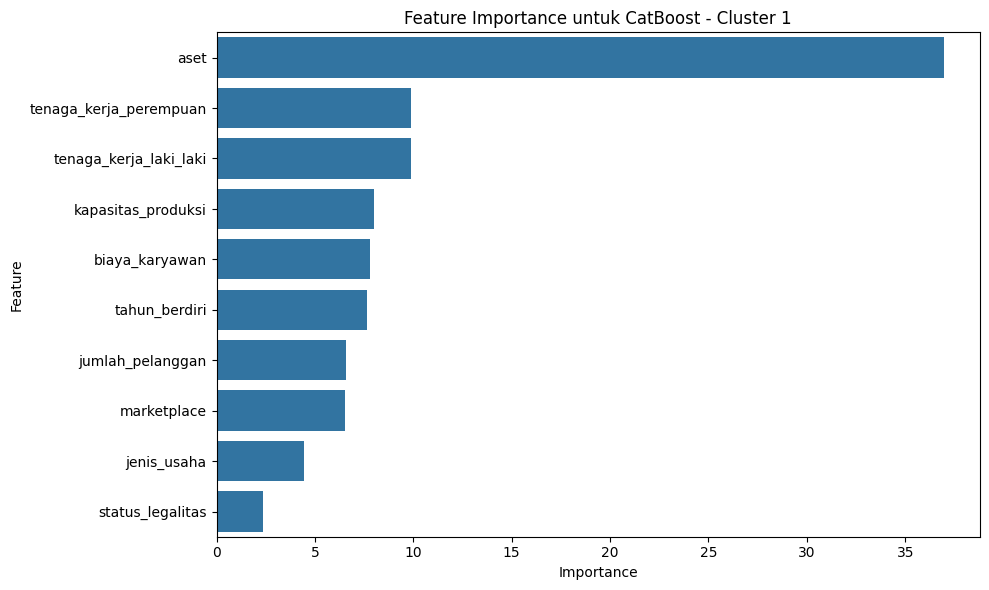


Menampilkan SHAP Summary untuk CatBoost - Cluster 1


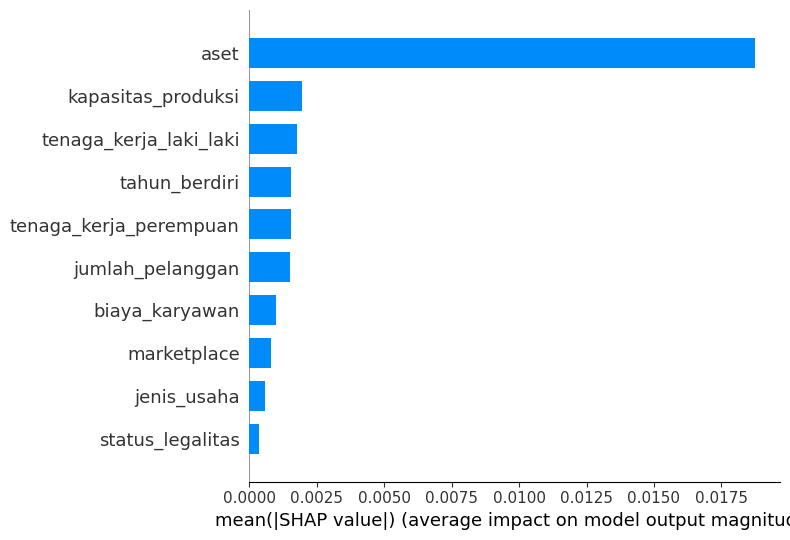

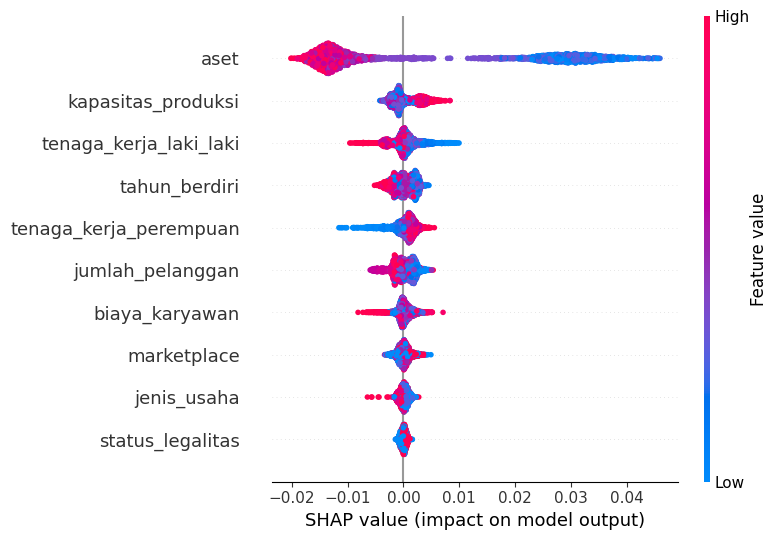




Hasil Evaluasi XGBoost untuk Klaster 11:
Best Parameters: {'n_estimators': 100, 'learning_rate': 0.0006873104833170136, 'max_depth': 6, 'subsample': 0.904085132528462, 'colsample_bytree': 0.9406830812636909, 'gamma': 0.695510128416534, 'reg_alpha': 0.018556312864901107, 'reg_lambda': 0.0003294302158081209, 'scale_pos_weight': 0.035455585207777356}
AUC: 0.5532
Balanced Accuracy: 0.5646

Hasil Evaluasi CatBoost untuk Klaster 11:
Best Parameters: {'iterations': 300, 'learning_rate': 0.0038870418918318756, 'depth': 5, 'subsample': 0.7400104344803765, 'l2_leaf_reg': 1.4573029299239013, 'border_count': 170, 'scale_pos_weight': 0.035455585207777356}
AUC: 0.5566
Balanced Accuracy: 0.5692

Hasil Evaluasi LightGBM untuk Klaster 11:
Best Parameters: {'n_estimators': 200, 'learning_rate': 0.008422054692371953, 'max_depth': 3, 'num_leaves': 52, 'subsample': 0.7909837759268404, 'colsample_bytree': 0.7027024167168407, 'reg_alpha': 0.0010858391234390532, 'reg_lambda': 0.018147241186082384, 'scale_p

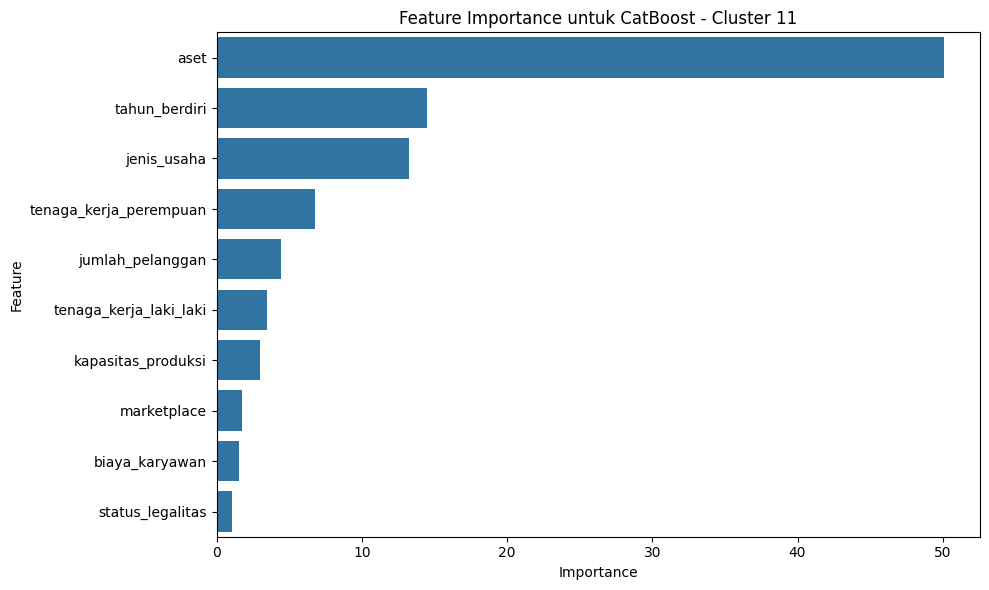


Menampilkan SHAP Summary untuk CatBoost - Cluster 11


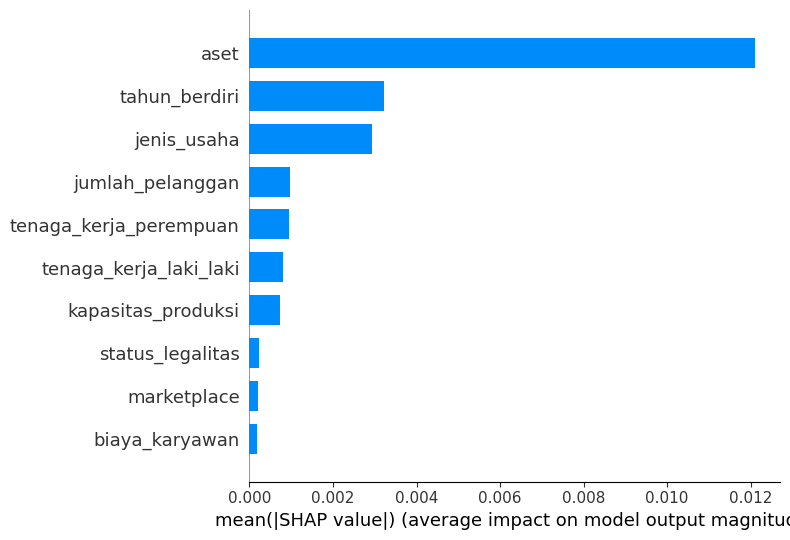

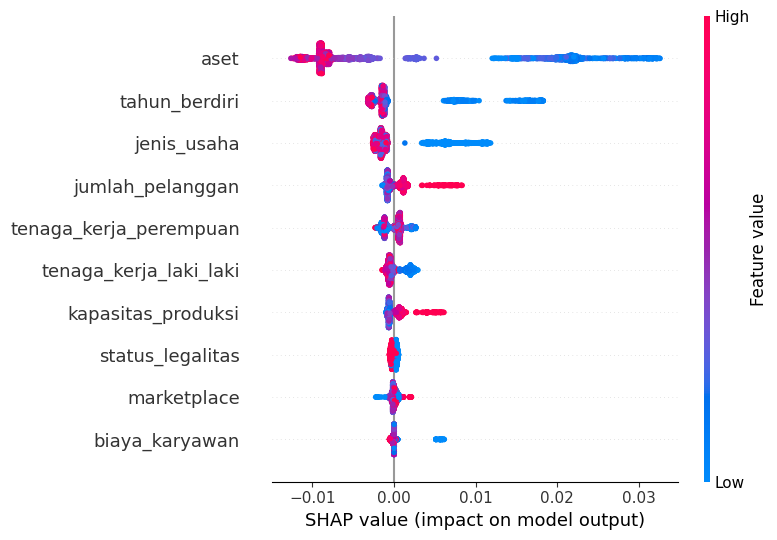




Hasil Evaluasi XGBoost untuk Klaster 10:
Best Parameters: {'n_estimators': 100, 'learning_rate': 0.0006873104833170136, 'max_depth': 6, 'subsample': 0.904085132528462, 'colsample_bytree': 0.9406830812636909, 'gamma': 0.695510128416534, 'reg_alpha': 0.018556312864901107, 'reg_lambda': 0.0003294302158081209, 'scale_pos_weight': 0.035455585207777356}
AUC: 0.6310
Balanced Accuracy: 0.5899

Hasil Evaluasi CatBoost untuk Klaster 10:
Best Parameters: {'iterations': 300, 'learning_rate': 0.0038870418918318756, 'depth': 5, 'subsample': 0.7400104344803765, 'l2_leaf_reg': 1.4573029299239013, 'border_count': 170, 'scale_pos_weight': 0.035455585207777356}
AUC: 0.6420
Balanced Accuracy: 0.6765

Hasil Evaluasi LightGBM untuk Klaster 10:
Best Parameters: {'n_estimators': 200, 'learning_rate': 0.008422054692371953, 'max_depth': 3, 'num_leaves': 52, 'subsample': 0.7909837759268404, 'colsample_bytree': 0.7027024167168407, 'reg_alpha': 0.0010858391234390532, 'reg_lambda': 0.018147241186082384, 'scale_p

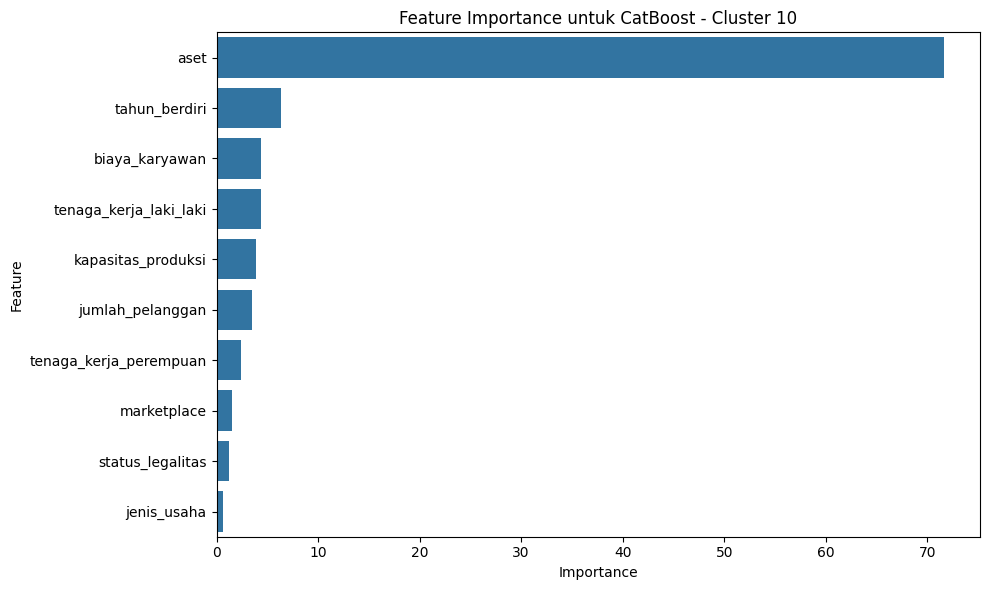


Menampilkan SHAP Summary untuk CatBoost - Cluster 10


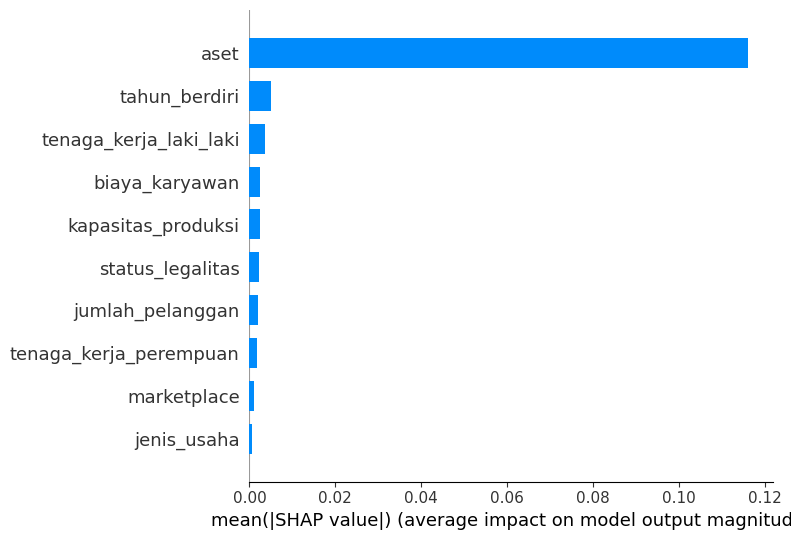

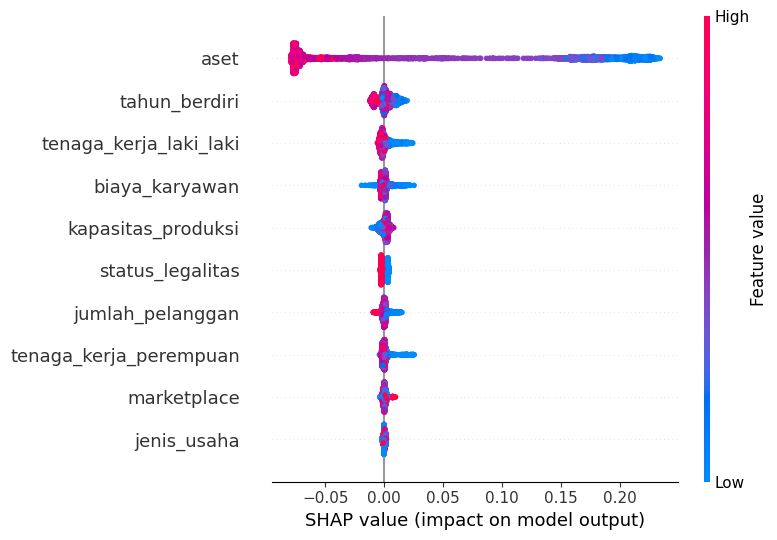




Hasil Evaluasi XGBoost untuk Klaster 0:
Best Parameters: {'n_estimators': 100, 'learning_rate': 0.0006873104833170136, 'max_depth': 6, 'subsample': 0.904085132528462, 'colsample_bytree': 0.9406830812636909, 'gamma': 0.695510128416534, 'reg_alpha': 0.018556312864901107, 'reg_lambda': 0.0003294302158081209, 'scale_pos_weight': 0.035455585207777356}
AUC: 0.7320
Balanced Accuracy: 0.7279

Hasil Evaluasi CatBoost untuk Klaster 0:
Best Parameters: {'iterations': 300, 'learning_rate': 0.0038870418918318756, 'depth': 5, 'subsample': 0.7400104344803765, 'l2_leaf_reg': 1.4573029299239013, 'border_count': 170, 'scale_pos_weight': 0.035455585207777356}
AUC: 0.7272
Balanced Accuracy: 0.6948

Hasil Evaluasi LightGBM untuk Klaster 0:
Best Parameters: {'n_estimators': 200, 'learning_rate': 0.008422054692371953, 'max_depth': 3, 'num_leaves': 52, 'subsample': 0.7909837759268404, 'colsample_bytree': 0.7027024167168407, 'reg_alpha': 0.0010858391234390532, 'reg_lambda': 0.018147241186082384, 'scale_pos_

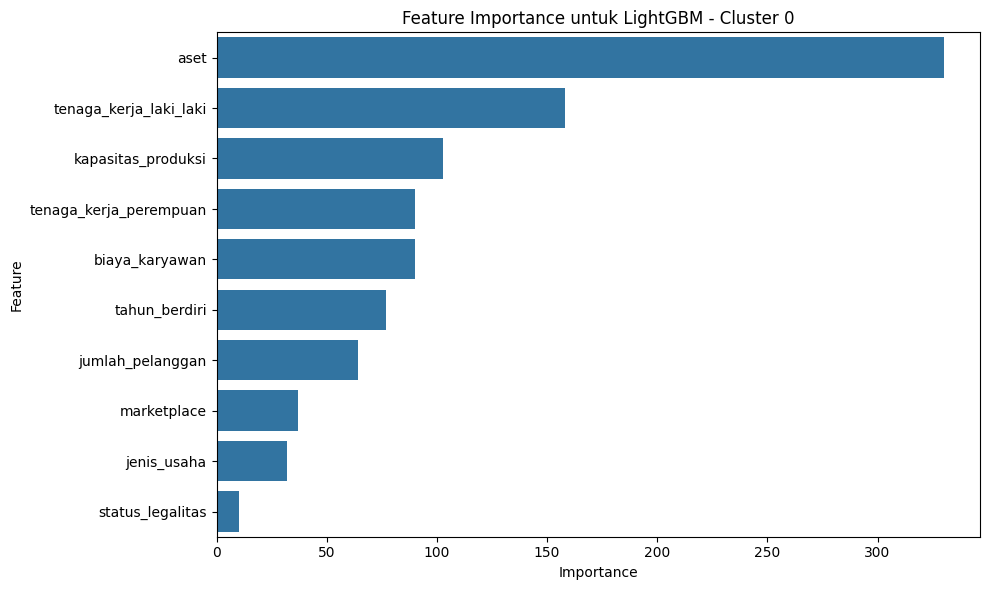


Menampilkan SHAP Summary untuk LightGBM - Cluster 0


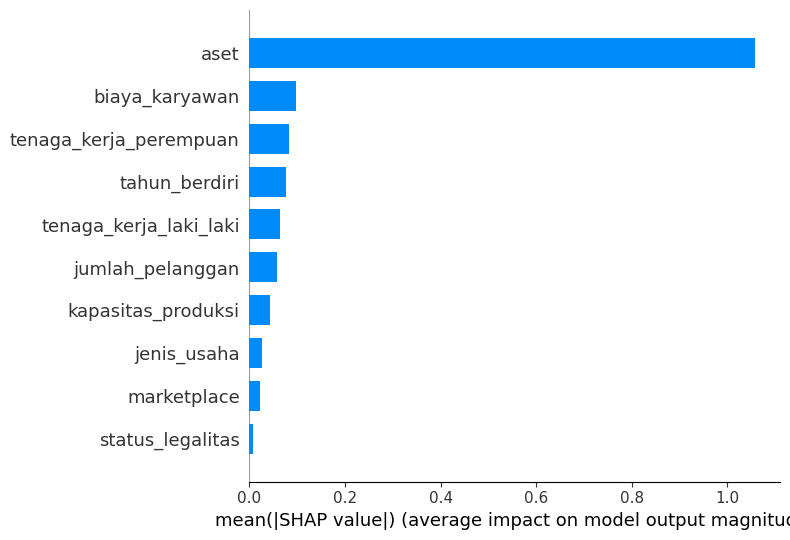

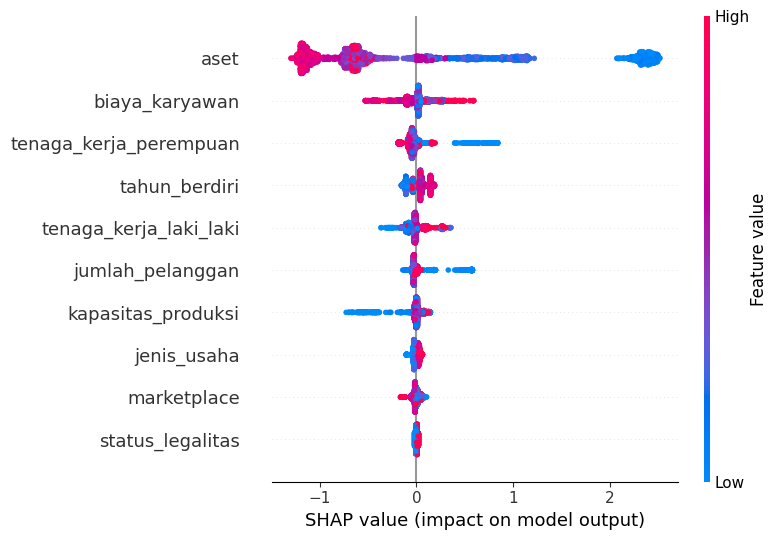

In [ ]:
import shap
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import balanced_accuracy_score, roc_auc_score

# Fungsi SHAP Summary untuk klasifikasi
def plot_shap_summary(best_model, model_name, cluster_id, X_train_cluster):
    print(f"\nMenampilkan SHAP Summary untuk {model_name} - Cluster {cluster_id}")
    try:
        if model_name in ['CatBoost', 'XGBoost', 'LightGBM', 'RandomForest']:
            explainer = shap.TreeExplainer(best_model)
            shap_values = explainer.shap_values(X_train_cluster)

            # SHAP Summary plot (untuk klasifikasi bisa menghasilkan array dua kelas)
            if isinstance(shap_values, list) and len(shap_values) == 2:
                shap.summary_plot(shap_values[1], X_train_cluster, show=True, plot_type='bar')
                shap.summary_plot(shap_values[1], X_train_cluster, show=True)
            else:
                shap.summary_plot(shap_values, X_train_cluster, show=True, plot_type='bar')
                shap.summary_plot(shap_values, X_train_cluster, show=True)
        else:
            print("Model tidak didukung untuk SHAP.")
    except Exception as e:
        print(f"Error saat menampilkan SHAP: {e}")

# Fungsi evaluasi model klasifikasi
def display_evaluation_results(model_results, model_name, cluster_id):
    print(f"\nHasil Evaluasi {model_name} untuk Klaster {cluster_id}:")
    result = model_results.get(cluster_id, {})
    if not result:
        print("Tidak ada hasil untuk klaster ini.")
        return

    print(f"Best Parameters: {result.get('Best Parameters', 'N/A')}")
    print(f"AUC: {result.get('AUC', float('nan')):.4f}")
    print(f"Balanced Accuracy: {result.get('Balanced Accuracy', float('nan')):.4f}")

# Simpan hasil evaluasi ke CSV
def save_comparison_to_csv(comparison_data, cluster_id):
    df_comparison = pd.DataFrame(comparison_data)
    file_name = f"model_comparison_cluster_{cluster_id}.csv"
    df_comparison.to_csv(PATH + file_name, index=False)
    return df_comparison

# Plot feature importance
def plot_feature_importance(best_model, model_name, cluster_id, X_columns):
    try:
        if hasattr(best_model, 'feature_importances_'):
            importances = best_model.feature_importances_
        elif hasattr(best_model, 'get_feature_importance'):
            importances = best_model.get_feature_importance()
        else:
            print(f"Model {model_name} tidak memiliki feature importance.")
            return

        feature_importance_df = pd.DataFrame({
            'Feature': X_columns,
            'Importance': importances
        }).sort_values(by='Importance', ascending=False)

        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
        plt.title(f'Feature Importance untuk {model_name} - Cluster {cluster_id}')
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error saat menampilkan feature importance: {e}")

# Evaluasi semua cluster
for cluster_id in dfs_per_cluster.keys():
    comparison_data = {
        'Model': ['XGBoost', 'CatBoost', 'LightGBM', 'RandomForest'],
        'AUC': [],
        'Balanced Accuracy': []
    }

    for model_name in comparison_data['Model']:
        result = results.get(model_name, {}).get(cluster_id, {})
        comparison_data['AUC'].append(result.get('AUC', None))
        comparison_data['Balanced Accuracy'].append(result.get('Balanced Accuracy', None))

        display_evaluation_results(results.get(model_name, {}), model_name, cluster_id)

    # Simpan dan tampilkan tabel perbandingan
    df_comparison = save_comparison_to_csv(comparison_data, cluster_id)
    print(f"\nTabel Perbandingan untuk Klaster {cluster_id}:")
    print(df_comparison)

    # Model terbaik berdasarkan AUC dan Balanced Accuracy
    best_model_auc = df_comparison.loc[df_comparison['AUC'].idxmax()]['Model']
    best_model_balacc = df_comparison.loc[df_comparison['Balanced Accuracy'].idxmax()]['Model']
    print(f"Best Model berdasarkan AUC: {best_model_auc}")
    print(f"Best Model berdasarkan Balanced Accuracy: {best_model_balacc}")

    # Visualisasi model terbaik berdasarkan AUC
    if best_model_auc in models:
        best_model = models[best_model_auc].get(cluster_id)
        if best_model:
            X_train_cluster = dfs_per_cluster[cluster_id][X_columns]
            plot_feature_importance(best_model, best_model_auc, cluster_id, X_columns)
            plot_shap_summary(best_model, best_model_auc, cluster_id, X_train_cluster)

    print("\n" + "="*80 + "\n")